In [1]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from tqdm import trange
from tqdm import tqdm
import time
from numba import jit

In [2]:
from jupyterthemes.stylefx import set_nb_theme
set_nb_theme('solarizedl')
#set_nb_theme('solarizedd')

In [3]:
np.__version__

'1.16.3'

In [4]:
#LineProfiler

from __future__ import print_function # Always do this >:( 
from __future__ import division
%load_ext line_profiler

In [5]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [6]:
@jit
def galdtype_darksage(Nannuli=30):
    floattype = np.float32
    Galdesc_full = [
                    ('Type'                         , np.int32),
                    ('GalaxyIndex'                  , np.int64),
                    ('HaloIndex'                    , np.int32),
                    ('SimulationHaloIndex'          , np.int32),
                    ('TreeIndex'                    , np.int32),
                    ('SnapNum'                      , np.int32),
                    ('CentralGalaxyIndex'           , np.int64),
                    ('CentralMvir'                  , floattype),
                    ('mergeType'                    , np.int32),
                    ('mergeIntoID'                  , np.int32),
                    ('mergeIntoSnapNum'             , np.int32),
                    ('dT'                           , floattype),
                    ('Pos'                          , (floattype, 3)),
                    ('Vel'                          , (floattype, 3)),
                    ('Spin'                         , (floattype, 3)),
                    ('Len'                          , np.int32),
                    ('LenMax'                       , np.int32),
                    ('Mvir'                         , floattype),
                    ('Rvir'                         , floattype),
                    ('Vvir'                         , floattype),
                    ('Vmax'                         , floattype),
                    ('VelDisp'                      , floattype),
                    ('DiscRadii'                    , (floattype, Nannuli+1)), 
                    ('ColdGas'                      , floattype),
                    ('StellarMass'                  , floattype),
                    ('MergerBulgeMass'              , floattype),
                    ('InstabilityBulgeMass'          , floattype),
                    ('HotGas'                       , floattype),
                    ('EjectedMass'                  , floattype),
                    ('BlackHoleMass'                , floattype),
                    ('IntraClusterStars'            , floattype),
                    ('DiscGas'                      , (floattype, Nannuli)),
                    ('DiscStars'                    , (floattype, Nannuli)),
                    ('SpinStars'                    , (floattype, 3)),
                    ('SpinGas'                      , (floattype, 3)),
                    ('SpinClassicalBulge'           , (floattype, 3)),
                    ('StarsInSitu'                  , floattype),
                    ('StarsInstability'             , floattype),
                    ('StarsMergeBurst'              , floattype),
                    ('DiscHI'                       , (floattype, Nannuli)),
                    ('DiscH2'                       , (floattype, Nannuli)),
                    ('DiscSFR'                      , (floattype, Nannuli)), 
                    ('MetalsColdGas'                , floattype),
                    ('MetalsStellarMass'            , floattype),
                    ('ClassicalMetalsBulgeMass'     , floattype),
                    ('SecularMetalsBulgeMass'       , floattype),
                    ('MetalsHotGas'                 , floattype),
                    ('MetalsEjectedMass'            , floattype),
                    ('MetalsIntraClusterStars'      , floattype),
                    ('DiscGasMetals'                , (floattype, Nannuli)),
                    ('DiscStarsMetals'              , (floattype, Nannuli)),
                    ('SfrFromH2'                    , floattype),
                    ('SfrInstab'                    , floattype),
                    ('SfrMergeBurst'                , floattype),
                    ('SfrDiskZ'                     , floattype),
                    ('SfrBulgeZ'                    , floattype),
                    ('DiskScaleRadius'              , floattype),
                    ('CoolScaleRadius'              , floattype), 
                    ('StellarDiscScaleRadius'       , floattype),
                    ('Cooling'                      , floattype),
                    ('Heating'                      , floattype),
                    ('LastMajorMerger'              , floattype),
                    ('LastMinorMerger'              , floattype),
                    ('OutflowRate'                  , floattype),
                    ('infallMvir'                   , floattype),
                    ('infallVvir'                   , floattype),
                    ('infallVmax'                   , floattype)
                    ]
    names = [Galdesc_full[i][0] for i in range(len(Galdesc_full))]
    formats = [Galdesc_full[i][1] for i in range(len(Galdesc_full))]
    Galdesc = np.dtype({'names':names, 'formats':formats}, align=True)
    return Galdesc

# Plot

In [7]:
#print(range(30,60))

In [8]:
# Make plots for z=0 galaxies that are typically used to constrain Dark Sage.

from pylab import *
import os
import routines as r
import random

# Warnings are annoying
import warnings
warnings.filterwarnings("ignore")


###### USER NEEDS TO SET THESE THINGS ######
indir = '/fred/oz042/rdzudzar/simulation_catalogs/darksage/millennium_latest/output/' # directory where the Dark Sage data are
sim = 1 # which simulation Dark Sage has been run on -- if it's new, you will need to set its defaults below.
#   0 = Mini Millennium, 1 = Full Millennium, 2 = SMDPL

fpre = 'model_z0.000' # what is the prefix name of the z=0 files
files = range(30) # list of file numbers you want to read

Nannuli = 30 # number of annuli used for discs in Dark Sage
FirstBin = 1.0 # copy from parameter file -- sets the annuli's sizes
ExponentBin = 1.4
###### ============================== ######



##### SIMULATION DEFAULTS #####
if sim==0:
    h = 0.73
    Lbox = 62.5/h * (len(files)/8.)**(1./3)
elif sim==1:
    h = 0.73
    Lbox = 500.0/h * (len(files)/512.)**(1./3)
elif sim==2:
    h = 0.6777
    Lbox = 400.0/h * (len(files)/1000.)**(1./3)
# add here 'elif sim==3:' etc for a new simulation
else:
    print('Please specify a valid simulation.  You may need to add its defaults to this code.')
    quit()
######  ================= #####


In [9]:
##### READ DARK SAGE DATA #####
DiscBinEdge = np.append(0, np.array([FirstBin*ExponentBin**i for i in range(Nannuli)])) / h
G = r.darksage_snap(indir+fpre, files, Nannuli=Nannuli)
######  ================= #####


100%|██████████| 29/29 [00:19<00:00,  1.47it/s]


In [10]:
##### SET PLOTTING DEFAULTS #####
fsize = 26
matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})

NpartMed = 100 # minimum number of particles for finding relevant medians for minima on plots

outdir = '/fred/oz042/rdzudzar/python/' # where the plots will be saved
if not os.path.exists(outdir): os.makedirs(outdir)
######  =================== #####

# Make G dataftrame for galaxies with LenMax>=100

In [11]:
# Make a sub_section of dataframe G so that it is controlled by the LenMax
print(len(G['LenMax']))
G = G [G['LenMax']>=100 ]
print(len(G['LenMax']))

1027197
298287


## Want to store output as Pandas dataframe; Have to convert multidimensional arrays into Pandas series first:

In [12]:
import pandas as pd

In [10]:
# This is a way to converte multi dimensional data into pd.Series and then load these into the pandas dataframe
Pos = []
for p in G['Pos']:
    Pos.append(p)
Pos_df = pd.Series(Pos, dtype=np.dtype("object"))

Vel = []
for v in G['Vel']:
    Vel.append(v)
Vel_df = pd.Series(Vel, dtype=np.dtype("object"))

Spin = []
for s in G['Spin']:
    Spin.append(s)
Spin_df = pd.Series(Spin, dtype=np.dtype("object"))

Disc_r = []
for d in G['DiscRadii']:
    Disc_r.append(d)
Disc_df = pd.Series(Disc_r, dtype=np.dtype("object"))

Disc_gas = []
for g in G['DiscGas']:
    Disc_gas.append(g)
Disc_gas_df = pd.Series(Disc_gas, dtype=np.dtype("object"))

Disc_stars = []
for g in G['DiscStars']:
    Disc_stars.append(g)
Disc_stars_df = pd.Series(Disc_stars, dtype=np.dtype("object"))

SpinStars = []
for g in G['SpinStars']:
    SpinStars.append(g)
SpinStars_df = pd.Series(SpinStars, dtype=np.dtype("object"))

SpinGas = []
for g in G['SpinGas']:
    SpinGas.append(g)
SpinGas_df = pd.Series(SpinGas , dtype=np.dtype("object"))

SpinClassicalBulge = []
for g in G['SpinClassicalBulge']:
    SpinClassicalBulge.append(g)
SpinClassicalBulge_df = pd.Series(SpinClassicalBulge, dtype=np.dtype("object"))

DiscHI = []
for g in G['DiscHI']:
    DiscHI.append(g)
DiscHI_df = pd.Series(DiscHI, dtype=np.dtype("object"))

DiscH2 = []
for g in G['DiscH2']:
    DiscH2.append(g)
DiscH2_df = pd.Series(DiscH2, dtype=np.dtype("object"))

DiscSFR = []
for g in G['DiscSFR']:
    DiscSFR.append(g)
DiscSFR_df = pd.Series(DiscSFR, dtype=np.dtype("object"))

DiscGasMetals = []
for g in G['DiscGasMetals']:
    DiscGasMetals.append(g)
DiscGasMetals_df = pd.Series(DiscGasMetals, dtype=np.dtype("object"))

DiscStarsMetals = []
for g in G['DiscStarsMetals']:
    DiscStarsMetals.append(g)
DiscStarsMetals_df = pd.Series(DiscStarsMetals, dtype=np.dtype("object"))


# Storing DarkSage output as Pandas dataframe: DS

In [10]:
DS = pd.DataFrame({'Type'   : G['Type'                      ],
'GalaxyIndex'               : G['GalaxyIndex'               ],
'HaloIndex'                 : G['HaloIndex'                 ],
'SimulationHaloIndex'       : G['SimulationHaloIndex'       ],
'TreeIndex'                 : G['TreeIndex'                 ],
'SnapNum'                   : G['SnapNum'                   ],
'CentralGalaxyIndex'        : G['CentralGalaxyIndex'        ],
'CentralMvir'               : G['CentralMvir'               ],
'mergeType'                 : G['mergeType'                 ],
'mergeIntoID'               : G['mergeIntoID'               ],
'mergeIntoSnapNum'          : G['mergeIntoSnapNum'          ],
'dT'                        : G['dT'                        ],
'Pos'                       : Pos_df,
'Vel'                       : Vel_df                       ,
'Spin'                      : Spin_df                      ,
'Len'                       : G['Len'                       ],
'LenMax'                    : G['LenMax'                    ],
'Mvir'                      : G['Mvir'                      ],
'Rvir'                      : G['Rvir'                      ],
'Vvir'                      : G['Vvir'                      ],
'Vmax'                      : G['Vmax'                      ],
'VelDisp'                   : G['VelDisp'                   ],
'DiscRadii'                 : Disc_df,
'ColdGas'                   : G['ColdGas'                   ],
'StellarMass'               : G['StellarMass'               ],
'MergerBulgeMass'           : G['MergerBulgeMass'           ],
'InstabilityBulgeMass'      : G['InstabilityBulgeMass'      ],
'HotGas'                    : G['HotGas'                    ],
'EjectedMass'               : G['EjectedMass'               ],
'BlackHoleMass'             : G['BlackHoleMass'             ],
'IntraClusterStars'         : G['IntraClusterStars'         ],
'DiscGas'                   : Disc_gas_df,
'DiscStars'                 : Disc_stars_df,
'SpinStars'                 : SpinStars_df,
'SpinGas'                   : SpinGas_df,
'SpinClassicalBulge'        : SpinClassicalBulge_df,
'StarsInSitu'               : G['StarsInSitu'               ],
'StarsInstability'          : G['StarsInstability'          ],
'StarsMergeBurst'           : G['StarsMergeBurst'           ],
'DiscHI'                    : DiscHI_df,
'DiscH2'                    : DiscH2_df,
'DiscSFR'                   : DiscSFR_df,
'MetalsColdGas'             : G['MetalsColdGas'             ],
'MetalsStellarMass'         : G['MetalsStellarMass'         ],
'ClassicalMetalsBulgeMass'  : G['ClassicalMetalsBulgeMass'  ],
'SecularMetalsBulgeMass'    : G['SecularMetalsBulgeMass'    ],
'MetalsHotGas'              : G['MetalsHotGas'              ],
'MetalsEjectedMass'         : G['MetalsEjectedMass'         ],
'MetalsIntraClusterStars'   : G['MetalsIntraClusterStars'   ],
'DiscGasMetals'             : DiscGasMetals_df,
'DiscStarsMetals'           : DiscStarsMetals_df,
'SfrFromH2'                 : G['SfrFromH2'                 ],
'SfrInstab'                 : G['SfrInstab'                 ],
'SfrMergeBurst'             : G['SfrMergeBurst'             ],
'SfrDiskZ'                  : G['SfrDiskZ'                  ],
'SfrBulgeZ'                 : G['SfrBulgeZ'                 ],
'DiskScaleRadius'           : G['DiskScaleRadius'           ],
'CoolScaleRadius'           : G['CoolScaleRadius'           ],
'StellarDiscScaleRadius'    : G['StellarDiscScaleRadius'    ],
'Cooling'                   : G['Cooling'                   ],
'Heating'                   : G['Heating'                   ],
'LastMajorMerger'           : G['LastMajorMerger'           ],
'LastMinorMerger'           : G['LastMinorMerger'           ],
'OutflowRate'               : G['OutflowRate'               ],
'infallMvir'                : G['infallMvir'                ],
'infallVvir'                : G['infallVvir'                ],
'infallVmax'                : G['infallVmax'                ]})


In [11]:
DS.columns

Index(['BlackHoleMass', 'CentralGalaxyIndex', 'CentralMvir',
       'ClassicalMetalsBulgeMass', 'ColdGas', 'CoolScaleRadius', 'Cooling',
       'DiscGas', 'DiscGasMetals', 'DiscH2', 'DiscHI', 'DiscRadii', 'DiscSFR',
       'DiscStars', 'DiscStarsMetals', 'DiskScaleRadius', 'EjectedMass',
       'GalaxyIndex', 'HaloIndex', 'Heating', 'HotGas', 'InstabilityBulgeMass',
       'IntraClusterStars', 'LastMajorMerger', 'LastMinorMerger', 'Len',
       'LenMax', 'MergerBulgeMass', 'MetalsColdGas', 'MetalsEjectedMass',
       'MetalsHotGas', 'MetalsIntraClusterStars', 'MetalsStellarMass', 'Mvir',
       'OutflowRate', 'Pos', 'Rvir', 'SecularMetalsBulgeMass', 'SfrBulgeZ',
       'SfrDiskZ', 'SfrFromH2', 'SfrInstab', 'SfrMergeBurst',
       'SimulationHaloIndex', 'SnapNum', 'Spin', 'SpinClassicalBulge',
       'SpinGas', 'SpinStars', 'StarsInSitu', 'StarsInstability',
       'StarsMergeBurst', 'StellarDiscScaleRadius', 'StellarMass', 'TreeIndex',
       'Type', 'Vel', 'VelDisp', 'Vmax', 'Vvir', '

# My stuff

### Cut based on the stellar mass
### The HI mass: np.sum(G['DiscHI'],axis=1)

In [13]:
#Mass resolution 8.6x10^8 Msun/h  
#Make a cut at stellar masses of logMstar=8.8 -- based on the 100 particle median mass -- shown above
#0.088*h is 0.06424 which then becomes cut of 8.8 when divided with h
Stellar_mass_cut = G['StellarMass'] [ G['StellarMass']>0.06424 ]/h
HI_mass_cut = np.sum(G['DiscHI'],axis=1) [ G['StellarMass']>0.06424 ]/h
Mvir_mass_cut = G['Mvir'] [ G['StellarMass']>0.06424 ]/h

In [14]:
print(len(Stellar_mass_cut))

271657


In [15]:
#CENTRALS
Mstellar_central_galaxies_cut = G['StellarMass'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424)]/h
Mcoldgas_central_galaxies_cut = np.sum(G['DiscHI'],axis=1) [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
Mvir_central_galaxies_cut = G['Mvir'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h


In [16]:
#SATELLITES
Mstellar_satellite_galaxies_cut = G['StellarMass'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
Mcoldgas_satellite_galaxies_cut = np.sum(G['DiscHI'],axis=1) [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
Mvir_satellite_galaxies_cut = G['Mvir'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h


In [17]:
#TO STORE VARIABLES WHICH CAN BE USED IN ANOTHER NOTEBOOK
#central
%store Mstellar_central_galaxies_cut 
%store Mcoldgas_central_galaxies_cut 
%store Mvir_central_galaxies_cut
#satellite
%store Mstellar_satellite_galaxies_cut 
%store Mcoldgas_satellite_galaxies_cut 
%store Mvir_satellite_galaxies_cut

Stored 'Mstellar_central_galaxies_cut' (ndarray)
Stored 'Mcoldgas_central_galaxies_cut' (ndarray)
Stored 'Mvir_central_galaxies_cut' (ndarray)
Stored 'Mstellar_satellite_galaxies_cut' (ndarray)
Stored 'Mcoldgas_satellite_galaxies_cut' (ndarray)
Stored 'Mvir_satellite_galaxies_cut' (ndarray)


# Plot MHI vs M* relation

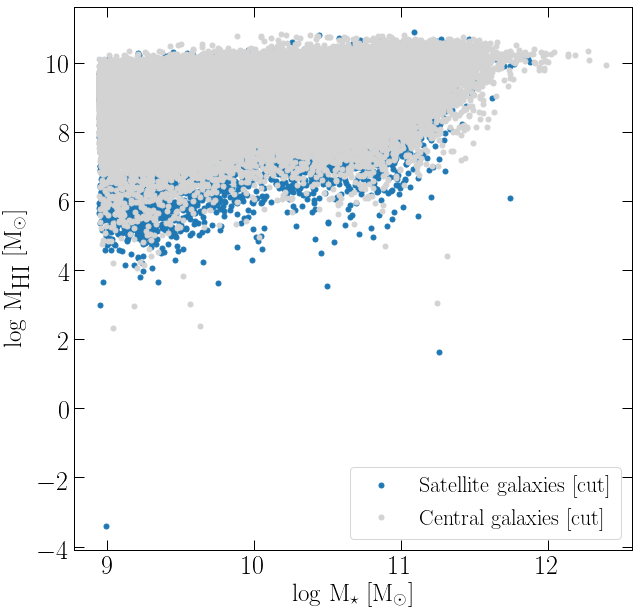

In [17]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Mstellar_satellite_galaxies_cut*10**10)) ,np.log10( (Mcoldgas_satellite_galaxies_cut*10**10)), 'o', color='#1f78b4', markersize=5, label=r'Satellite galaxies [cut]')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Mstellar_central_galaxies_cut*10**10)) ,np.log10( (Mcoldgas_central_galaxies_cut*10**10)), 'o', color='lightgrey', markersize=5, label=r'Central galaxies [cut]')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
plt.show()

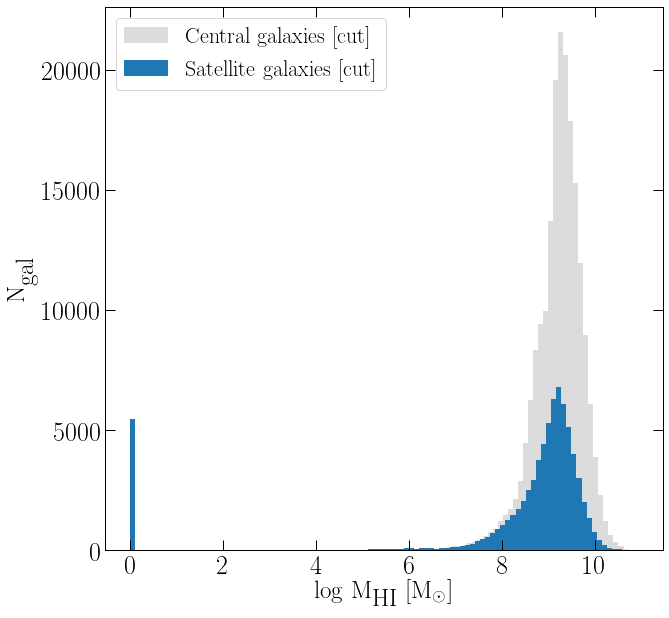

In [18]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.hist( np.log10(Mcoldgas_central_galaxies_cut*1e10+1), bins=100, color='lightgrey', alpha=0.8, label=r'Central galaxies [cut]')
plt.hist(np.log10(Mcoldgas_satellite_galaxies_cut*1e10+1), bins=100, color='#1f78b4', alpha=1, label=r'Satellite galaxies [cut]')


ax.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=25)
ax.set_xlabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
#plt.xlim(-0.1, 3)
plt.show()

In [19]:
# Should be the same with and without LenMax cut if I'm using the updated G dataframe where galaxies are already removed which have smaller LenMax
LenMaxCut = 80

Mlen_central = G['LenMax'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424)& (G['LenMax']>=LenMaxCut)]/h
Mlen_all_central = G['LenMax'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424)]/h
print(len(Mlen_central))
print(len(Mlen_all_central))

Mlen_sat = G['LenMax'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (G['LenMax']>=LenMaxCut)]/h
Mlen_all_sat = G['LenMax'] [ (G['CentralGalaxyIndex']!=G['GalaxyIndex']) & (G['StellarMass']>0.06424) ]/h
print(len(Mlen_sat))
print(len(Mlen_all_sat))

# These numbers are for the first 30 files in BigBox
#50 Particles: 224298   224682   89236   89552
#60 Particles: 223043   224682   88119   89552  ~1700 less centrals; ~1500 less satellites
#70 Particles: 220066   224682   85638   89552  ~5000 less centrals; ~4000 less satellites
#80 Particles: 214977   224682   82003   89552  ~10 000 less centrals; ~4000 less satellites
#90 Particles: 207607   224682   77608   89552
#100 Particles: 198476  224682   73181   89552

198476
198476
73181
73181


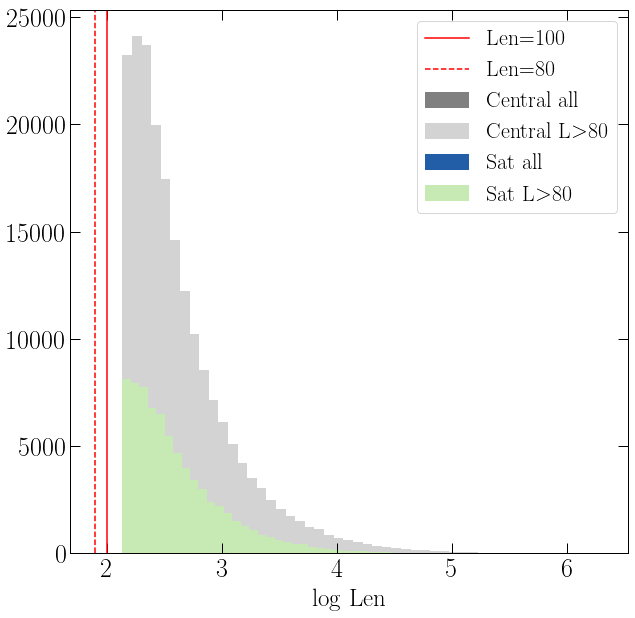

In [20]:

fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.hist( np.log10(Mlen_all_central), bins=50, color='grey',  label=r'Central all')
plt.hist( np.log10(Mlen_central), bins=50, color='lightgrey',  label=r'Central L$>${0}'.format(LenMaxCut))
plt.hist( np.log10(Mlen_all_sat), bins=50, color='#225ea8',  label=r'Sat all')
plt.hist( np.log10(Mlen_sat), bins=50, color='#c7e9b4',  label=r'Sat L$>${0}'.format(LenMaxCut))


plt.axvline(2, 0, label='Len=100', color='red')
plt.axvline(1.903089, 0, label='Len=80', color='red', linestyle='--')

ax.set_xlabel(r'log Len', fontsize=25)
#ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
plt.show()

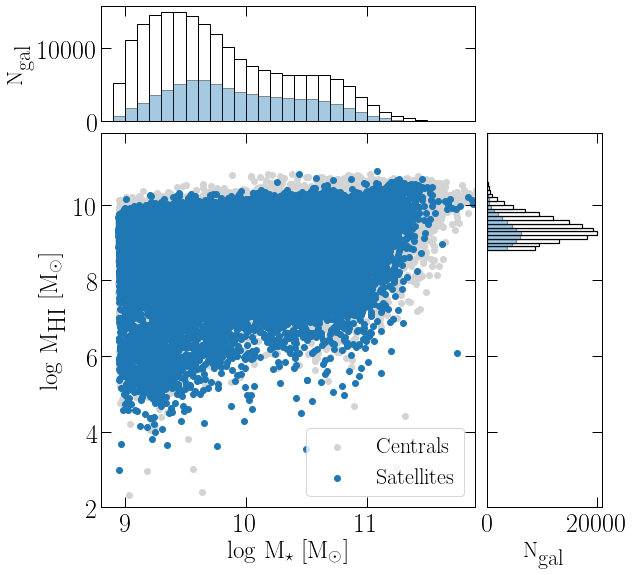

In [21]:
from matplotlib.ticker import NullFormatter

# the random data
x = np.log10( (Mstellar_satellite_galaxies_cut*10**10)) 
y = np.log10( (Mcoldgas_satellite_galaxies_cut*10**10+1))

w = np.log10( (Mstellar_central_galaxies_cut*10**10))
z = np.log10( (Mcoldgas_central_galaxies_cut*10**10+1))

nullfmt = NullFormatter()         # no labels

# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
bottom_h = left_h = left + width + 0.02

rect_scatter = [left, bottom, width, height]
rect_histx = [left, bottom_h, width, 0.2]
rect_histy = [left_h, bottom, 0.2, height]

# start with a rectangular Figure
plt.figure(1, figsize=(8, 8))

axScatter = plt.axes(rect_scatter)
axHistx = plt.axes(rect_histx)
axHisty = plt.axes(rect_histy)

# no labels
axHistx.xaxis.set_major_formatter(nullfmt)
axHisty.yaxis.set_major_formatter(nullfmt)

# the scatter plot:
axScatter.scatter(w, z, color='lightgrey', label='Centrals')
axScatter.scatter(x, y, color='#1f78b4', label='Satellites')

axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

# now determine nice limits by hand:
binwidth = 0.1
xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(y))])
lim = (int(xymax/binwidth) + 1) * binwidth

axScatter.set_xlim((8.8, lim))
axScatter.set_ylim((2, lim))

bins = np.arange(8.8, lim + binwidth, binwidth)
axHistx.hist(w, bins=bins, color='white', edgecolor='k', linewidth=1)
axHisty.hist(z, bins=bins, orientation='horizontal', color='white', edgecolor='k', linewidth=1.2)

axHistx.hist(x, bins=bins, color='#1f78b4',alpha=0.4, edgecolor='black', linewidth=1)
axHisty.hist(y, bins=bins, orientation='horizontal', color='#1f78b4', alpha=0.4, edgecolor='black', linewidth=1.2)

axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)

axHistx.set_xlim(axScatter.get_xlim())
axHisty.set_ylim(axScatter.get_ylim())

axScatter.legend()


plt.show()

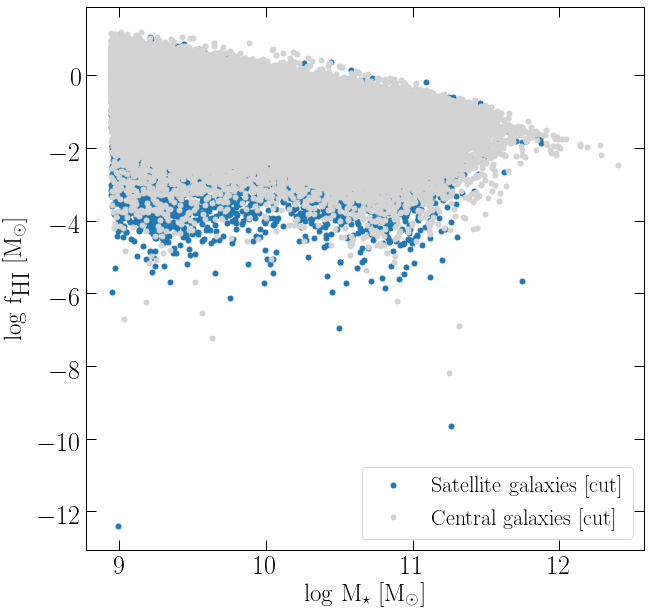

In [22]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Mstellar_satellite_galaxies_cut*1e10)) ,np.log10( (Mcoldgas_satellite_galaxies_cut*1e10)/(Mstellar_satellite_galaxies_cut*1e10)), 'o', color='#1f78b4', markersize=5, label=r'Satellite galaxies [cut]')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Mstellar_central_galaxies_cut*1e10)) ,np.log10( (Mcoldgas_central_galaxies_cut*1e10)/(Mstellar_central_galaxies_cut*1e10)), 'o', color='lightgrey', markersize=5, label=r'Central galaxies [cut]')

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log f$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
 
plt.legend()
plt.show()

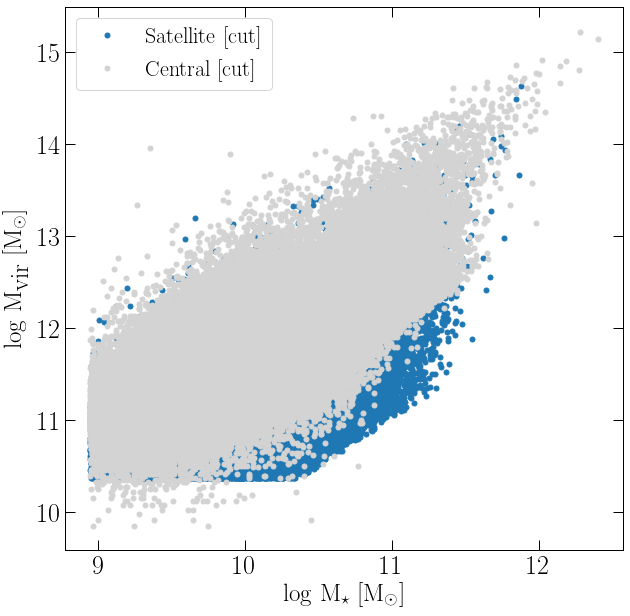

In [23]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Mstellar_satellite_galaxies_cut*1e10)) ,np.log10( (Mvir_satellite_galaxies_cut*1e10)), 'o', color='#1f78b4', markersize=5, label=r'Satellite [cut]')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Mstellar_central_galaxies_cut*1e10)) ,np.log10( (Mvir_central_galaxies_cut*1e10)), 'o', color='lightgrey', markersize=5, label=r'Central [cut]')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{vir}}$ [M$_{\odot}$]',fontsize=25)

plt.legend()
plt.show()

## Bulge-to-total ratio (All)
##### I want to see only late-type galaxies

In [24]:
BTT = (G['InstabilityBulgeMass'] + G['MergerBulgeMass']) / ( G['StellarMass'] ) # Find bulge to total ratio

# Including a cut in stellar mass
BTT_Disc = BTT[ ( G['StellarMass']>0.06424 ) & (BTT <= 0.5) ] # Disc dominated
BTT_Bulge = BTT[ ( G['StellarMass']>0.06424 ) & (BTT > 0.5) ] # Bulge dominated

Disc_dominated_SM = G['StellarMass'][ (G['StellarMass']>0.06424) & (BTT <= 0.5) ]
Bulge_dominated_SM = G['StellarMass'][ (G['StellarMass']>0.06424) & (BTT > 0.5) ]

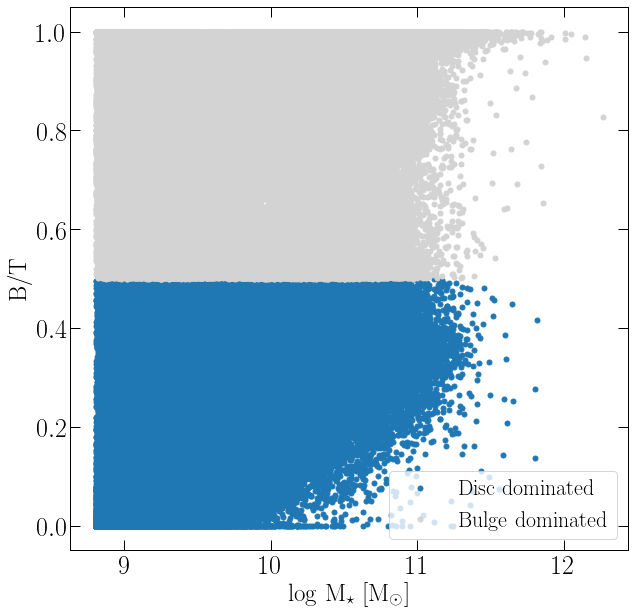

In [25]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

plt.plot( np.log10( (Disc_dominated_SM*1e10)) ,BTT_Disc, 'o', color='#1f78b4', markersize=5, label=r'Disc dominated')
#plt.plot(cut_stell*1e10/h, 'o', color='r')
plt.plot( np.log10( (Bulge_dominated_SM*1e10)) ,BTT_Bulge, 'o', color='lightgrey', markersize=5, label=r'Bulge dominated')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'B/T',fontsize=25)

plt.legend()
plt.show()

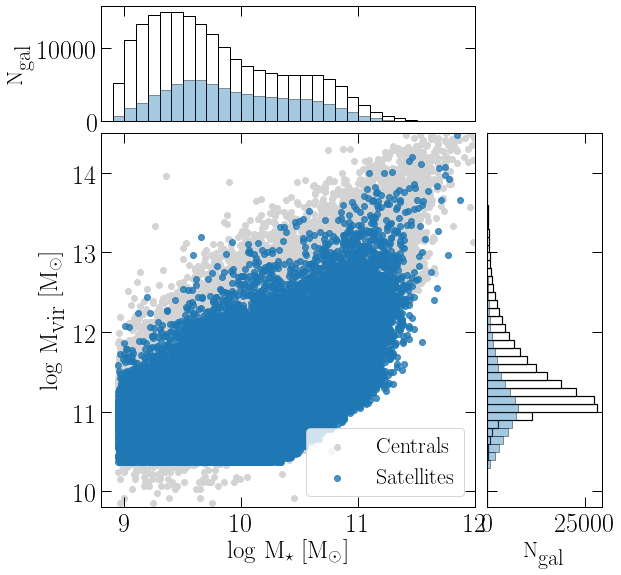

In [26]:
from matplotlib.ticker import NullFormatter

# the random data
x = np.log10( (Mstellar_satellite_galaxies_cut*10**10)) 
y = np.log10( (Mvir_satellite_galaxies_cut*1e10))

w = np.log10( (Mstellar_central_galaxies_cut*10**10))
z = np.log10( (Mvir_central_galaxies_cut*1e10))

nullfmt = NullFormatter()         # no labels

# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
bottom_h = left_h = left + width + 0.02

rect_scatter = [left, bottom, width, height]
rect_histx = [left, bottom_h, width, 0.2]
rect_histy = [left_h, bottom, 0.2, height]

# start with a rectangular Figure
plt.figure(1, figsize=(8, 8))

axScatter = plt.axes(rect_scatter)
axHistx = plt.axes(rect_histx)
axHisty = plt.axes(rect_histy)

# no labels
axHistx.xaxis.set_major_formatter(nullfmt)
axHisty.yaxis.set_major_formatter(nullfmt)

# the scatter plot:
axScatter.scatter(w, z, color='lightgrey', label='Centrals')
axScatter.scatter(x, y, color='#1f78b4', label='Satellites', alpha=0.8)

axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
axScatter.set_ylabel(r'log M$_{\textrm{vir}}$ [M$_{\odot}$]',fontsize=25)

# now determine nice limits by hand:
binwidth = 0.1
xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(y))])
lim = (int(xymax/binwidth) + 1) * binwidth

axScatter.set_xlim((8.8, 12))
axScatter.set_ylim((9.8, 14.5))

bins = np.arange(8.8, lim + binwidth, binwidth)
axHistx.hist(w, bins=bins, color='white', edgecolor='k', linewidth=1)
axHisty.hist(z, bins=bins, orientation='horizontal', color='white', edgecolor='k', linewidth=1.2)

axHistx.hist(x, bins=bins, color='#1f78b4',alpha=0.4, edgecolor='black', linewidth=1)
axHisty.hist(y, bins=bins, orientation='horizontal', color='#1f78b4', alpha=0.4, edgecolor='black', linewidth=1)

axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)

axHistx.set_xlim(axScatter.get_xlim())
axHisty.set_ylim(axScatter.get_ylim())

axScatter.legend(loc=4)


plt.show()

# Find for each central galaxy its satellites

In [27]:
#Central_g_stellar_mass = G['StellarMass'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (np.sum(G['DiscHI'],axis=1)!=0)]/h
#Central_g_hi_mass = np.sum(G['DiscHI'],axis=1) [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (np.sum(G['DiscHI'],axis=1)!=0)]/h
#Central_g_vir_mass = G['Mvir'] [ (G['CentralGalaxyIndex']==G['GalaxyIndex']) & (G['StellarMass']>0.06424) & (np.sum(G['DiscHI'],axis=1)!=0)]/h
#
#
#print(G['CentralGalaxyIndex'] [ G['CentralGalaxyIndex']==G['GalaxyIndex']] )
#print('Length', len(G['CentralGalaxyIndex'] [ G['CentralGalaxyIndex']==G['GalaxyIndex']] ))
#
#print(G['GalaxyIndex'] [ G['CentralGalaxyIndex']!=G['GalaxyIndex']] )
#print('Length', len(G['GalaxyIndex'] [ G['CentralGalaxyIndex']!=G['GalaxyIndex']]))
#
#print(len(G['CentralGalaxyIndex']))
#print(len(G['GalaxyIndex']))
#print(len(np.unique( G['CentralGalaxyIndex'] )))
#print(len(np.unique( G['GalaxyIndex'])))

## Find galaxies

In [39]:
Sat_inds = np.where( G['CentralGalaxyIndex']!=G['GalaxyIndex'])[0]
print('Sat_inds', Sat_inds[:28])
print(len(Sat_inds))
Central_inds = np.where(G['CentralGalaxyIndex']==G['GalaxyIndex'])[0]
print('Central_inds', Central_inds[:15])
print(len(Central_inds))
central_IDs = np.unique( G['CentralGalaxyIndex']  )
print('unique central ID', central_IDs[:10])

Sat_inds [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28]
76301
Central_inds [  0 175 177 178 179 180 181 182 183 184 185 186 187 188 189]
221986
unique central ID [   0  728  827 1302 1412 1656 1710 2108 2141 2179]


## Extract indices and masses of central galaxies

In [28]:
store_cen_indices = []
store_cen_indices = np.where(G["Type"] == 0)[0]

## Extract indices and masses of ALL galaxies in a halo

In [29]:
central_IDs, unique_counts = np.unique(G["CentralGalaxyIndex"], return_counts=True) #find unique ids
group_offset = np.cumsum(unique_counts) #compute offset between ids

count = 0
store_all_indices = []

argsort_central_gal_idx = np.argsort(G["CentralGalaxyIndex"]) #argsort: array[1,0,-1]; sorted[-1,0,1], argsort[2,1,0]

for offset in group_offset:
    inds = np.arange(count, offset) #arrange counter and offsets
    my_list = argsort_central_gal_idx[inds] #make my list where argsort have their indices
    
    store_all_indices.append(my_list)
    
    count += len(my_list)

#print(empty[0:100])

#check if the sorting is good; it it isn't it sill print output    
for group in store_all_indices:
    if not np.all(G["CentralGalaxyIndex"][group] == G["CentralGalaxyIndex"][group][0]):
        print(G["CentralGalaxyIndex"][group])
        print(group)

In [42]:
print(store_cen_indices[0:5])
print(store_all_indices[0:5])

[  0 175 177 178 179]
[array([  0, 112, 113, 114, 115, 116, 117, 118, 119, 111, 120, 122, 123,
       124, 125, 126, 127, 128, 129, 121, 130, 110, 108,  90,  91,  92,
        93,  94,  95,  96,  97, 109,  98, 100, 101, 102, 103, 104, 105,
       106, 107,  99,  89, 131, 133, 157, 158, 159, 160, 161, 162, 163,
       164, 156, 165, 167, 168, 169, 170, 171, 172, 173, 174, 166, 132,
       155, 153, 134, 135, 136, 137, 138, 139, 140, 142, 154, 143, 145,
       146, 147, 148, 149, 150, 151, 152, 144,  88, 141,  86,  22,  23,
        24,  25,  26,  27,  29,  30,  21,  31,  33,  34,  35,  36,  37,
        38,  39,  40,  32,  41,  20,  18,  87,   1,   2,   3,   4,   5,
         6,   7,  19,   8,  10,  11,  12,  13,  14,  15,  16,  17,   9,
        42,  28,  44,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  43,  80,  81,  82,  83,  84,  85,  66,  65,  79,  63,
        45,  64,  47,  48,  49,  50,  51,  52,  53,  46,  55,  56,  57,
        62,  58,  59,  60,  61,  54]), ar

# Create dictionary for group sizes 
### Based on the number of galaxies in a group

In [30]:
groups = {} #initiate groups dictionary

#i = range(0, len(store_all_indices)) #gives range of halos

for item in trange(len(store_all_indices)):
#for item in trange(100):
    indices = store_all_indices[item]
    halo_length = len(indices) #gives length of each halo (central+satellite)
    try:
        groups[halo_length].append(indices)
    except KeyError:
        groups[halo_length] = []
        groups[halo_length].append(indices)
#print(groups)    


100%|██████████| 222161/222161 [00:00<00:00, 1833280.75it/s]


# Single galaxies

In [31]:
# SINGLE CENTRALS
Mass_cutoff = 0.06424
Group_of_one = 1

single_gal_ind = []

#initiate condition for group
for group in groups[Group_of_one]:
    if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
        continue
    
    #Store indices of single galaxies 
    single_gal_idx = group
    single_gal_ind.append(single_gal_idx)

In [32]:
Mstellar_single_gal = G["StellarMass"][single_gal_ind]*1e10/h
Mcoldgas_single_gal = np.sum(G['DiscHI'],axis=1)[single_gal_ind]*1e10/h
Mvir_single_gal = G["Mvir"][single_gal_ind]*1e10/h
BTT_single = (G['InstabilityBulgeMass'][single_gal_ind]*1e10/h + G['MergerBulgeMass'][single_gal_ind]*1e10/h) / ( G['StellarMass'][single_gal_ind]*1e10/h )



In [28]:
#These two should be the same if I'm using subsample of G wherer LenMax cut is already applied
print(len(G["StellarMass"][ (G["StellarMass"] > Mass_cutoff) & (G['LenMax']>=100) ]))
print(len(G["StellarMass"][ (G["StellarMass"] > Mass_cutoff)]))

271657
271657


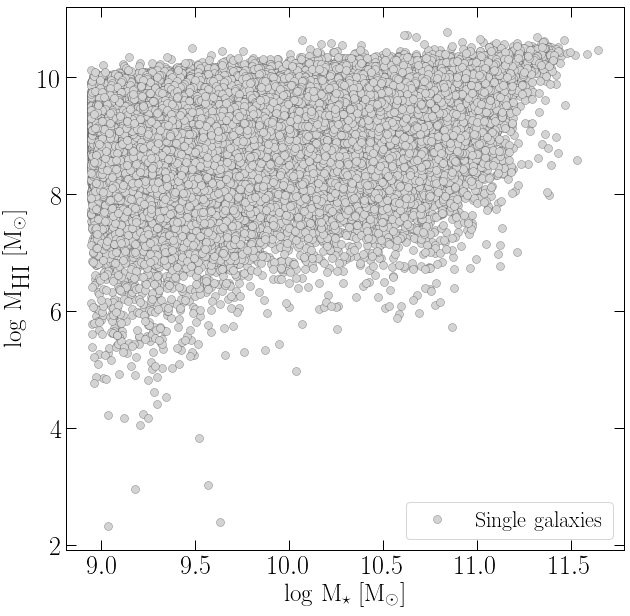

In [33]:

fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)


plt.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', 
         color='lightgrey', markeredgecolor='k', markersize=8, markeredgewidth=0.2, label='Single galaxies')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
plt.legend(loc=4)
plt.show()

# All galaxies in groups that are N=given N
#### if **any galaxy in the group** has Mass less than `Mass_cutoff`, we don't plot the entire group

In [34]:
Mass_cutoff = 0.06424

In [36]:
print(G["StellarMass"][groups[15][1]] > Mass_cutoff)
print(G["StellarMass"][groups[15][1]])

[ True  True  True  True  True  True  True False  True  True  True  True
  True  True  True]
[0.12422184 0.34353274 0.46784288 0.30324367 0.7547251  0.2736666
 2.04137    0.         2.890416   4.0116997  0.5423179  6.1805654
 5.8364344  1.6910073  0.86185014]


### Separated centrals and satellites

In [31]:
#print(G["StellarMass"][groups[4][0]] < Mass_cutoff)
#print(G["StellarMass"][groups[4][0]])

#Group_size = 7 # select number of galaxies per group
@jit()
def central_satellite_distribution_for_N_length_groups(Group_size):
    
    fig = plt.figure(figsize=(10,10))                                                               
    ax = fig.add_subplot(1,1,1)
    plt.plot( np.log10( (Mstellar_central_galaxies_cut*10**10)) ,np.log10( (Mcoldgas_central_galaxies_cut*10**10)), 'o', color='lightgrey', markersize=5, label=r'Central galaxies [cut]')
    
    #initiate condition for plot
    for group in groups[Group_size]:
        if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
            continue
                
            # Do plotting.
        #plot all galaxies here; for loops below plots satellite and centrals separatelly
        #plt.plot(np.log10(G['StellarMass'][group]*1e10/h), np.log10(G['ColdGas'][group]*1e10/h), 'o', color='blue', markersize=12)
        
        for i in group: #find central galaxies and plot them as red
            if i in store_cen_indices: 
                #print(i)
                plt.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                         'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2)
            else:
                if (G["StellarMass"][i] > Mass_cutoff).any(): # else find where galaxy is satellite; take into account mass cut
                    plt.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                             'o', color='#1f78b4', markersize=8)
            
    ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    plt.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
    plt.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
    
    plt.legend(loc=4)
    plt.show()

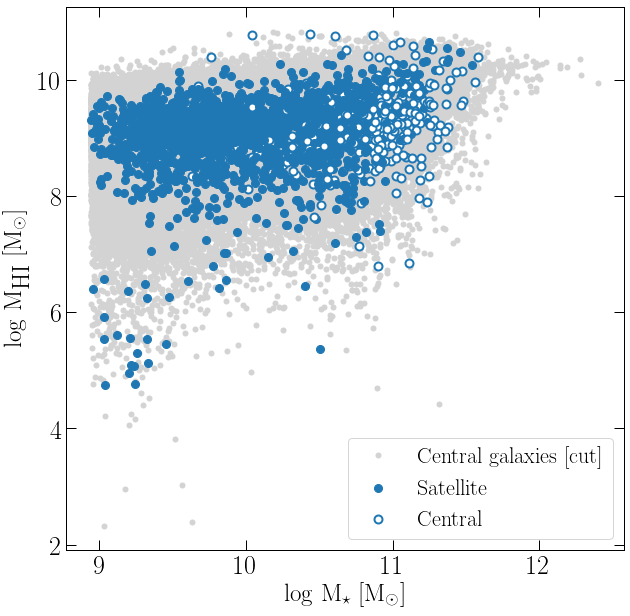

In [45]:
central_satellite_distribution_for_N_length_groups(7)

# All central and satellite galaxies in groups of length 2+ and single galaxies

  0%|          | 0/8 [00:00<?, ?it/s]

KeyboardInterrupt: 

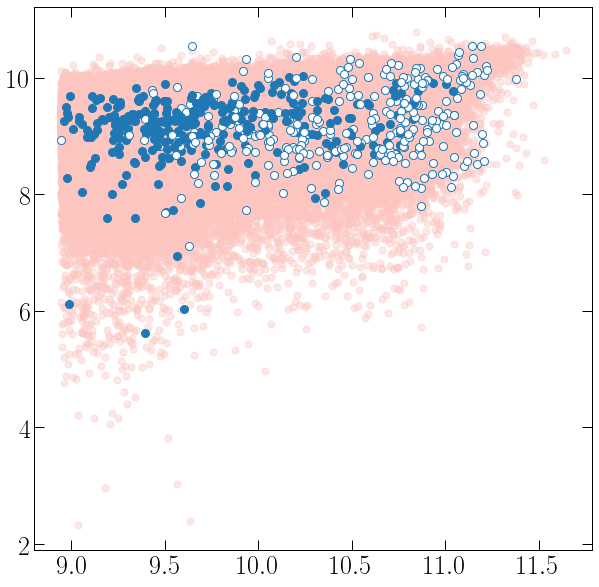

In [32]:
#initiate figure and how large it will be
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

ax.scatter(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), marker='o', s=50, color='#fcc5c0', zorder=-3, alpha=0.4)

#put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
row_count = 0
for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups

    Group_size = size+1 # select number of galaxies per group --- adding +1 because it is counting from 0.
    

    #plot centrals to be on each plot
  
        #initiate condition for plot
    for group in groups[Group_size]:
        if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
            continue
        
        for i in group: #find central galaxies and plot them as red
            if i in store_cen_indices:
            #print(i)
                ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                     'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=1)
            else:
                #if (G["StellarMass"][i] > Mass_cutoff).any(): # else find where galaxy is satellite; take into account mass cut
                ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                             'o', color='#1f78b4', markersize=8)

    #add label for each sub-plot to know the group size and what is central/satellite
ax.plot([], [], 'o', color='#fcc5c0', label='Single galaxies')
ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')


ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

leg = ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

#add x and y axis labels only on the plot edges since there will be no space between panels

#tight layout and remove spacing between subplots
plt.tight_layout()
#plt.legend(loc=4)
plt.savefig('MHI_vs_Mstar_Groups.png')
plt.show()

### Now mark central and satellites in the N times N plot
###### Takes 00:00:4 to run

100%|██████████| 8/8 [00:04<00:00,  1.69it/s]


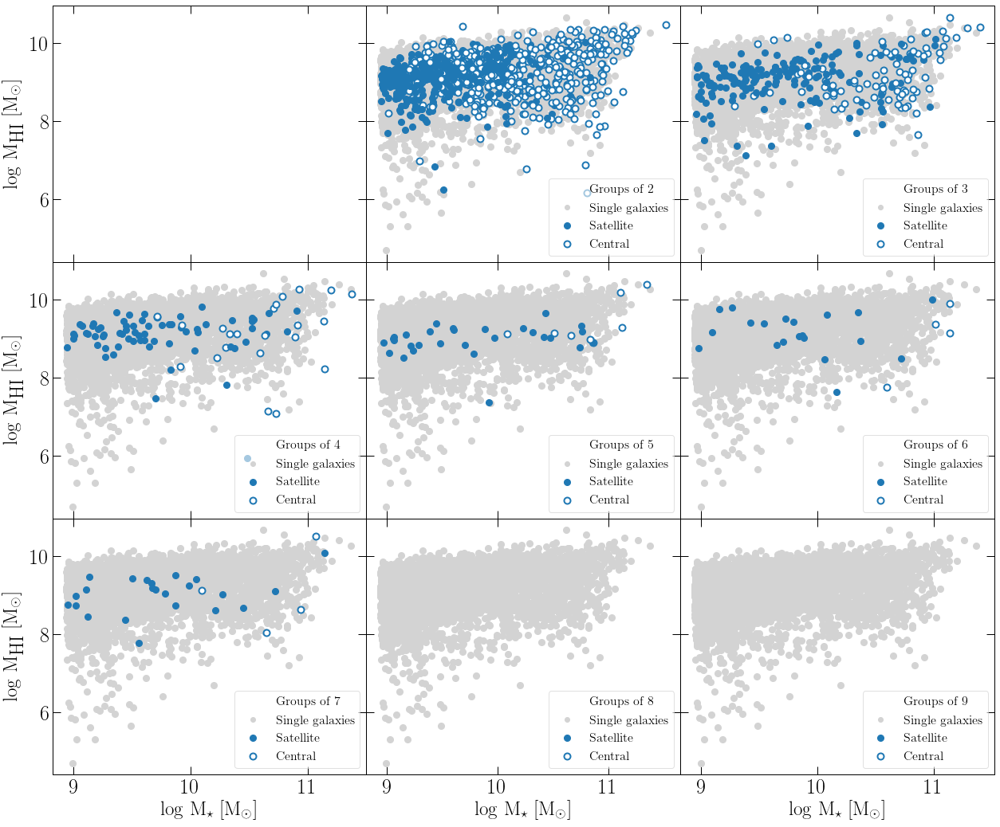

In [42]:
#initiate figure and how large it will be
fig, ax = plt.subplots(nrows=3, ncols=3, sharex='col', sharey='row', figsize=(18, 15))

#put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
row_count = 0
for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups
        
    if size % 3 == 0:
        row_count += 1
    this_ax = ax[row_count, size%3]
    
    Group_size = size+1 # select number of galaxies per group --- adding +1 because it is counting from 0.
    

    #plot centrals to be on each plot
    this_ax.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8)
  
        #initiate condition for plot
    for group in groups[Group_size]:
        if (G["StellarMass"][group] < Mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
            continue
        
        for i in group: #find central galaxies and plot them as red
            if i in store_cen_indices:
            #print(i)
                this_ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                     'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2)
            else:
                #if (G["StellarMass"][i] > Mass_cutoff).any(): # else find where galaxy is satellite; take into account mass cut
                this_ax.plot(np.log10(G['StellarMass'][i]*1e10/h), np.log10(np.sum(G['DiscHI'],axis=1)[i]*1e10/h), 
                             'o', color='#1f78b4', markersize=8)

    #add label for each sub-plot to know the group size and what is central/satellite
    this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %Group_size)
    this_ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
    this_ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
    this_ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')

    leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

#add x and y axis labels only on the plot edges since there will be no space between panels
for row in range(3):
    this_ax = ax[row,0]
    this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
for col in range(3):
    this_ax = ax[2,col]
    this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
#tight layout and remove spacing between subplots
plt.tight_layout()
#plt.legend(loc=4)
plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
plt.savefig('MHI_vs_Mstar_Groups.png')
plt.show()

## Make upper plot muchfaster

# Create cen & sat from groups dictionary

In [35]:
@jit
def create_cen_sat_from_groups_dict(groups, store_cen_indices, my_mass_cutoff=Mass_cutoff):
    """
    Created dictionary which is used to extract indices of central and satellite galaxies, taking into account
    the mass cutoff provided. Also creates "Groups" which store information on a group basis and their sat/cen galaxies.
    
    Parameters
    ==========
    
    groups: dictionary. Keyed by the size of the group, ``groups[group_size]``
            Contains list of arrays of a given group_size length. 
    
    Mass_cutoff: Constant.
                 Equal to 0.06424: defined as median stellar mass for halos composed of 100 particles.
    
    store_cen_indices: List of integers
                       Contains indices which correspond to central galaxies
        
    Returns
    =======
    new_groups_dict: Nested dictionary. Keyed by the `groups`.
                     Contains Centrals and Satellites which are in groups where galaxies are above the my_mass_cutoff
                     
    Usage
    =====
    #This is updated dictionary which one can parse to the plotting function:
    updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices) 
    
    ---------
    #Select groups of 3 and only central galaxies:
    central_inds = updated_dict[3]["Centrals"]
    G["StellarMass"][central_inds] #gives array of central galaxy stellar masses 
    
    """
    new_groups_dict = {}
    
    for group_size in groups.keys(): #go through the keys in groups dictionary
        central_gals = []
        sat_gals = []
        halo_gals = []
        halo_groups = []
        
        new_groups_dict[group_size] = {} #new dictionary based on group size
        new_groups_dict[group_size]["Groups"] = {} #new dictionary for storring whole groups
        counter = 0
        for group in groups[group_size]:
            
            central_gals_group = [] #store central in "Groups"
            sat_gals_group = [] #store satellites in "Groups"
            
            if (G["StellarMass"][group] < my_mass_cutoff).any(): #creates array of booleans; if theese are true hit continue
                continue
            
            halo_groups.append(group)
            
            # Use np.where to find indices of satellites and central galaxies
            for galaxy in group:
                halo_gals.append(galaxy) #add to halo_gals to know galaxies in the halo
                local_idx = np.where(galaxy == store_cen_indices)[0] # Check if the idx is in the store_cen_indices
                
                if len(local_idx) == 0: # If the idx is not present in store_cen_indisces then it is satellite
                    sat_gals.append(galaxy)
                    sat_gals_group.append(galaxy)
                elif len(local_idx) == 1: # If the idx is present then it is central galaxy
                    central_gals.append(galaxy)
                    central_gals_group.append(galaxy)
                else: # Check for funky stuff and raise an error
                    print("Somehow got a duplicate value in store_cen_indices.  Galaxy is {0}, group is {1} and local_idx value is {2}"
                          .format(galaxy, group, local_idx))
                    raise ValueError
            group_key = "Group_{0}".format(counter) #create group_key based on the groups
            new_groups_dict[group_size]["Groups"][group_key] = {} #new dictionary with all groups
            new_groups_dict[group_size]["Groups"][group_key]["Centrals"] = central_gals_group
            new_groups_dict[group_size]["Groups"][group_key]["Satellites"] = sat_gals_group
            counter += 1
            
                              
        # Append to dictionary found centrals and satellites
        new_groups_dict[group_size]["Centrals"] = central_gals
        new_groups_dict[group_size]["Satellites"] = sat_gals
        new_groups_dict[group_size]["All_galaxies"] = halo_gals
        new_groups_dict[group_size]['All_groups'] = halo_groups
        
        
    return new_groups_dict
                    

In [36]:
#This is updated dictionary which one can parse to the plotting function:
updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices) 

### Example of the usage of updated_dict -- taking "Groups"

In [29]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index
Grp_length = 69
for group_key in updated_dict[Grp_length]["Groups"].keys():
    central_idx = updated_dict[Grp_length]["Groups"][group_key]["Centrals"] #give indices
    central_mass = np.sum(G['DiscHI'],axis=1)[central_idx] #give masses of these galaxies
    
    satellite_inds = updated_dict[Grp_length]["Groups"][group_key]["Satellites"]
    sat_mass = np.sum(G['DiscHI'],axis=1)[satellite_inds]
    
    if (sat_mass > central_mass).any(): #check conditions
        print("Sat more massive than central")
    #print(sat_mass > central_mass)
    
    print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
    #print(updated_dict[3]["Groups"][group_key]["Centrals"])

    
updated_dict[3]["Groups"]["Group_10"] #shows indices for 10th Group in Groups of length 3

{'Centrals': [5977], 'Satellites': [5978, 5979]}

### Check group sizes

100%|██████████| 100/100 [00:00<00:00, 447153.94it/s]


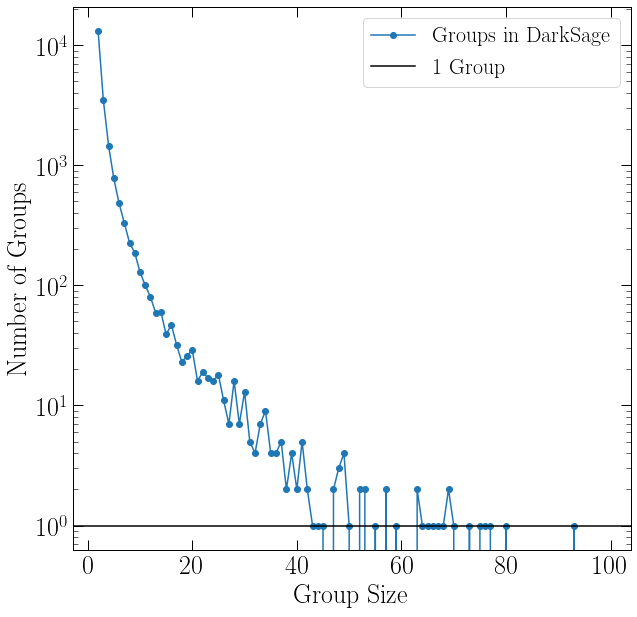

In [37]:
#How many groups are present and what is their length?
Group_statistics = []
Group_len = np.arange(100)
for i in trange(0,100):
    try:
        #print(i, len(updated_dict[i]["Groups"].keys()))
        Group_statistics.append(len(updated_dict[i]["Groups"].keys()))
    except KeyError:
        Group_statistics.append(0)
        continue
       #print(i, 'No such group length')

df_groups = pd.DataFrame({'GroupLength'            : Group_len,
                           'NumberNlengthGroups'    : Group_statistics })

#print(df_groups[1:])
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)
plt.plot(df_groups['GroupLength'][2:], df_groups['NumberNlengthGroups'][2:], marker='o', label='Groups in DarkSage');
ax.set_yscale('log')
plt.axhline(1, 0, label='1 Group', color='k')
plt.xlabel('Group Size')
plt.ylabel('Number of Groups')
plt.legend(loc=1)
plt.show();

In [38]:
# Initiate figure and how large it will be
@jit(cache=True)
def mhi_vs_ms_3x3(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(nrows=4, ncols=5, sharex='col', sharey='row', figsize=(18, 15))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    row_count = 0
    for size in trange(1, 20, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
            
        if size % 5 == 0:
            row_count += 1
        this_ax = ax[row_count, size%5] #Axis. Created for plotting 3x3 plots
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
    
        # Plot single galaxies           
        #this_ax.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8)
        
            
        # Do plotting of groups of N-length; it will be placed on each subplot + +.
        # Centrals
        this_ax.plot(np.log10(G['StellarMass'][central_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h), 
                         'o', color='white', markeredgecolor='#1f78b4', markersize=6, markeredgewidth=2)
        # Satellites
        this_ax.plot(np.log10(G['StellarMass'][sat_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h), 
                         'o', color='#1f78b4', markersize=6)
    
        # Add label for each sub-plot to know the group size and what is central/satellite
        this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %group_size)
        this_ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
        this_ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
        this_ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
        #Add legend    
        leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
        
    # Add x and y axis labels only on the plot edges since there will be no space between panels
    for row in range(4):
        this_ax = ax[row,0]
        this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    for col in range(5):
        this_ax = ax[3,col]
        this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
        this_ax.xaxis.set_ticks(np.arange(9,11.9, 1))
    # Tight layout and remove spacing between subplots
    plt.tight_layout()
    # My first plot is only single galaxies so I add legend separately
    ax[0][0].legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    plt.show()
    #return fig


100%|██████████| 19/19 [00:01<00:00, 17.85it/s]
No handles with labels found to put in legend.


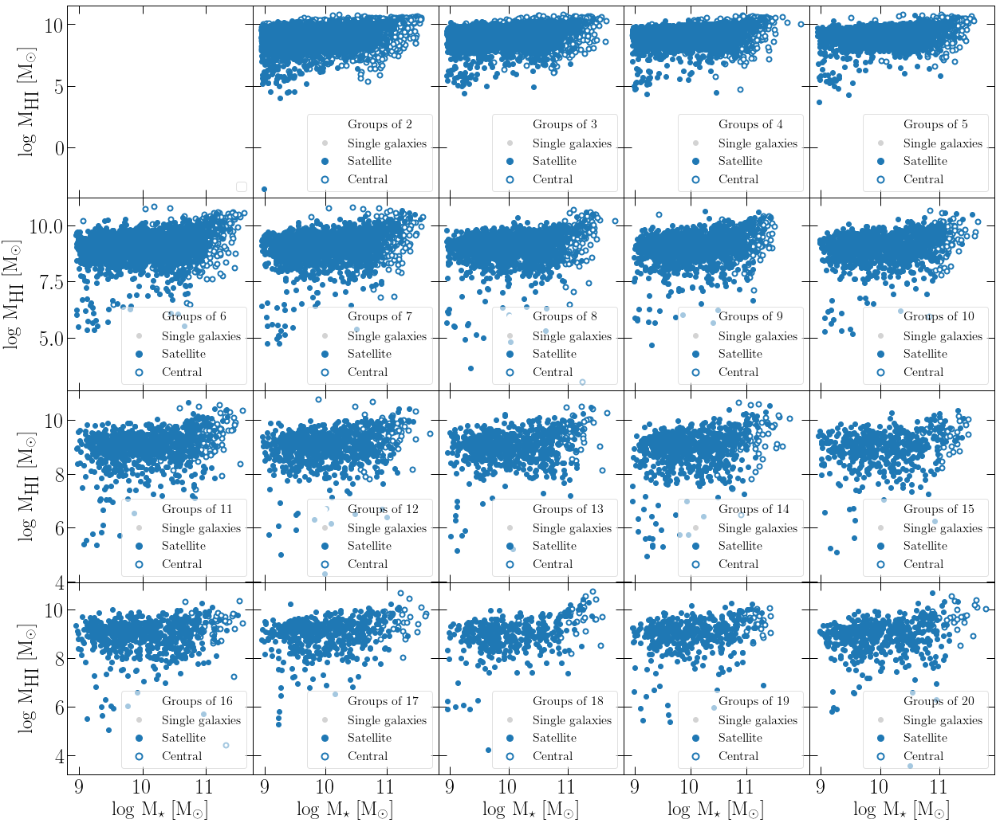

In [39]:
#Use line_profiler to test how fast is each line of the code

#put this line in front of funtion which you are calling:
#%lprun -f mhi_vs_ms_3x3 

mhi_vs_ms_3x3(updated_dict)

# Make a two sided histogram

In [40]:
@jit
def two_sided_histogram_group_and_single(x_cen, y_cen, x_sat, y_sat, x_single, y_single):
    """
    Make a scatter plot with 3 datasets and then place histogram on both x and y axis for them. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen, y_cen: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of central galaxies.
    
    x_sat, y_sat: x and y values of the second dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of satellite galaxies.
                  
    x_single, y_single: x and y values of the third dataset. Floats. Can be list/array. 
                        In this case, I am using logMHI and logMstar of single (central) galaxies.
                        
        
    Returns
    =======
    A scatter plot with histogram on x and y axis. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_group_and_single(x_cen, y_cen, x_sat, y_sat, x_single, y_single)``
               I extracted single, satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=1 for single galaxies; group_size=2 for pairs -- can be any group_size number
               
                single = updated_dict[1]['Centrals']
                central_2 = updated_dict[2]["Centrals"]
                satellite_2 = updated_dict[2]["Satellites"]
                
                x_cen = np.log10(G["StellarMass"][central_2]*1e10/h ) #gives array of central galaxy stellar masses 
                y_cen = np.log10(G["ColdGas"][central_2]*1e10/h+1) 
                
                etc. just update central_2 with other keys to specific indices.
                
    """

    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure( figsize=(8, 8))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_single, y_single, color='#fcc5c0', label='Single galaxies', alpha=0.2)
    axScatter.scatter(x_cen, y_cen, color='white', edgecolor='#1f78b4', linewidth=1, label='Centrals')
    axScatter.scatter(x_sat, y_sat, color='#1f78b4', label='Satellites', alpha=0.8)
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((0, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    #density=True -- the result is the value of the probability density function at the bin,
    #                normalized such that the integral over the range is 1 (buggy with uneqyal bin widths)
    axHistx.hist(x_sat, bins=bins, density=True, color='#1f78b4', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_sat, bins=bins, density=True, orientation='horizontal', alpha=0.6, color='#1f78b4', edgecolor='k', linewidth=1.2)
    
    axHistx.hist(x_cen, bins=bins, density=True, color='white',alpha=0.4, edgecolor='#1f78b4', linewidth=1)
    axHisty.hist(y_cen, bins=bins, density=True, orientation='horizontal', color='white', alpha=0.4, edgecolor='#1f78b4', linewidth=2)
    
    axHistx.hist(x_single, bins=bins, density=True, color='#fcc5c0',alpha=0.4, edgecolor='black', linewidth=1)
    axHisty.hist(y_single, bins=bins, density=True, orientation='horizontal', color='#fcc5c0', alpha=0.4, edgecolor='black', linewidth=1)
 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3)


    return plt.show()
    

In [41]:
@jit
def two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat, color='#1f78b4'):
    """

    Make a scatter plot with 2 datasets and then place histogram on both x and y axis for them. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen, y_cen: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of central galaxies.
    
    x_sat, y_sat: x and y values of the second dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    color : Boolean. Chose color in case you want differen one. If not specified, will be the default one for satellites.
            Use different color in case there is only one dataset, for exaple:
            two_sided_histogram_groups(x, y, [], [], 'grey')
    
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat)``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
               
                central_2 = updated_dict[2]["Centrals"]
                satellite_2 = updated_dict[2]["Satellites"]
                
                x_cen = np.log10(G["StellarMass"][central_2]*1e10/h ) #gives array of central galaxy stellar masses 
                y_cen = np.log10(G["ColdGas"][central_2]*1e10/h+1) 
                
                etc. just update central_2 with other keys to specific indices.
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(8, 8))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_cen, y_cen, color='white', edgecolor='#1f78b4', linewidth=1, label='Centrals')
    axScatter.scatter(x_sat, y_sat, color=color, label='Satellites', alpha=0.8)
    
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((0, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    axHistx.hist(x_sat, bins=bins, color=color, alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_sat, bins=bins, orientation='horizontal', alpha=0.6, color=color, edgecolor='k', linewidth=1.2)
    
    axHistx.hist(x_cen, bins=bins, color='white',alpha=0.4, edgecolor='#1f78b4', linewidth=1)
    axHisty.hist(y_cen, bins=bins, orientation='horizontal', color='white', alpha=0.4, edgecolor='#1f78b4', linewidth=2) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3)


    return plt.show()



In [42]:
single = updated_dict[1]['Centrals']
central_2 = updated_dict[2]["Centrals"]
satellite_2 = updated_dict[2]["Satellites"]

x_cen = np.log10(G["StellarMass"][central_2]*1e10/h ) #gives array of central galaxy stellar masses 
y_cen = np.log10(np.sum(G['DiscHI'],axis=1)[central_2]*1e10/h+1) #BECAUSE log0 goes to -inf so I add 1! has to be checked/removed!
x_sat = np.log10(G["StellarMass"][satellite_2]*1e10/h) #gives array of satellite galaxy stellar masses 
y_sat = np.log10(np.sum(G['DiscHI'],axis=1)[satellite_2]*1e10/h+1)

x_single = np.log10(G["StellarMass"][single]*1e10/h) #gives array of satellite galaxy stellar masses 
y_single = np.log10(np.sum(G['DiscHI'],axis=1)[single]*1e10/h+1)


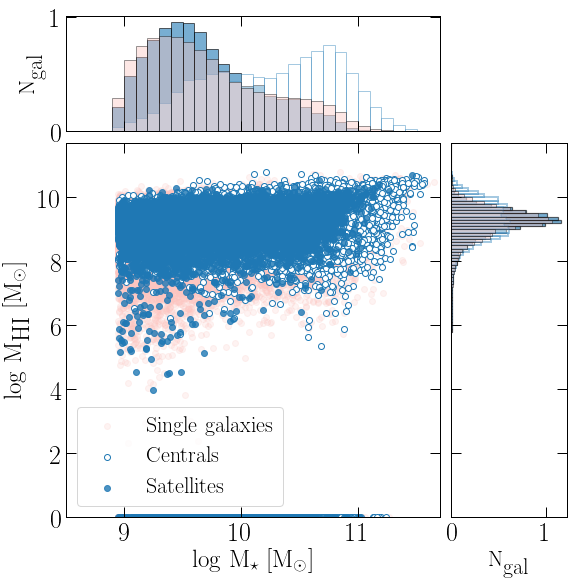

In [65]:
two_sided_histogram_group_and_single(x_cen, y_cen, x_sat, y_sat, x_single, y_single)

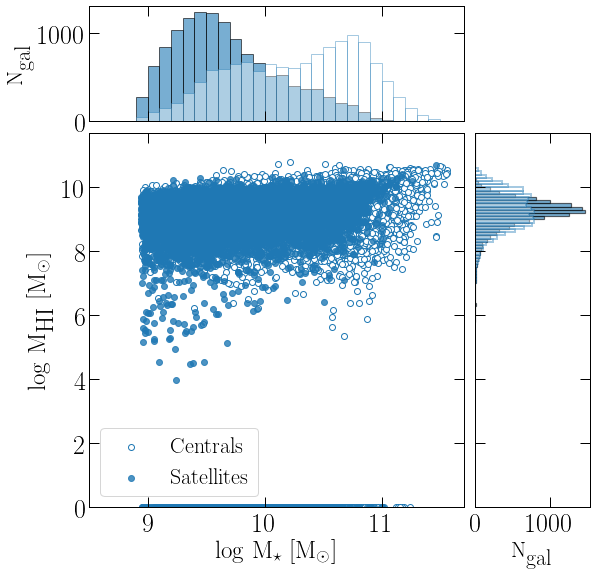

In [60]:
two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat)

In [43]:
@jit
def hist_Mhi_vs_Mstar_with_singles(groups_dict):
    
    """
    N times the scatter plot with thee datasets and their histograms on x and y axis. One dataset is always single galaxies
    the other two datasets are groups of lenght N++
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    N times the scatter plot with two datasets and their histograms on x and y axis.
    
    
    Usage
    =====
    To use type: ``hist_Mhi_vs_Mstar_with_singles(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
        
    row_count = 0
    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups
            
        #if size % 3 == 0:
        #    row_count += 1
        #this_ax = ax[row_count, size%3]
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]
        sat_gals = groups_dict[group_size]["Satellites"]
        single_gals = groups_dict[1]['Centrals']
     
        # Do plotting of groups of N-length; it will be placed on each figure
        # Centrals and Satellites; x & y axis histogram
        # Using function two_sided_histogram to plot the histogram output so here I call the function and give (x, y), (x, y)
        two_sided_histogram_group_and_single(np.log10(G['StellarMass'][central_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h+1), 
                            np.log10(G['StellarMass'][sat_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h+1),
                            np.log10(G['StellarMass'][single_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[single_gals]*1e10/h+1) ) 


  0%|          | 0/8 [00:00<?, ?it/s]

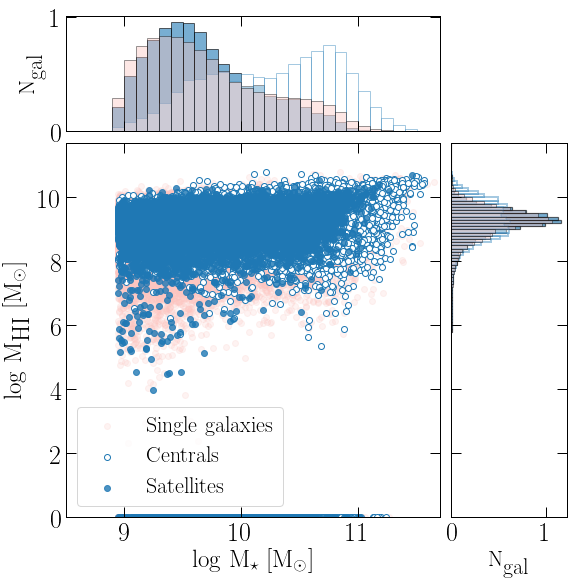

 12%|█▎        | 1/8 [00:03<00:22,  3.20s/it]

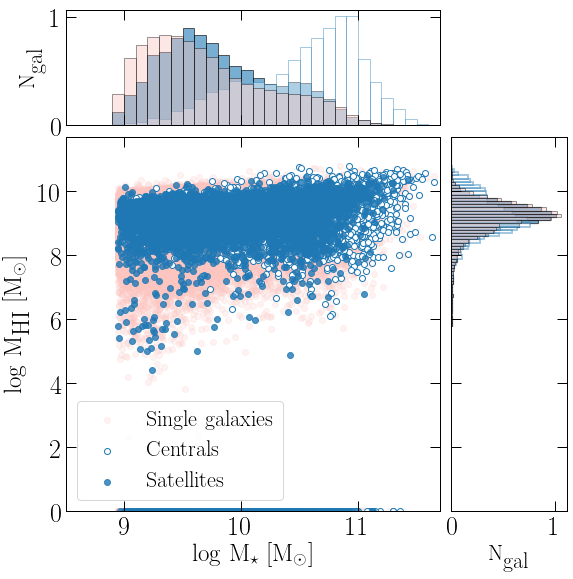

 25%|██▌       | 2/8 [00:06<00:18,  3.11s/it]

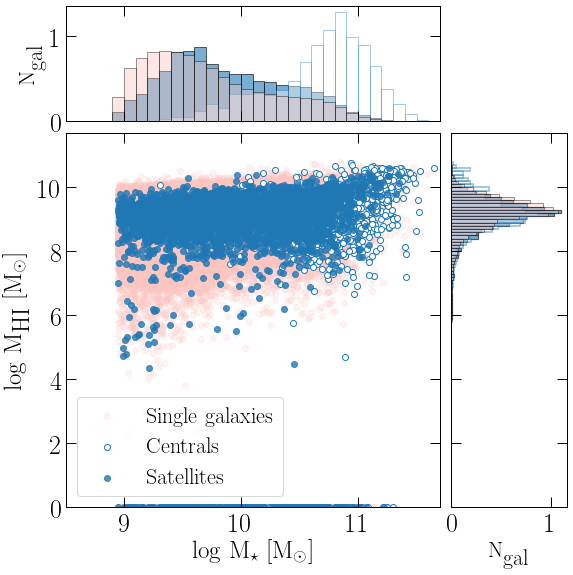

 38%|███▊      | 3/8 [00:09<00:15,  3.06s/it]

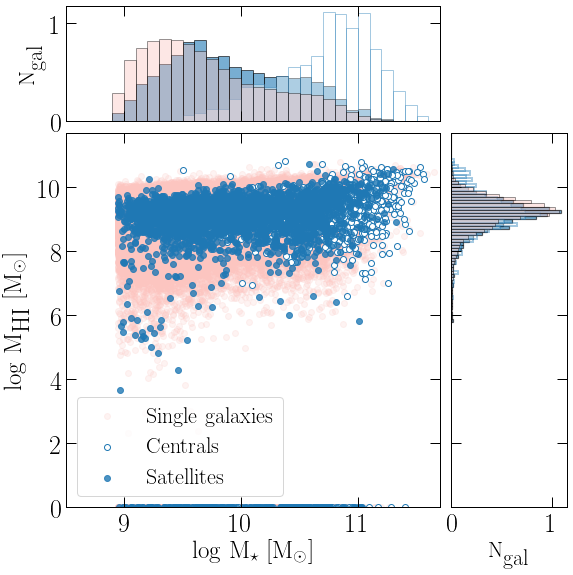

 50%|█████     | 4/8 [00:12<00:12,  3.10s/it]

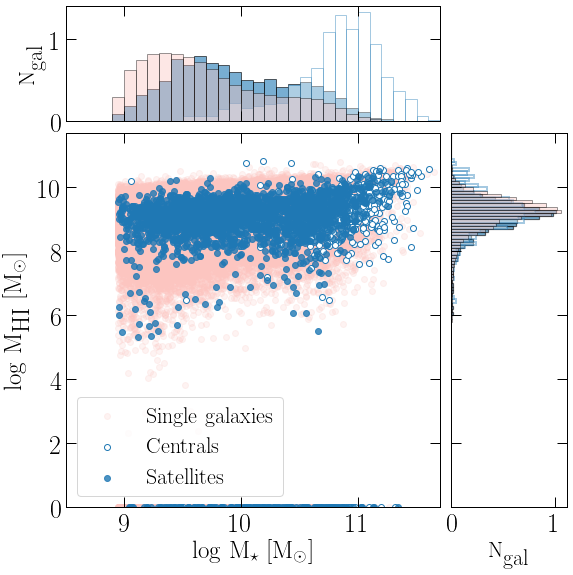

 62%|██████▎   | 5/8 [00:15<00:09,  3.07s/it]

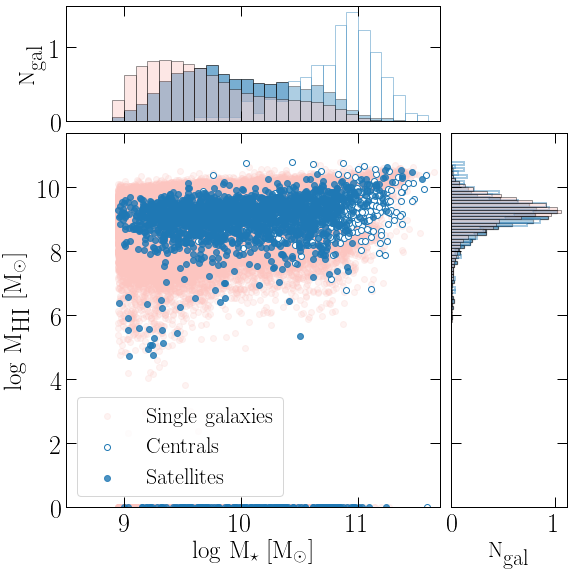

 75%|███████▌  | 6/8 [00:18<00:06,  3.04s/it]

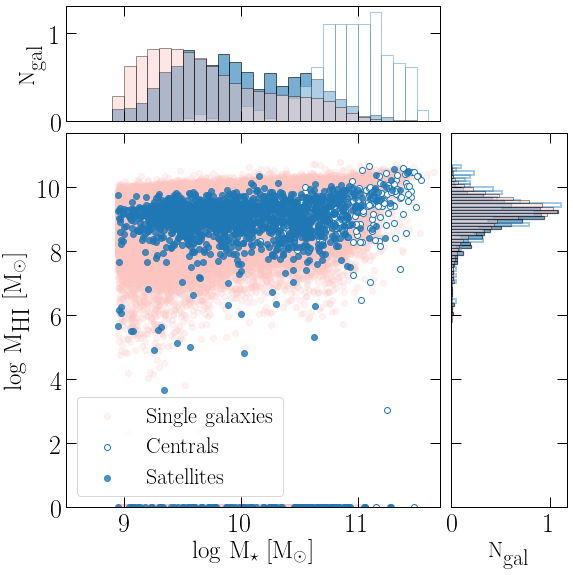

 88%|████████▊ | 7/8 [00:21<00:03,  3.02s/it]

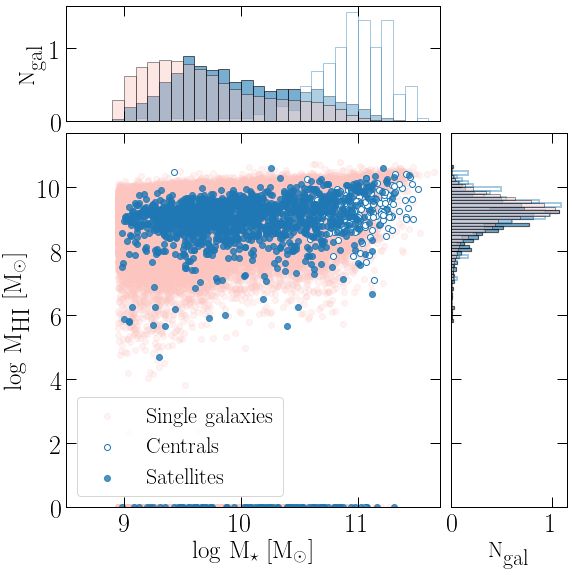

100%|██████████| 8/8 [00:24<00:00,  3.01s/it]


In [69]:
hist_Mhi_vs_Mstar_with_singles(updated_dict)

In [44]:
@jit
def hist_Mhi_vs_Mstar(groups_dict):
    
    """
    N times the scatter plot with two datasets and their histograms on x and y axis.
    Two datasets are groups of lenght N++
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    N times the scatter plot with two datasets and their histograms on x and y axis.
    
    
    Usage
    =====
    To use type: ``hist_Mhi_vs_Mstar(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
       

                
                
    row_count = 0
    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups
            
        #if size % 3 == 0:
        #    row_count += 1
        #this_ax = ax[row_count, size%3]
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]
        sat_gals = groups_dict[group_size]["Satellites"]
        single_gals = groups_dict[1]['Centrals']
     
        # Do plotting of groups of N-length; it will be placed on each figure
        # Centrals and Satellites; x & y axis histogram
        # Using function two_sided_histogram to plot the histogram output so here I call the function and give (x, y), (x, y)
        two_sided_histogram_groups(np.log10(G['StellarMass'][central_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h+1), 
                            np.log10(G['StellarMass'][sat_gals]*1e10/h),
                            np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h+1)) 
        

  0%|          | 0/8 [00:00<?, ?it/s]

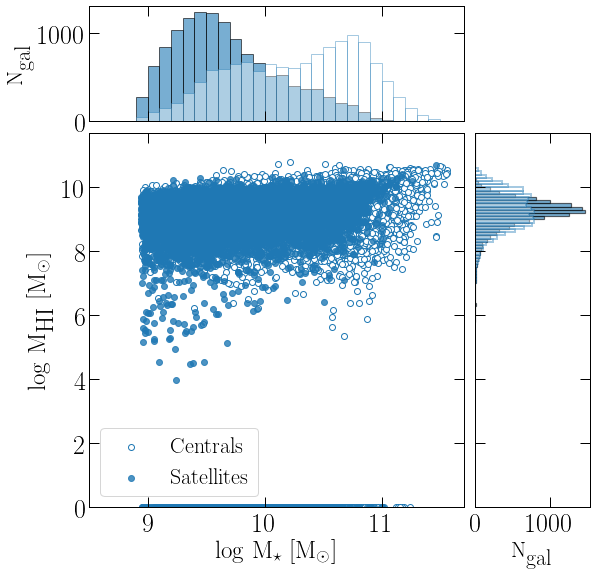

 12%|█▎        | 1/8 [00:02<00:15,  2.26s/it]

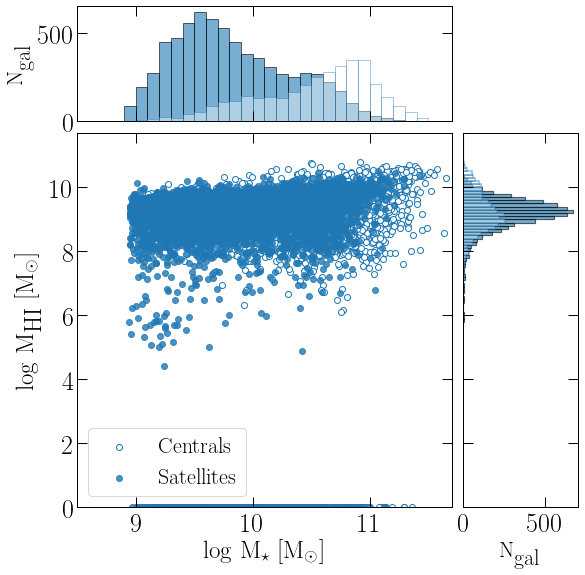

 25%|██▌       | 2/8 [00:03<00:10,  1.77s/it]

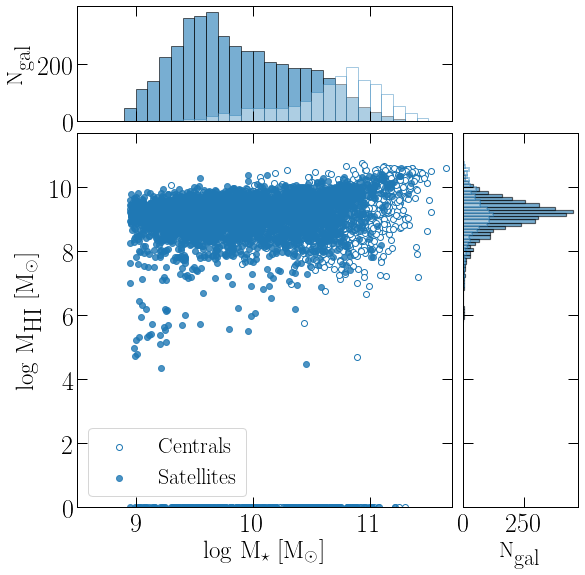

 38%|███▊      | 3/8 [00:04<00:07,  1.59s/it]

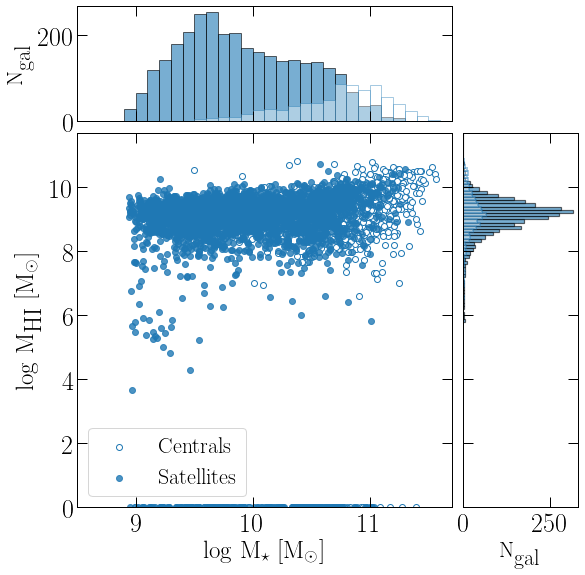

 50%|█████     | 4/8 [00:06<00:06,  1.57s/it]

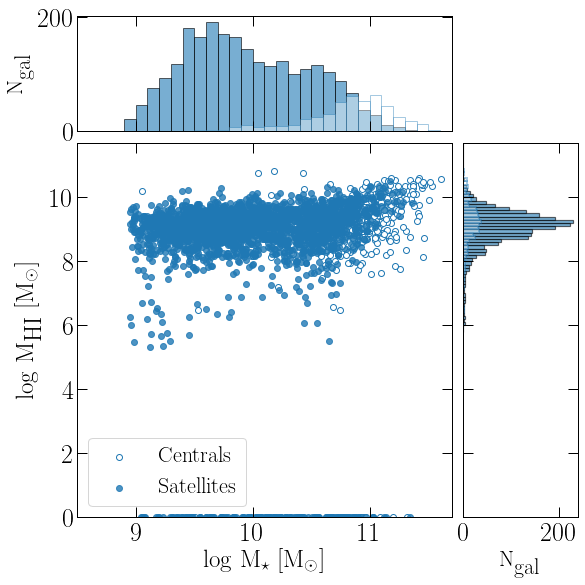

 62%|██████▎   | 5/8 [00:07<00:04,  1.50s/it]

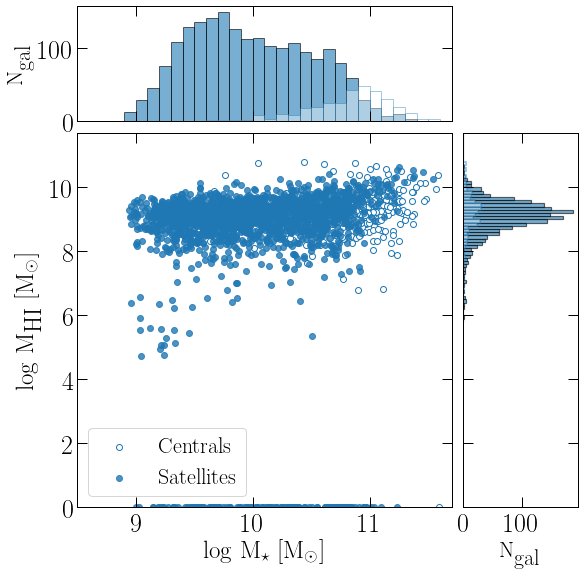

 75%|███████▌  | 6/8 [00:08<00:02,  1.45s/it]

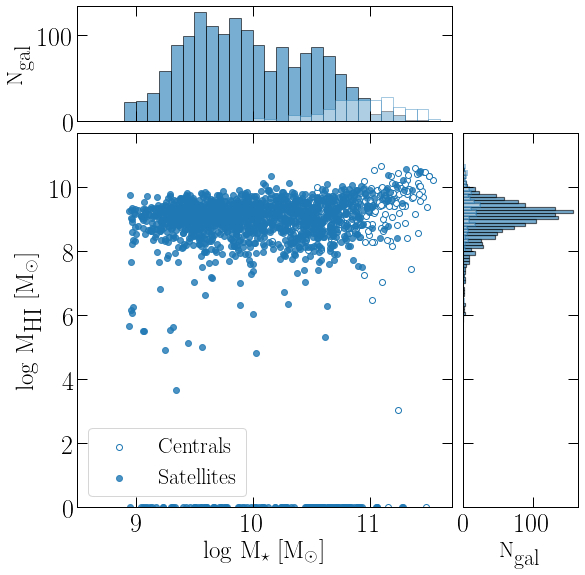

 88%|████████▊ | 7/8 [00:09<00:01,  1.42s/it]

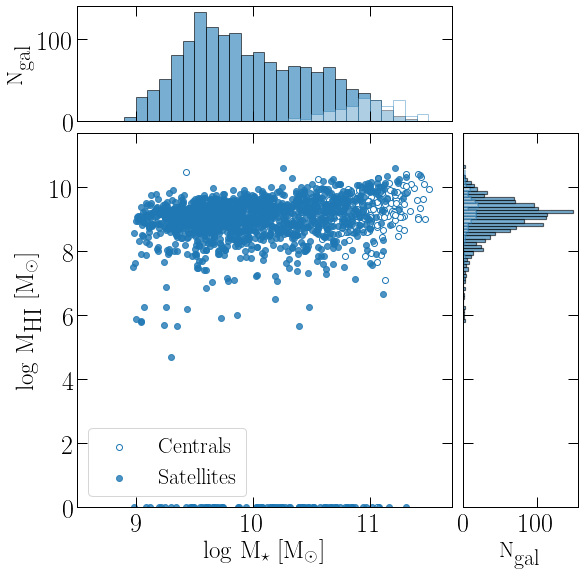

100%|██████████| 8/8 [00:11<00:00,  1.39s/it]


In [80]:
hist_Mhi_vs_Mstar(updated_dict)

# Properties of the group as the whole entity

In [45]:
def two_sided_histogram(x_data, y_data, color='lightgrey', legend=legend, s=90):
    """
    Make a scatter plot with 1 dataset and then place histogram on both x and y axis for them. .
    Here I use logMhi vesus logMstar as the sum values for groups of N length.
    
    Parameters
    ==========
    x_data, y_data: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of the sum a group.
    
    color='lightgrey': Default color.
                      This will change when I call a function that has defined its own colors.
    
    legend=legend: Default legend.
                   This will change when I call a function that has defined its own legends.
    
    s=90: Markersize. Default 90.
                This will change when I call a function with its defined markersizes.
   
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram(x_data, y_data)``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
               
                central_2 = updated_dict[2]["Centrals"]
                satellite_2 = updated_dict[2]["Satellites"]
                
                and then sum the x and y properties:
                
                x_sum = np.log10(G["StellarMass"][central_2]*1e10/h +(G["StellarMass"][satellite_2]*1e10/h) ) #gives array of the sum of the stellar masses 
                y_sum = np.log10(G["ColdGas"][central_2]*1e10/h + (G["ColdGas"][satellite_2]*1e10/h+1)) #gives array of the sum of the gas masses
    
                etc. just update central_2 with other keys to specific indices.
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    markersizes=90
    axScatter.scatter(x_data, y_data, color=color, edgecolor='k', s=s, linewidth=0.4, label=legend)
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((9, 11.8))
    axScatter.set_ylim((7.5, 11.5))
    
    bins = np.arange(7.5, lim + binwidth, binwidth)
    
    axHistx.hist(x_data, bins=bins, color=color,alpha=0.8, edgecolor='k', linewidth=1)
    axHisty.hist(y_data, bins=bins, orientation='horizontal', color=color, alpha=0.8, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{groups}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{groups}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())
    
    
    legend = axScatter.legend(loc=3, fontsize=18)


    return #plt.show()


### All groups separatelly based on the length
#### Group mass represented as sum of the galaxies which are in the group
#### Takes long on big box

In [38]:
#group_size = 2
#halo_2 = updated_dict[group_size]["All_groups"]
#
#x_values = []
#y_values = []
#
#for each_group in halo_2:
#   #print(each_group)
#    x_sum = np.log10( np.sum((G["StellarMass"][each_group]*1e10/h)) ) #gives array of the sum of the stellar masses 
#    y_sum = np.log10( np.sum((np.sum(G['DiscHI'],axis=1)[each_group]*1e10/h+1)) ) #gives array of the sum of the gas masses
#    x_values.append(x_sum)
#    y_values.append(y_sum)
#    
#    
#two_sided_histogram(x_values, y_values, legend='Group of %.f'%group_size)

    

### All groups together

In [46]:
@jit
def hist_group_sum_Mhi_vs_Mstar(groups_dict, colors=['lightgrey','#feebe2','#fcc5c0','#fa9fb5','#f768a1','#dd3497','#ae017e','#7a0177'],
                               legends=['2', '3', '4', '5', '6', '7', '8', '9'], markersizes=[90,150,210,270,330,400,470,540,610]):
    
    """
    N times the scatter plot with dataset and their histograms on x and y axis.
    Datasets are groups of lenght N++
    Here I use logMhi vesus logMstar -- the sum values for the entire group
    
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    colors=['r', 'b' ... ]: List of colors. To be replaced with default ones in two_sided_histogram.
                Here is used list of lenght 8 because I'm plotting N sized groups where N 2-9
    
    legends=['2', '3', '4', '5', '6', '7', '8', '9']: List of legends. To be places as a length of each group.
            Here is used list of lenght 8 because I'm plotting N sized groups where N 2-9
    
    markersizes=[90,150,210,270,330,400,470,540,610]: Array of integers. 
                Replaces the markersize for each iteration.
    
    Returns
    =======
    N times the scatter plot with dataset as a sum of the masses and their histograms on x and y axis.
    
    
    Usage
    =====
    To use type: ``hist_group_sum_Mhi_vs_Mstar(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
       

    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups

        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.

        halo_groups = updated_dict[group_size]["All_groups"]
        
        x_values = []
        y_values = []

        for each_group in halo_groups:
        #print(each_group)
            x_sum = np.log10( np.sum((G["StellarMass"][each_group]*1e10/h)) ) #gives array of the sum of the stellar masses 
            y_sum = np.log10( np.sum((np.sum(G['DiscHI'],axis=1)[each_group]*1e10/h+1)) ) #gives array of the sum of the gas masses
            x_values.append(x_sum)
            y_values.append(y_sum)
        
        # Do plotting of groups of N-length; it will be placed on each figure
        # Centrals and Satellites; x & y axis histogram
        # Using function two_sided_histogram to plot the histogram output so here I call the function and give (x, y), (x, y)
        two_sided_histogram(x_values, y_values, colors[size-1], legends[size-1], markersizes[size-1]) # Call the function with specified colors to have different colors for each group.
                            
         


In [42]:
hist_group_sum_Mhi_vs_Mstar(updated_dict)

  0%|          | 0/8 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [61]:
def histogram_wrapper(dataset_length):
    """
    """
    
    if dataset_length == 1:
        hist_group_sum_Mhi_vs_Mstar(updated_dict)
    elif dataset_length ==2:
        hist_Mhi_vs_Mstar(updated_dict)
    elif dataset_length == 3:
        hist_Mhi_vs_Mstar_with_singles(updated_dict)
    else:# Check for funky stuff and raise an error
        print("Wrong dataset length. Dataset length should be: 1, 2 or 3.")
        raise ValueError

# Use dictionary based on "Groups" which also has info abour cen/sat
## Find where central galaxy is the most gas rich galaxy in each group

In [43]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

richer_central_ind = []
poorer_central_ind = []

richer_sat_ind = []
poorer_sat_ind = []

#Grp_length = 5
@jit
def find_richer_central_for_Nsized_group(Grp_length):
    for group_key in tqdm(updated_dict[Grp_length]["Groups"].keys()):
        central_idx = updated_dict[Grp_length]["Groups"][group_key]["Centrals"] #give indices
        central_mass = np.sum(G['DiscHI'],axis=1)[central_idx] #give masses of these galaxies
        
        satellite_inds = updated_dict[Grp_length]["Groups"][group_key]["Satellites"]
        sat_mass = np.sum(G['DiscHI'],axis=1)[satellite_inds]
        
        if (central_mass > sat_mass).all(): #check conditions
            print("Central is the most HI massive")
            richer_central_ind.append(central_idx)
            richer_sat_ind.append(satellite_inds)
        else:
            print("Satellite is more HI massive thatn central")
            poorer_central_ind.append(central_idx)
            poorer_sat_ind.append(satellite_inds)
        #print(sat_mass > central_mass)
        
        print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
        print("")


In [44]:
find_richer_central_for_Nsized_group(5)


  0%|          | 3/775 [00:00<00:36, 21.07it/s]

Central is the most HI massive
Central mass is [0.32896107] and sat masses are [0.12642805 0.09018268 0.1814766  0.10640752]

Central is the most HI massive
Central mass is [0.4232793] and sat masses are [0.0642252  0.00942204 0.0745151  0.08077417]

Central is the most HI massive
Central mass is [0.9758971] and sat masses are [0.04120554 0.0115722  0.02861216 0.29585874]

Satellite is more HI massive thatn central
Central mass is [0.13971741] and sat masses are [0.02244538 0.21678269 0.16774972 0.05072546]

Central is the most HI massive
Central mass is [0.5031393] and sat masses are [0.18034874 0.02934442 0.29210377 0.13873102]




  1%|          | 9/775 [00:00<00:36, 20.81it/s]

Satellite is more HI massive thatn central
Central mass is [0.09124918] and sat masses are [0.02541408 0.29393253 0.09599532 0.2232638 ]

Satellite is more HI massive thatn central
Central mass is [0.10168962] and sat masses are [0.19224685 0.04992679 0.06333332 0.11691017]

Satellite is more HI massive thatn central
Central mass is [0.10796103] and sat masses are [0.18662016 0.         0.00924181 0.17059073]

Satellite is more HI massive thatn central
Central mass is [0.1327845] and sat masses are [0.08523795 0.03391906 0.21144298 0.18078533]

Satellite is more HI massive thatn central
Central mass is [0.14126016] and sat masses are [0.09628567 0.00143633 0.33673677 0.        ]




  2%|▏         | 14/775 [00:00<00:36, 20.66it/s]

Satellite is more HI massive thatn central
Central mass is [0.06550318] and sat masses are [0.22981018 0.33484802 0.13093914 0.03348964]

Satellite is more HI massive thatn central
Central mass is [0.2582669] and sat masses are [0.48549363 0.06170307 0.0984537  0.08137859]

Satellite is more HI massive thatn central
Central mass is [0.0756925] and sat masses are [0.7300875  0.09997299 0.26575416 0.03013501]

Central is the most HI massive
Central mass is [0.32607532] and sat masses are [0.0779217  0.06392832 0.05783296 0.09758414]

Satellite is more HI massive thatn central
Central mass is [0.00646144] and sat masses are [0.38793558 0.1771013  0.02116448 0.11956192]




  3%|▎         | 20/775 [00:00<00:36, 20.65it/s]

Satellite is more HI massive thatn central
Central mass is [0.00153426] and sat masses are [0.06797817 0.14983569 0.         0.05577808]

Central is the most HI massive
Central mass is [3.2724125] and sat masses are [0.03529083 0.02381146 0.86845493 0.06928834]

Central is the most HI massive
Central mass is [0.51044905] and sat masses are [0.1292148  0.00757957 0.1688578  0.0079509 ]

Satellite is more HI massive thatn central
Central mass is [0.02525776] and sat masses are [0.03341049 0.16653726 0.17878714 0.10838641]

Satellite is more HI massive thatn central
Central mass is [0.17736764] and sat masses are [0.11054043 0.25278145 0.09650965 0.50195754]




  3%|▎         | 25/775 [00:01<00:36, 20.58it/s]

Satellite is more HI massive thatn central
Central mass is [0.122779] and sat masses are [0.11356504 0.15640144 0.02522032 0.15242434]

Satellite is more HI massive thatn central
Central mass is [0.03052512] and sat masses are [0.19291507 0.08915862 0.09674514 0.04083839]

Central is the most HI massive
Central mass is [0.20595618] and sat masses are [0.01098219 0.13738225 0.11824495 0.20244303]

Central is the most HI massive
Central mass is [0.46820515] and sat masses are [0.20144048 0.26858863 0.02386803 0.07116514]

Satellite is more HI massive thatn central
Central mass is [0.2207556] and sat masses are [0.07724977 0.0886017  0.20535788 0.3048568 ]




  4%|▎         | 28/775 [00:01<00:36, 20.60it/s]

Satellite is more HI massive thatn central
Central mass is [0.09009381] and sat masses are [0.08833817 0.14157051 0.02869059 0.35536572]

Satellite is more HI massive thatn central
Central mass is [0.08793345] and sat masses are [0.10799298 0.09421099 0.2673813  0.3031833 ]

Satellite is more HI massive thatn central
Central mass is [0.09075641] and sat masses are [0.06950945 0.12172422 0.16383392 0.1253173 ]

Satellite is more HI massive thatn central
Central mass is [0.09393644] and sat masses are [1.3806580e-01 0.0000000e+00 5.8774593e-05 8.1291631e-02]

Satellite is more HI massive thatn central
Central mass is [0.06967121] and sat masses are [0.         0.30865377 0.09829376 0.08883527]




  4%|▍         | 34/775 [00:01<00:35, 20.62it/s]

Satellite is more HI massive thatn central
Central mass is [0.10447558] and sat masses are [0.10578112 0.09808733 0.2617439  0.09028433]

Satellite is more HI massive thatn central
Central mass is [0.00077251] and sat masses are [0.48102918 0.         0.18024984 0.09332772]

Satellite is more HI massive thatn central
Central mass is [0.05457867] and sat masses are [0.00617263 0.13179173 0.02395521 0.13787876]

Satellite is more HI massive thatn central
Central mass is [0.05015337] and sat masses are [0.1732566  0.09558348 0.10893384 0.313795  ]

Satellite is more HI massive thatn central
Central mass is [0.01119066] and sat masses are [0.35052657 0.14797154 0.04749051 0.0108093 ]




  5%|▌         | 40/775 [00:01<00:35, 20.61it/s]

Satellite is more HI massive thatn central
Central mass is [0.08903285] and sat masses are [0.03325594 0.16421112 0.13108133 0.13751616]

Central is the most HI massive
Central mass is [0.43076962] and sat masses are [0.15426159 0.2062662  0.41130212 0.06780797]

Satellite is more HI massive thatn central
Central mass is [0.00477687] and sat masses are [0.35950622 0.1888274  0.29518926 0.27930883]

Satellite is more HI massive thatn central
Central mass is [0.22089067] and sat masses are [0.19724864 0.13423851 0.09381649 0.22420886]

Satellite is more HI massive thatn central
Central mass is [0.07252686] and sat masses are [0.11155279 0.02681517 0.06281331 0.10191825]




  6%|▌         | 43/775 [00:02<00:35, 20.61it/s]

Satellite is more HI massive thatn central
Central mass is [0.02792175] and sat masses are [0.0495873  0.15372859 0.12077709 0.10260858]

Satellite is more HI massive thatn central
Central mass is [0.08263776] and sat masses are [0.25765854 0.06201192 0.03910343 0.15847848]

Satellite is more HI massive thatn central
Central mass is [0.11264803] and sat masses are [0.03877947 0.         0.16891481 0.01698559]

Central is the most HI massive
Central mass is [2.006952] and sat masses are [0.02259701 0.6785307  0.14336227 0.20057103]

Central is the most HI massive
Central mass is [0.25013003] and sat masses are [0.02482973 0.09485038 0.02606252 0.00061437]




  6%|▋         | 49/775 [00:02<00:35, 20.63it/s]

Central is the most HI massive
Central mass is [0.47705364] and sat masses are [6.6825658e-02 5.2202282e-05 1.5546569e-01 8.7197430e-02]

Satellite is more HI massive thatn central
Central mass is [0.12031402] and sat masses are [0.11195923 0.18128106 0.04015997 0.01677694]

Satellite is more HI massive thatn central
Central mass is [0.01802048] and sat masses are [0.         0.24572852 0.1459961  0.11816201]

Satellite is more HI massive thatn central
Central mass is [0.02367003] and sat masses are [0.02106495 0.22729878 0.27029085 0.07634547]

Satellite is more HI massive thatn central
Central mass is [0.09825254] and sat masses are [0.1295142  0.03898087 0.08264738 0.23625621]




  7%|▋         | 55/775 [00:02<00:34, 20.64it/s]

Satellite is more HI massive thatn central
Central mass is [0.08584465] and sat masses are [0.375706   0.10127537 0.05773228 0.8501526 ]

Satellite is more HI massive thatn central
Central mass is [0.14912143] and sat masses are [0.92585206 0.02730385 0.27794454 0.29670125]

Central is the most HI massive
Central mass is [1.1714981] and sat masses are [0.00165406 0.35340557 0.1542605  0.56125474]

Satellite is more HI massive thatn central
Central mass is [0.12855509] and sat masses are [0.05034685 0.01930722 0.3095177  0.04317895]

Central is the most HI massive
Central mass is [0.31997618] and sat masses are [0.01253055 0.07244299 0.05799173 0.12501211]




  7%|▋         | 58/775 [00:02<00:34, 20.64it/s]

Satellite is more HI massive thatn central
Central mass is [0.0087272] and sat masses are [0.1847659  0.1391637  0.6375006  0.13950725]

Satellite is more HI massive thatn central
Central mass is [0.08133414] and sat masses are [0.20374721 0.04485349 0.22801282 0.39142007]

Central is the most HI massive
Central mass is [0.3291569] and sat masses are [0.06663073 0.29251522 0.08808092 0.02285949]

Central is the most HI massive
Central mass is [0.89804083] and sat masses are [0.07181926 0.03943379 0.12312926 0.00681645]

Satellite is more HI massive thatn central
Central mass is [0.10290028] and sat masses are [0.17890278 0.02852321 0.02191019 0.04105159]




  8%|▊         | 64/775 [00:03<00:34, 20.65it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.1526024  0.01912268 0.22845967 0.1330837 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.0771992  0.20153412 0.23631819 0.20816505]

Central is the most HI massive
Central mass is [0.27666175] and sat masses are [0.13757673 0.14397895 0.19219917 0.03255049]

Satellite is more HI massive thatn central
Central mass is [0.07593933] and sat masses are [0.15683997 0.532541   0.35002846 0.21933615]

Satellite is more HI massive thatn central
Central mass is [0.05321855] and sat masses are [0.07382017 0.18236384 0.         0.00314652]




  9%|▉         | 70/775 [00:03<00:34, 20.66it/s]

Satellite is more HI massive thatn central
Central mass is [0.06937207] and sat masses are [0.12352093 0.15202965 0.         0.19132243]

Satellite is more HI massive thatn central
Central mass is [0.06437466] and sat masses are [0.13841859 0.14757383 0.11299993 0.66706556]

Satellite is more HI massive thatn central
Central mass is [0.11428399] and sat masses are [0.22385648 0.03887586 0.23097897 0.04160087]

Satellite is more HI massive thatn central
Central mass is [0.00933683] and sat masses are [0.04436594 0.13433924 0.0247496  0.10731088]

Satellite is more HI massive thatn central
Central mass is [0.10957869] and sat masses are [0.05816416 0.17847908 0.03862897 0.05427891]




  9%|▉         | 73/775 [00:03<00:33, 20.65it/s]

Satellite is more HI massive thatn central
Central mass is [0.05681398] and sat masses are [0.03345943 0.11880954 0.30124694 0.        ]

Central is the most HI massive
Central mass is [0.18703814] and sat masses are [0.1397477  0.0001899  0.15601687 0.12077323]

Central is the most HI massive
Central mass is [0.6305512] and sat masses are [0.1956774  0.26002264 0.51815206 0.00407376]

Central is the most HI massive
Central mass is [0.31556755] and sat masses are [0.13116814 0.18337603 0.2180188  0.14720677]

Central is the most HI massive
Central mass is [0.14685327] and sat masses are [0.04380228 0.06086772 0.07021955 0.1027821 ]




 10%|█         | 79/775 [00:03<00:33, 20.66it/s]

Satellite is more HI massive thatn central
Central mass is [0.03888633] and sat masses are [0.         0.02850276 0.0411785  0.08482496]

Satellite is more HI massive thatn central
Central mass is [0.07140616] and sat masses are [0.06300301 0.00493859 0.12328552 0.02472902]

Satellite is more HI massive thatn central
Central mass is [0.09533025] and sat masses are [0.01296719 0.3701811  0.28168023 0.01591463]

Satellite is more HI massive thatn central
Central mass is [0.06012877] and sat masses are [0.07233734 0.05216224 0.1453396  0.04428847]

Satellite is more HI massive thatn central
Central mass is [0.05691377] and sat masses are [0.16652198 0.1718573  0.10830485 0.32321888]




 11%|█         | 85/775 [00:04<00:33, 20.67it/s]

Satellite is more HI massive thatn central
Central mass is [0.01657314] and sat masses are [0.11338142 0.05683283 0.5614203  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.01176727] and sat masses are [0.01006524 0.03536265 0.0346646  0.10701909]

Satellite is more HI massive thatn central
Central mass is [0.0228122] and sat masses are [0.01038559 0.13335776 0.08014984 0.0792147 ]

Central is the most HI massive
Central mass is [0.8333395] and sat masses are [0.02259106 0.1547569  0.27788422 0.19531572]

Satellite is more HI massive thatn central
Central mass is [0.01232909] and sat masses are [0.71254975 0.4541832  0.11172947 0.07882851]




 11%|█▏        | 88/775 [00:04<00:33, 20.67it/s]

Satellite is more HI massive thatn central
Central mass is [0.10025052] and sat masses are [0.0165073  0.2595811  0.12076602 0.14534284]

Central is the most HI massive
Central mass is [1.6712978] and sat masses are [0.06262602 0.94100165 0.15497059 0.13106176]

Satellite is more HI massive thatn central
Central mass is [0.25542998] and sat masses are [0.05034031 0.07577258 0.19841331 0.3096186 ]

Satellite is more HI massive thatn central
Central mass is [0.12217487] and sat masses are [0.23030822 0.05018516 0.02881342 0.31137335]

Central is the most HI massive
Central mass is [0.6458671] and sat masses are [0.04165949 0.16694696 0.05306196 0.24369785]




 12%|█▏        | 94/775 [00:04<00:32, 20.67it/s]

Central is the most HI massive
Central mass is [0.45536298] and sat masses are [0.20368263 0.07795289 0.0558252  0.06276424]

Central is the most HI massive
Central mass is [2.1484554] and sat masses are [0.07656407 0.00027779 0.05226123 0.08008132]

Satellite is more HI massive thatn central
Central mass is [0.05984565] and sat masses are [0.         0.1893341  0.5478285  0.14766985]

Satellite is more HI massive thatn central
Central mass is [0.05271349] and sat masses are [0.04172304 0.02068826 0.1242573  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.0476294] and sat masses are [0.00397332 0.15927412 0.15753375 0.03837953]




 13%|█▎        | 100/775 [00:04<00:32, 20.67it/s]

Satellite is more HI massive thatn central
Central mass is [0.05411164] and sat masses are [0.10800332 0.15206881 0.12537123 0.15355426]

Satellite is more HI massive thatn central
Central mass is [0.00102065] and sat masses are [0.38947064 1.0419403  0.03302926 0.06893715]

Satellite is more HI massive thatn central
Central mass is [0.00929968] and sat masses are [0.         0.06554037 0.0153991  0.21986638]

Satellite is more HI massive thatn central
Central mass is [0.1088108] and sat masses are [0.42658216 0.15393361 0.17946759 0.23250529]

Satellite is more HI massive thatn central
Central mass is [0.08920844] and sat masses are [0.23919061 0.14670575 0.04393516 0.10587654]




 13%|█▎        | 103/775 [00:04<00:32, 20.67it/s]

Satellite is more HI massive thatn central
Central mass is [0.07350849] and sat masses are [0.00465598 0.20887594 0.03676444 0.2074424 ]

Satellite is more HI massive thatn central
Central mass is [0.03377172] and sat masses are [0.39453804 0.12438756 0.54630077 0.03153289]

Central is the most HI massive
Central mass is [1.5100963] and sat masses are [0.087176   0.04611434 0.45887497 0.6090451 ]

Central is the most HI massive
Central mass is [0.41881165] and sat masses are [0.0872464  0.3243836  0.1756908  0.21334112]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.15611666 0.11474408 0.11917497 0.12198626]




 14%|█▍        | 109/775 [00:05<00:32, 20.68it/s]

Central is the most HI massive
Central mass is [0.794035] and sat masses are [0.05489937 0.05516333 0.19223513 0.11383776]

Central is the most HI massive
Central mass is [1.3444023] and sat masses are [0.09919921 0.         0.00863378 0.14896488]

Satellite is more HI massive thatn central
Central mass is [0.05468434] and sat masses are [0.01461935 0.31086385 0.34068656 0.02714457]

Satellite is more HI massive thatn central
Central mass is [0.03220749] and sat masses are [0.07035014 0.26038125 0.09376176 0.79540086]

Satellite is more HI massive thatn central
Central mass is [0.11168099] and sat masses are [0.02454514 0.2538985  0.17843994 0.13065904]




 15%|█▍        | 115/775 [00:05<00:31, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.38907304] and sat masses are [0.73844016 0.4521841  0.93769324 0.09391201]

Satellite is more HI massive thatn central
Central mass is [0.28751895] and sat masses are [0.00067189 0.03165691 0.5368295  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.2845355] and sat masses are [0.04105639 0.15214746 0.16650511 0.3449936 ]

Satellite is more HI massive thatn central
Central mass is [0.0352549] and sat masses are [0.29655385 0.05347834 0.15895957 0.20980616]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.4685235  0.1299582  0.         0.06526092]




 15%|█▌        | 118/775 [00:05<00:31, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.26996592] and sat masses are [0.63637596 0.22161281 0.00454259 0.4917267 ]

Central is the most HI massive
Central mass is [0.34074584] and sat masses are [0.0630281  0.20900176 0.1116813  0.01554481]

Central is the most HI massive
Central mass is [0.15512331] and sat masses are [0.02173381 0.08643486 0.04464785 0.09154116]

Central is the most HI massive
Central mass is [2.375148] and sat masses are [0.01445132 0.2870673  0.35407594 0.21796407]

Central is the most HI massive
Central mass is [0.3131614] and sat masses are [0.07702012 0.12167261 0.02819077 0.02501295]




 16%|█▌        | 124/775 [00:05<00:31, 20.68it/s]

Central is the most HI massive
Central mass is [0.33213684] and sat masses are [0.14453743 0.14406264 0.03723923 0.08883769]

Satellite is more HI massive thatn central
Central mass is [0.01769748] and sat masses are [0.12731259 0.05942625 0.04664763 0.22770402]

Satellite is more HI massive thatn central
Central mass is [0.05998578] and sat masses are [0.1108472  0.10957985 0.17908552 0.09242694]

Satellite is more HI massive thatn central
Central mass is [0.14386618] and sat masses are [0.03326759 0.08209047 0.02401773 0.68404156]

Satellite is more HI massive thatn central
Central mass is [0.13322197] and sat masses are [0.1415773  0.         0.2899723  0.03958714]




 17%|█▋        | 130/775 [00:06<00:31, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.2820436] and sat masses are [0.3686544  0.05427473 0.336575   0.09474813]

Satellite is more HI massive thatn central
Central mass is [0.01203399] and sat masses are [0.01439087 0.11670686 0.00474801 0.18570873]

Central is the most HI massive
Central mass is [1.236188] and sat masses are [0.06985467 0.04572101 0.15230376 0.16224188]

Satellite is more HI massive thatn central
Central mass is [0.00888956] and sat masses are [0.14039066 1.2996291  0.14535694 0.01262219]

Satellite is more HI massive thatn central
Central mass is [0.00524164] and sat masses are [0.16749693 0.0023579  0.00020996 0.013192  ]




 17%|█▋        | 133/775 [00:06<00:31, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.08083637] and sat masses are [1.1838452  0.2945251  0.2939971  0.12523168]

Satellite is more HI massive thatn central
Central mass is [0.10309201] and sat masses are [0.26334274 0.44910577 0.48424828 0.00380883]

Satellite is more HI massive thatn central
Central mass is [0.08775693] and sat masses are [0.250134   0.03398714 0.02415176 0.1608519 ]

Central is the most HI massive
Central mass is [0.49773788] and sat masses are [0.0644744  0.14986534 0.07423175 0.07979968]

Satellite is more HI massive thatn central
Central mass is [0.08448747] and sat masses are [0.21063806 0.27919194 0.1177736  0.6693048 ]




 18%|█▊        | 139/775 [00:06<00:30, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.02273707] and sat masses are [0.04330918 0.25999218 0.03296695 0.05227378]

Satellite is more HI massive thatn central
Central mass is [0.14447272] and sat masses are [0.2348831  0.15117034 0.11007548 0.11928869]

Central is the most HI massive
Central mass is [0.15848784] and sat masses are [0.11527936 0.04158999 0.04297843 0.06770575]

Satellite is more HI massive thatn central
Central mass is [0.08790292] and sat masses are [0.5505247  1.5263397  0.5422145  0.04221282]

Central is the most HI massive
Central mass is [0.18762986] and sat masses are [0.04512437 0.         0.01512684 0.01494462]




 19%|█▊        | 145/775 [00:07<00:30, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.05693585] and sat masses are [0.         0.09711118 0.04078393 0.02268643]

Satellite is more HI massive thatn central
Central mass is [0.02249959] and sat masses are [0.11560037 0.16352125 0.20218138 0.09687182]

Satellite is more HI massive thatn central
Central mass is [0.08867131] and sat masses are [0.05246008 0.09124924 0.         0.04286733]

Central is the most HI massive
Central mass is [0.846758] and sat masses are [0.12752403 0.04070858 0.48011425 0.26473424]

Satellite is more HI massive thatn central
Central mass is [0.24496487] and sat masses are [0.11816407 0.07039859 0.08653034 0.37661335]




 19%|█▉        | 148/775 [00:07<00:30, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.00680894] and sat masses are [0.00884934 0.0720516  0.21641612 0.10316924]

Satellite is more HI massive thatn central
Central mass is [0.02674357] and sat masses are [0.06852701 0.25519747 0.08979    0.15480952]

Satellite is more HI massive thatn central
Central mass is [0.08865449] and sat masses are [0.11518912 0.09676921 0.02836199 0.17908818]

Central is the most HI massive
Central mass is [0.33632362] and sat masses are [0.12374404 0.10289387 0.2849713  0.13608108]

Central is the most HI massive
Central mass is [0.19293247] and sat masses are [0.         0.13867311 0.13465483 0.05613918]




 20%|█▉        | 154/775 [00:07<00:30, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.0016401] and sat masses are [0.10193355 0.27985486 0.07292907 0.09783674]

Satellite is more HI massive thatn central
Central mass is [0.06392263] and sat masses are [0.34671837 0.1344845  0.16901495 0.19397767]

Satellite is more HI massive thatn central
Central mass is [0.0960672] and sat masses are [0.02492213 0.10298777 0.11800219 0.07052223]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.33615878 0.21080625 0.43038806 0.0932305 ]

Central is the most HI massive
Central mass is [3.281479] and sat masses are [0.26052126 0.02188466 0.09770959 0.08806414]




 21%|██        | 160/775 [00:07<00:29, 20.69it/s]

Central is the most HI massive
Central mass is [3.5039046] and sat masses are [0.20412807 0.02956824 0.04305061 0.06250629]

Satellite is more HI massive thatn central
Central mass is [0.1556191] and sat masses are [0.13291872 0.1646252  0.04516376 0.1943765 ]

Satellite is more HI massive thatn central
Central mass is [0.19181713] and sat masses are [0.04748348 0.26597396 0.126917   0.02204071]

Satellite is more HI massive thatn central
Central mass is [0.10722768] and sat masses are [0.09490911 0.36356008 0.02747654 0.19531213]

Satellite is more HI massive thatn central
Central mass is [0.00333354] and sat masses are [0.17624211 0.         0.11196771 0.12821393]




 21%|██        | 163/775 [00:07<00:29, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.05994931] and sat masses are [0.6860721  0.         0.22240642 0.03364736]

Central is the most HI massive
Central mass is [0.44125023] and sat masses are [5.1160750e-05 4.0846568e-01 7.8856319e-02 3.1319734e-02]

Satellite is more HI massive thatn central
Central mass is [0.01625071] and sat masses are [0.1383083  0.29989508 0.         0.5502531 ]

Central is the most HI massive
Central mass is [0.8839722] and sat masses are [0.09071158 0.00700378 0.2939437  0.20904014]

Central is the most HI massive
Central mass is [0.5225201] and sat masses are [0.18883233 0.11275788 0.0229181  0.05365068]




 22%|██▏       | 169/775 [00:08<00:29, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.23428416] and sat masses are [0.06089826 0.31568456 0.13779536 0.02834027]

Satellite is more HI massive thatn central
Central mass is [0.01255075] and sat masses are [0.05413678 0.03358854 0.02923463 0.06304693]

Satellite is more HI massive thatn central
Central mass is [0.01048274] and sat masses are [0.92749673 0.08792758 0.05359311 0.16086   ]

Satellite is more HI massive thatn central
Central mass is [0.00153113] and sat masses are [0.01865085 0.36817366 0.07585608 0.16650887]

Satellite is more HI massive thatn central
Central mass is [0.24395984] and sat masses are [0.5365019  0.         0.         0.06800297]




 23%|██▎       | 175/775 [00:08<00:28, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.0919429] and sat masses are [0.17802796 0.32240945 0.13079125 0.03293324]

Central is the most HI massive
Central mass is [0.24587393] and sat masses are [0.1669792  0.03295874 0.08551449 0.03691766]

Central is the most HI massive
Central mass is [1.8815515] and sat masses are [0.01011319 0.21894565 0.20739445 0.38975444]

Satellite is more HI massive thatn central
Central mass is [0.04022637] and sat masses are [0.04505553 0.11246607 0.09366418 0.00863595]

Satellite is more HI massive thatn central
Central mass is [0.0946523] and sat masses are [0.12920463 0.03135458 0.14655095 0.3373345 ]




 23%|██▎       | 178/775 [00:08<00:28, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.08696501] and sat masses are [0.051818   0.12114621 0.0699282  0.044531  ]

Satellite is more HI massive thatn central
Central mass is [0.05969669] and sat masses are [0.10475516 0.13171084 0.15821019 0.30752668]

Central is the most HI massive
Central mass is [0.511691] and sat masses are [0.27575    0.21034908 0.04131136 0.08846694]

Satellite is more HI massive thatn central
Central mass is [0.01779385] and sat masses are [0.02044048 0.04009593 0.06238446 0.04595331]

Central is the most HI massive
Central mass is [0.47113472] and sat masses are [0.03838563 0.00544933 0.06537259 0.1981659 ]




 24%|██▎       | 184/775 [00:08<00:28, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.07145853] and sat masses are [0.14840087 0.         0.05562454 0.0802083 ]

Satellite is more HI massive thatn central
Central mass is [0.24905068] and sat masses are [0.05251728 0.75515777 0.02543521 0.08468239]

Central is the most HI massive
Central mass is [1.1021204] and sat masses are [0.22246325 0.06225392 0.16675365 0.12560546]

Central is the most HI massive
Central mass is [0.8468671] and sat masses are [0.35611415 0.08413137 0.13880976 0.09580954]

Satellite is more HI massive thatn central
Central mass is [0.04364499] and sat masses are [0.12610671 0.09217368 0.43829414 0.12806721]




 25%|██▍       | 190/775 [00:09<00:28, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.10817855] and sat masses are [0.7538723  0.81819457 0.12547165 0.20308547]

Central is the most HI massive
Central mass is [1.4800327] and sat masses are [0.39694554 0.13002615 0.06297263 0.14676717]

Satellite is more HI massive thatn central
Central mass is [0.03641161] and sat masses are [0.         0.1522268  0.16389671 0.04857013]

Satellite is more HI massive thatn central
Central mass is [0.40754056] and sat masses are [0.24327323 0.16901757 0.36592752 0.60201627]

Satellite is more HI massive thatn central
Central mass is [0.14275078] and sat masses are [0.60595286 0.16045336 0.00821256 0.09942733]




 25%|██▍       | 193/775 [00:09<00:28, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.19338694] and sat masses are [0.03867932 0.08698323 0.31542274 0.12224106]

Satellite is more HI massive thatn central
Central mass is [0.28832898] and sat masses are [0.1646837  0.12454633 0.45128283 0.01458283]

Satellite is more HI massive thatn central
Central mass is [0.21337047] and sat masses are [0.01808289 0.10696922 0.24526197 0.03801278]

Satellite is more HI massive thatn central
Central mass is [0.12372705] and sat masses are [0.15192331 0.3183782  0.08958466 0.07324372]

Satellite is more HI massive thatn central
Central mass is [0.13650806] and sat masses are [0.09546272 0.03578571 0.16110219 0.051514  ]




 26%|██▌       | 199/775 [00:09<00:27, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.20959103] and sat masses are [0.24476564 0.01518651 0.04330532 0.11442877]

Central is the most HI massive
Central mass is [1.1486126] and sat masses are [0.17482063 0.1273362  0.11528281 0.07863829]

Satellite is more HI massive thatn central
Central mass is [0.244511] and sat masses are [0.29487795 0.13289294 0.2895493  0.0335679 ]

Central is the most HI massive
Central mass is [0.04916827] and sat masses are [0.04445216 0.00693986 0.03053244 0.00084659]

Central is the most HI massive
Central mass is [1.867025] and sat masses are [0.00016423 0.13858142 0.08698437 0.09413391]




 26%|██▋       | 205/775 [00:09<00:27, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.03791581] and sat masses are [0.65554494 0.44041637 0.         0.12031682]

Satellite is more HI massive thatn central
Central mass is [0.045673] and sat masses are [0.04364461 0.03512235 0.21772201 0.04590614]

Satellite is more HI massive thatn central
Central mass is [0.05463516] and sat masses are [0.33755812 0.10233874 0.16615894 0.14982554]

Satellite is more HI massive thatn central
Central mass is [0.306133] and sat masses are [1.3687941  0.12254056 0.39672416 0.26340756]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.15902966 0.1748657  0.33126867 0.05238264]




 27%|██▋       | 208/775 [00:10<00:27, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.00073395] and sat masses are [1.9317074  0.82328385 0.04129348 0.09017003]

Satellite is more HI massive thatn central
Central mass is [0.02224462] and sat masses are [0.13438405 0.04265222 0.03095089 0.10752165]

Satellite is more HI massive thatn central
Central mass is [0.01987863] and sat masses are [0.04149425 0.08550071 0.10800907 0.72761124]

Central is the most HI massive
Central mass is [0.43687198] and sat masses are [0.24786745 0.003099   0.0894272  0.01851994]

Satellite is more HI massive thatn central
Central mass is [0.05581439] and sat masses are [0.12375943 0.06598651 0.05638817 0.09517626]




 28%|██▊       | 214/775 [00:10<00:27, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.25722286] and sat masses are [0.056563   0.         0.03097832 0.3652046 ]

Central is the most HI massive
Central mass is [0.14248718] and sat masses are [0.09015645 0.09542306 0.10555549 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.06850126] and sat masses are [0.17316683 0.02454455 0.07887409 0.7045146 ]

Satellite is more HI massive thatn central
Central mass is [0.03570674] and sat masses are [0.08196334 0.01918194 0.11446626 0.05889591]

Satellite is more HI massive thatn central
Central mass is [0.06673019] and sat masses are [0.03681647 0.29161233 0.12685235 0.13981098]




 28%|██▊       | 220/775 [00:10<00:26, 20.70it/s]

Central is the most HI massive
Central mass is [3.853903] and sat masses are [0.03472137 0.53546643 0.1366896  0.13415267]

Satellite is more HI massive thatn central
Central mass is [0.0325937] and sat masses are [0.02600637 0.11630818 0.2748194  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.12401453] and sat masses are [0.04651683 0.53038543 0.04564797 0.0841559 ]

Satellite is more HI massive thatn central
Central mass is [0.05937089] and sat masses are [0.00848538 0.08739763 0.49054053 0.05890627]

Central is the most HI massive
Central mass is [0.19488521] and sat masses are [0.06543039 0.00511069 0.09694362 0.10756566]




 29%|██▉       | 223/775 [00:10<00:26, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.02379601] and sat masses are [3.3988163e-05 1.6731852e-01 1.7069669e-01 6.1746442e-01]

Satellite is more HI massive thatn central
Central mass is [0.05433276] and sat masses are [0.52252066 0.02929688 0.         0.14236002]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.07919863 0.05437373 0.09680255 0.12704583]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.02698936 0.29408222 0.         0.11117966]

Central is the most HI massive
Central mass is [0.5013713] and sat masses are [0.3295717  0.34372982 0.08752734 0.00610926]




 30%|██▉       | 229/775 [00:11<00:26, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.19503266] and sat masses are [0.61202157 0.15924859 0.24839456 0.03270523]

Satellite is more HI massive thatn central
Central mass is [0.01523848] and sat masses are [0.05924191 0.31908438 0.         0.01842598]

Satellite is more HI massive thatn central
Central mass is [0.12153271] and sat masses are [0.20940678 0.14037919 0.17333321 0.15628377]

Satellite is more HI massive thatn central
Central mass is [0.10688408] and sat masses are [0.19551459 0.10680449 0.03130628 0.06460157]

Satellite is more HI massive thatn central
Central mass is [0.06078285] and sat masses are [0.06969226 0.16736522 0.11541471 0.1200311 ]




 30%|███       | 235/775 [00:11<00:26, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.02287997] and sat masses are [0.344016   0.14754146 0.13391949 0.04543836]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.14985403 0.00987206 0.26167327 0.07636198]

Satellite is more HI massive thatn central
Central mass is [0.15639883] and sat masses are [0.06283213 0.13501924 0.29997924 0.01291124]

Central is the most HI massive
Central mass is [0.36668867] and sat masses are [0.278598   0.3658945  0.19581892 0.02578784]

Satellite is more HI massive thatn central
Central mass is [0.10515954] and sat masses are [0.04271955 0.3583799  0.00471941 0.04666721]




 31%|███       | 238/775 [00:11<00:25, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.11027268] and sat masses are [0.02794135 0.17403898 0.08765644 0.00592124]

Central is the most HI massive
Central mass is [0.20045786] and sat masses are [0.03020683 0.13747206 0.18358935 0.03239825]

Satellite is more HI massive thatn central
Central mass is [0.03104015] and sat masses are [0.18834275 0.08803034 0.15342365 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.13676578] and sat masses are [0.10889461 0.1824303  0.10508886 0.07319268]

Central is the most HI massive
Central mass is [0.36684108] and sat masses are [0.15141569 0.07221807 0.04314752 0.0264321 ]




 31%|███▏      | 244/775 [00:11<00:25, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.09378913] and sat masses are [0.03683728 0.13496903 0.15408947 0.34080386]

Satellite is more HI massive thatn central
Central mass is [0.36987343] and sat masses are [0.16040595 0.01397278 0.65968007 0.02737395]

Satellite is more HI massive thatn central
Central mass is [0.11460874] and sat masses are [0.14165895 0.05791711 0.36930695 0.366868  ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.15805918 0.5678493  0.12059408 0.20932932]

Central is the most HI massive
Central mass is [0.38978657] and sat masses are [0.02054109 0.09518633 0.1999461  0.12404372]




 32%|███▏      | 250/775 [00:12<00:25, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.28288865] and sat masses are [0.05493874 0.01616061 0.01114924 0.38810492]

Central is the most HI massive
Central mass is [2.1519291] and sat masses are [0.09001637 0.22121191 0.04384999 0.04458826]

Central is the most HI massive
Central mass is [0.23245373] and sat masses are [0.         0.1289179  0.07253541 0.10710479]

Satellite is more HI massive thatn central
Central mass is [0.03878212] and sat masses are [0.04881632 0.38917363 0.         0.05214644]

Satellite is more HI massive thatn central
Central mass is [0.09259108] and sat masses are [0.6347186  0.9702903  0.236512   0.12255681]




 33%|███▎      | 253/775 [00:12<00:25, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.0325265] and sat masses are [0.2594812  0.02186263 0.         0.16079247]

Satellite is more HI massive thatn central
Central mass is [0.34675097] and sat masses are [0.0540459  0.38949737 0.         0.47739333]

Satellite is more HI massive thatn central
Central mass is [0.04898089] and sat masses are [0.07588825 0.28299007 0.45781124 0.00948912]

Satellite is more HI massive thatn central
Central mass is [0.05669985] and sat masses are [0.06980734 0.12379698 0.12857473 0.08022812]

Central is the most HI massive
Central mass is [0.6259799] and sat masses are [0.18320441 0.         0.06300421 0.13065289]




 33%|███▎      | 259/775 [00:12<00:24, 20.70it/s]

Central is the most HI massive
Central mass is [1.8689886] and sat masses are [0.1578564  0.33802223 0.06955691 0.09474447]

Central is the most HI massive
Central mass is [0.23343362] and sat masses are [0.21820289 0.15597835 0.         0.05350473]

Central is the most HI massive
Central mass is [0.32934874] and sat masses are [0.14484595 0.15081947 0.11984342 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.19496335] and sat masses are [0.3396607  0.73101753 0.07352492 0.01580803]

Satellite is more HI massive thatn central
Central mass is [0.15142426] and sat masses are [0.03873405 0.22974434 0.1478811  0.19801657]




 34%|███▍      | 265/775 [00:12<00:24, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.09625641] and sat masses are [0.03632013 0.         0.04128461 0.18842381]

Satellite is more HI massive thatn central
Central mass is [0.00510016] and sat masses are [0.06885581 0.11502539 0.00999841 0.02779248]

Satellite is more HI massive thatn central
Central mass is [0.15231895] and sat masses are [0.         0.40578607 0.07708893 0.03591346]

Satellite is more HI massive thatn central
Central mass is [0.07460503] and sat masses are [0.12538344 0.19342083 0.08170013 0.02215701]

Central is the most HI massive
Central mass is [0.65452516] and sat masses are [0.33053032 0.12939538 0.06855488 0.165095  ]




 35%|███▍      | 268/775 [00:12<00:24, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.16708057] and sat masses are [0.03638912 0.17581318 0.1046063  0.14906092]

Satellite is more HI massive thatn central
Central mass is [0.3475153] and sat masses are [0.45019662 0.00214427 0.09849741 0.24357405]

Satellite is more HI massive thatn central
Central mass is [0.06386779] and sat masses are [0.14956954 0.13639174 0.06006294 0.0127005 ]

Central is the most HI massive
Central mass is [0.1512297] and sat masses are [0.08431561 0.08110234 0.02352236 0.08156984]

Satellite is more HI massive thatn central
Central mass is [0.08547548] and sat masses are [0.06255053 0.00981299 0.12843123 0.10190956]




 35%|███▌      | 274/775 [00:13<00:24, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.1567468] and sat masses are [0.4802701  0.14611572 0.09157414 0.6033869 ]

Satellite is more HI massive thatn central
Central mass is [0.0450477] and sat masses are [0.18315427 0.10125554 0.10761009 0.12134998]

Central is the most HI massive
Central mass is [0.810551] and sat masses are [0.09276333 0.         0.12633465 0.08354484]

Satellite is more HI massive thatn central
Central mass is [0.02380698] and sat masses are [0.10287644 0.16365068 0.03670502 0.11585005]

Satellite is more HI massive thatn central
Central mass is [0.16640273] and sat masses are [0.12288897 0.34138432 0.         0.02590051]




 36%|███▌      | 280/775 [00:13<00:23, 20.70it/s]

Central is the most HI massive
Central mass is [2.276996] and sat masses are [0.0119745  0.15316199 0.251407   0.        ]

Satellite is more HI massive thatn central
Central mass is [0.05306084] and sat masses are [0.21079369 0.07159409 0.42663175 0.11417582]

Satellite is more HI massive thatn central
Central mass is [0.01417568] and sat masses are [0.0000000e+00 3.4298804e-01 3.1160132e-05 0.0000000e+00]

Satellite is more HI massive thatn central
Central mass is [0.00782873] and sat masses are [0.03085512 0.06371706 0.02437755 0.06917822]

Central is the most HI massive
Central mass is [2.3631434] and sat masses are [0.03009459 0.00517962 0.23573788 0.10453655]




 37%|███▋      | 283/775 [00:13<00:23, 20.70it/s]

Central is the most HI massive
Central mass is [2.032137] and sat masses are [0.17631513 0.0464824  0.14039062 0.        ]

Central is the most HI massive
Central mass is [0.23485605] and sat masses are [0.0427162  0.14399993 0.17005107 0.1236844 ]

Satellite is more HI massive thatn central
Central mass is [0.01546785] and sat masses are [0.4205337  0.08368844 0.05509218 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.05037585] and sat masses are [0.08317345 0.14511177 0.02258432 0.04257687]

Satellite is more HI massive thatn central
Central mass is [0.02237697] and sat masses are [0.24274336 0.375026   0.6227297  0.11409886]




 37%|███▋      | 289/775 [00:13<00:23, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.04359667] and sat masses are [0.11722583 0.         0.9439898  0.14283107]

Satellite is more HI massive thatn central
Central mass is [0.02151599] and sat masses are [0.2443741  0.22188437 0.21712834 0.80240124]

Central is the most HI massive
Central mass is [0.05523527] and sat masses are [0.        0.0392151 0.        0.0104189]

Satellite is more HI massive thatn central
Central mass is [0.09018153] and sat masses are [0.         0.2755272  0.04997292 0.06767184]

Satellite is more HI massive thatn central
Central mass is [0.15435901] and sat masses are [0.08038685 0.18831065 0.12647207 0.14258057]




 38%|███▊      | 295/775 [00:14<00:23, 20.70it/s]

Central is the most HI massive
Central mass is [0.16032171] and sat masses are [0.0797081  0.09942935 0.10867374 0.0790651 ]

Satellite is more HI massive thatn central
Central mass is [0.05250579] and sat masses are [0.0526296  0.04825941 0.00753833 0.06823468]

Satellite is more HI massive thatn central
Central mass is [0.16124988] and sat masses are [0.         0.10266291 0.13064629 0.2898189 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.02235735 0.24241619 0.05159992 0.08839245]

Satellite is more HI massive thatn central
Central mass is [0.05937855] and sat masses are [0.09088041 0.16269986 0.03152803 0.63957393]




 38%|███▊      | 298/775 [00:14<00:23, 20.69it/s]

Central is the most HI massive
Central mass is [0.30207342] and sat masses are [0.05218885 0.01177068 0.15728581 0.05604404]

Satellite is more HI massive thatn central
Central mass is [0.0338718] and sat masses are [0.12015054 0.00122436 0.09734729 0.07903253]

Satellite is more HI massive thatn central
Central mass is [0.07061531] and sat masses are [0.16770408 0.09644639 0.07837945 0.5419129 ]

Satellite is more HI massive thatn central
Central mass is [0.07234252] and sat masses are [0.12546936 0.00475149 0.2792861  0.02087519]

Central is the most HI massive
Central mass is [0.49727234] and sat masses are [1.5976527e-01 1.0873432e-01 2.2306356e-05 1.2666601e-01]




 39%|███▉      | 304/775 [00:14<00:22, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.20009884] and sat masses are [0.4976789  0.12229855 0.05854629 0.07869814]

Central is the most HI massive
Central mass is [0.30238256] and sat masses are [0.05103885 0.10782742 0.01318759 0.16615225]

Satellite is more HI massive thatn central
Central mass is [0.02934888] and sat masses are [0.01917415 0.00572436 0.4826662  0.01014637]

Satellite is more HI massive thatn central
Central mass is [0.04707919] and sat masses are [0.2791957  0.07813229 0.0134408  0.12559706]

Satellite is more HI massive thatn central
Central mass is [0.02425418] and sat masses are [0.26759186 0.1208902  0.13498498 0.34583062]




 40%|████      | 310/775 [00:14<00:22, 20.70it/s]

Central is the most HI massive
Central mass is [0.45361063] and sat masses are [0.31204265 0.2120037  0.05779444 0.04896774]

Satellite is more HI massive thatn central
Central mass is [0.08323855] and sat masses are [0.01975419 0.06736956 0.03675509 0.08781316]

Satellite is more HI massive thatn central
Central mass is [0.03531849] and sat masses are [0.30656275 0.17269734 0.0873512  0.06820343]

Satellite is more HI massive thatn central
Central mass is [0.004044] and sat masses are [0.10977114 0.09588774 0.00339358 0.07408688]

Central is the most HI massive
Central mass is [0.7416346] and sat masses are [0.5324655  0.16331351 0.18399644 0.0656001 ]




 40%|████      | 313/775 [00:15<00:22, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.14585991] and sat masses are [0.43655387 0.02158528 0.         0.09742294]

Satellite is more HI massive thatn central
Central mass is [0.14094345] and sat masses are [0.3347985  0.03060571 0.10266345 0.04217852]

Central is the most HI massive
Central mass is [1.6941918] and sat masses are [0.06340639 0.03340442 0.         0.06276785]

Satellite is more HI massive thatn central
Central mass is [0.1349113] and sat masses are [0.19842696 0.3551238  0.1100279  0.17662333]

Central is the most HI massive
Central mass is [0.32242802] and sat masses are [0.0314562  0.05341168 0.00689622 0.09449847]




 41%|████      | 319/775 [00:15<00:22, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.18307754] and sat masses are [0.03768806 0.43159187 0.00527848 0.07551555]

Satellite is more HI massive thatn central
Central mass is [0.08607835] and sat masses are [0.25537992 0.00495325 0.14564285 0.0398654 ]

Satellite is more HI massive thatn central
Central mass is [0.06952515] and sat masses are [0.18163624 0.00877972 0.00036596 0.02365123]

Central is the most HI massive
Central mass is [0.16284806] and sat masses are [0.         0.1451257  0.07069431 0.03278836]

Satellite is more HI massive thatn central
Central mass is [0.18310337] and sat masses are [0.20172402 0.         0.44264466 0.13882229]




 42%|████▏     | 325/775 [00:15<00:21, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.07786915] and sat masses are [0.08391294 0.         0.         0.3769161 ]

Central is the most HI massive
Central mass is [0.5438853] and sat masses are [0.03621358 0.12563731 0.14555435 0.09046519]

Central is the most HI massive
Central mass is [0.20842794] and sat masses are [0.04831379 0.08359198 0.10376046 0.11999023]

Central is the most HI massive
Central mass is [1.0923547] and sat masses are [0.16162544 0.03365732 0.         0.00255814]

Satellite is more HI massive thatn central
Central mass is [0.08246602] and sat masses are [0.1594009  0.13099615 0.08213874 0.02573342]




 42%|████▏     | 328/775 [00:15<00:21, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.19207868] and sat masses are [0.6206005  0.6133694  0.14637151 0.4197713 ]

Satellite is more HI massive thatn central
Central mass is [0.00312955] and sat masses are [0.1467761  0.01743433 0.07212116 0.5228697 ]

Satellite is more HI massive thatn central
Central mass is [0.3228016] and sat masses are [0.         0.01525355 0.41327155 0.10403758]

Central is the most HI massive
Central mass is [0.4735547] and sat masses are [0.01573208 0.02472841 0.14365594 0.44705576]

Satellite is more HI massive thatn central
Central mass is [0.2816892] and sat masses are [0.00657572 0.08479905 0.69013685 0.11492336]




 43%|████▎     | 334/775 [00:16<00:21, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.02497947] and sat masses are [0.01675472 0.28184325 0.12100929 0.04351734]

Satellite is more HI massive thatn central
Central mass is [0.06941064] and sat masses are [0.05080756 0.03718999 0.14072624 0.03736204]

Central is the most HI massive
Central mass is [0.83864963] and sat masses are [0.09981659 0.22821096 0.22027132 0.15159197]

Satellite is more HI massive thatn central
Central mass is [0.06305157] and sat masses are [0.10068196 0.05919925 0.22852263 0.        ]

Central is the most HI massive
Central mass is [0.2850238] and sat masses are [0.16097803 0.07610518 0.         0.12255986]




 44%|████▍     | 340/775 [00:16<00:21, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.04646282] and sat masses are [0.7180421  0.10152851 0.13371496 0.16274521]

Central is the most HI massive
Central mass is [0.21187857] and sat masses are [0.120894   0.06704682 0.09461846 0.02521455]

Central is the most HI massive
Central mass is [1.3695369] and sat masses are [0.00482324 0.25283805 0.7420851  0.05549329]

Central is the most HI massive
Central mass is [0.55425423] and sat masses are [0.22792675 0.26698497 0.38771287 0.03996304]

Central is the most HI massive
Central mass is [2.2757301] and sat masses are [0.54849327 0.1649098  0.01619323 0.02795591]




 44%|████▍     | 343/775 [00:16<00:20, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.12692721] and sat masses are [0.1484518  0.08267124 0.03731676 0.03842736]

Satellite is more HI massive thatn central
Central mass is [0.11735427] and sat masses are [0.04031815 0.06961802 0.22887842 0.24213172]

Satellite is more HI massive thatn central
Central mass is [0.00659782] and sat masses are [0.04307175 0.08001417 0.1992316  0.01858251]

Central is the most HI massive
Central mass is [0.39260858] and sat masses are [0.24937713 0.2598739  0.         0.0574865 ]

Satellite is more HI massive thatn central
Central mass is [0.04106148] and sat masses are [0.         0.         0.12071925 0.03727715]




 45%|████▌     | 349/775 [00:16<00:20, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.00029059] and sat masses are [0.2575584  0.21355397 0.01354444 0.24258891]

Central is the most HI massive
Central mass is [3.4425106] and sat masses are [0.08333078 0.05066077 0.08373788 0.20699391]

Satellite is more HI massive thatn central
Central mass is [0.1525433] and sat masses are [0.         0.04326547 0.08350912 0.2757959 ]

Satellite is more HI massive thatn central
Central mass is [0.17960301] and sat masses are [0.03654917 0.28571466 0.57440174 0.21129084]

Satellite is more HI massive thatn central
Central mass is [0.0968003] and sat masses are [0.03285448 0.14418788 0.11110748 0.1330985 ]




 46%|████▌     | 355/775 [00:17<00:20, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.06005391] and sat masses are [0.7447789  0.09005586 0.06487887 0.07687813]

Satellite is more HI massive thatn central
Central mass is [0.17966798] and sat masses are [0.09115456 0.30817926 0.05631511 0.06446221]

Satellite is more HI massive thatn central
Central mass is [0.01528552] and sat masses are [0.14266917 0.14541477 0.06142277 0.11114263]

Satellite is more HI massive thatn central
Central mass is [0.06600706] and sat masses are [0.08134024 1.1014097  0.         0.07998803]

Satellite is more HI massive thatn central
Central mass is [0.06798685] and sat masses are [0.05522449 0.15677637 0.         0.02542388]




 46%|████▌     | 358/775 [00:17<00:20, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.01521576] and sat masses are [0.         0.22818035 0.0542433  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.08678366] and sat masses are [0.03396576 1.1857092  0.         0.01576628]

Satellite is more HI massive thatn central
Central mass is [0.10370735] and sat masses are [0.03242319 0.32610965 0.08676841 0.3109235 ]

Central is the most HI massive
Central mass is [1.5728514] and sat masses are [0.1744971  0.03401678 0.03299602 0.30715978]

Central is the most HI massive
Central mass is [0.6286347] and sat masses are [0.2710162  0.14798646 0.07986175 0.5235697 ]




 47%|████▋     | 364/775 [00:17<00:19, 20.71it/s]

Satellite is more HI massive thatn central
Central mass is [0.05466826] and sat masses are [0.11375874 0.22000906 0.04148851 0.20811482]

Satellite is more HI massive thatn central
Central mass is [0.03839839] and sat masses are [0.21288109 0.07446743 0.13193543 0.08801351]

Satellite is more HI massive thatn central
Central mass is [0.16486613] and sat masses are [0.00302878 0.02613408 0.4279075  0.19554763]

Central is the most HI massive
Central mass is [0.63633823] and sat masses are [0.4531166  0.01129438 0.00461046 0.01025433]

Central is the most HI massive
Central mass is [0.17977633] and sat masses are [0.00170304 0.03534517 0.0912129  0.        ]




 48%|████▊     | 370/775 [00:17<00:19, 20.71it/s]

Central is the most HI massive
Central mass is [0.33007678] and sat masses are [0.28130567 0.09101158 0.08279686 0.02851945]

Central is the most HI massive
Central mass is [0.46991444] and sat masses are [0.19165343 0.29014444 0.0957308  0.07552968]

Satellite is more HI massive thatn central
Central mass is [0.13105303] and sat masses are [0.03488125 0.05908481 0.28179047 0.16632265]

Satellite is more HI massive thatn central
Central mass is [0.08468444] and sat masses are [0.25597414 0.13113867 0.25172162 0.2993694 ]

Satellite is more HI massive thatn central
Central mass is [0.14275607] and sat masses are [0.         0.30894923 0.12602404 0.14474854]




 48%|████▊     | 373/775 [00:18<00:19, 20.70it/s]

Central is the most HI massive
Central mass is [0.27712214] and sat masses are [0.07644811 0.04504073 0.14250101 0.05824205]

Satellite is more HI massive thatn central
Central mass is [0.15793094] and sat masses are [0.03172505 0.22971949 0.05972572 0.        ]

Central is the most HI massive
Central mass is [0.54884696] and sat masses are [0.0258919 0.1878778 0.1112776 0.1039644]

Satellite is more HI massive thatn central
Central mass is [0.02848807] and sat masses are [0.1489205  0.37082198 0.25302783 0.39441139]

Satellite is more HI massive thatn central
Central mass is [0.09586666] and sat masses are [2.8209088  0.08746324 0.12823279 0.09952369]




 49%|████▉     | 379/775 [00:18<00:19, 20.71it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.03411077 0.15302618 0.24446143 0.21007398]

Central is the most HI massive
Central mass is [0.821786] and sat masses are [0.09008889 0.38388106 0.         0.11410403]

Satellite is more HI massive thatn central
Central mass is [0.05669424] and sat masses are [0.08674458 0.01917996 0.25202644 0.22547571]

Satellite is more HI massive thatn central
Central mass is [0.1816311] and sat masses are [0.04523017 0.09137563 0.0143962  0.51733917]

Satellite is more HI massive thatn central
Central mass is [0.06853226] and sat masses are [0.0176368  0.31034684 0.0684789  0.6244726 ]




 50%|████▉     | 385/775 [00:18<00:18, 20.71it/s]

Satellite is more HI massive thatn central
Central mass is [0.01825417] and sat masses are [9.0762216e-05 1.9694471e-01 4.0003297e-01 5.3696740e-02]

Central is the most HI massive
Central mass is [0.5565231] and sat masses are [0.26927507 0.22603795 0.17716204 0.19843403]

Satellite is more HI massive thatn central
Central mass is [0.04810529] and sat masses are [0.04708119 0.04209961 0.01535926 0.16526175]

Satellite is more HI massive thatn central
Central mass is [0.03820499] and sat masses are [0.11077797 0.08862038 0.11460382 0.27559382]

Satellite is more HI massive thatn central
Central mass is [0.10423575] and sat masses are [0.00655746 0.22825488 0.09884058 0.        ]




 50%|█████     | 388/775 [00:18<00:18, 20.71it/s]

Central is the most HI massive
Central mass is [0.55171305] and sat masses are [0.11582023 0.05384281 0.05269293 0.00870026]

Central is the most HI massive
Central mass is [1.1010852] and sat masses are [0.03146107 0.13851145 0.22047055 0.18295372]

Satellite is more HI massive thatn central
Central mass is [0.11454864] and sat masses are [0.12387019 0.01306752 0.1387164  0.03134577]

Central is the most HI massive
Central mass is [0.76772696] and sat masses are [0.18126245 0.4808315  0.0052117  0.01920771]

Central is the most HI massive
Central mass is [4.74201] and sat masses are [0.06382738 0.40873593 0.2536206  0.0250639 ]




 51%|█████     | 394/775 [00:19<00:18, 20.71it/s]

Central is the most HI massive
Central mass is [0.87855536] and sat masses are [0.4839682  0.36843872 0.4115946  0.04942076]

Central is the most HI massive
Central mass is [2.685854] and sat masses are [0.00310712 0.03826844 0.16983178 0.05459827]

Satellite is more HI massive thatn central
Central mass is [0.05134865] and sat masses are [0.05837472 0.1782868  0.25252974 0.05735718]

Satellite is more HI massive thatn central
Central mass is [0.20676897] and sat masses are [0.2580412  0.07490242 0.30664775 0.0201961 ]

Central is the most HI massive
Central mass is [0.31968492] and sat masses are [0.01779999 0.13755263 0.29000843 0.18175052]




 52%|█████▏    | 400/775 [00:19<00:18, 20.71it/s]

Central is the most HI massive
Central mass is [0.13941987] and sat masses are [1.00830436e-01 2.37164758e-02 5.04885393e-05 4.69574183e-02]

Central is the most HI massive
Central mass is [2.5055184] and sat masses are [0.13480681 0.10128368 0.62073904 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.01879141] and sat masses are [0.         0.2963474  0.5252948  0.06771128]

Satellite is more HI massive thatn central
Central mass is [0.09232791] and sat masses are [0.11889529 0.09125578 0.01339513 0.17023884]

Satellite is more HI massive thatn central
Central mass is [0.11541112] and sat masses are [2.0313220e-05 1.4724138e-01 5.3293899e-02 1.7429414e-01]




 52%|█████▏    | 403/775 [00:19<00:17, 20.71it/s]

Central is the most HI massive
Central mass is [0.16819613] and sat masses are [0.11448333 0.12137933 0.09516942 0.11999397]

Satellite is more HI massive thatn central
Central mass is [0.4263101] and sat masses are [0.17480046 0.04355862 0.08547232 0.5013923 ]

Satellite is more HI massive thatn central
Central mass is [0.73786974] and sat masses are [0.19756854 0.14741933 0.38669294 0.80640596]

Central is the most HI massive
Central mass is [1.1133417] and sat masses are [0.33971548 0.53488773 0.1966972  0.28728187]

Central is the most HI massive
Central mass is [2.4345968] and sat masses are [2.7095953e-01 1.3138447e-04 8.4335163e-02 2.7076134e-01]




 53%|█████▎    | 409/775 [00:19<00:17, 20.71it/s]

Central is the most HI massive
Central mass is [0.43742308] and sat masses are [0.11008063 0.00928861 0.00820549 0.04034905]

Satellite is more HI massive thatn central
Central mass is [0.0217029] and sat masses are [0.0677251  0.10728558 0.08009905 0.17401212]

Satellite is more HI massive thatn central
Central mass is [0.11625388] and sat masses are [0.7017814  0.13675825 0.04935553 0.10521915]

Central is the most HI massive
Central mass is [1.9354368] and sat masses are [0.07246968 0.1395487  0.18881951 0.0297117 ]

Satellite is more HI massive thatn central
Central mass is [0.16370042] and sat masses are [0.17803465 0.05413539 0.04141679 0.        ]




 54%|█████▎    | 415/775 [00:20<00:17, 20.71it/s]

Satellite is more HI massive thatn central
Central mass is [0.19094135] and sat masses are [8.0004998e-02 4.7291937e-06 2.8995654e-01 0.0000000e+00]

Central is the most HI massive
Central mass is [0.9798009] and sat masses are [0.05401563 0.2733105  0.07979773 0.13779534]

Central is the most HI massive
Central mass is [0.14843762] and sat masses are [0.1330695  0.09443983 0.00645886 0.11618721]

Satellite is more HI massive thatn central
Central mass is [0.00721295] and sat masses are [0.22108714 0.0266047  0.         0.13855559]

Central is the most HI massive
Central mass is [0.49481225] and sat masses are [0.0117239  0.08947644 0.02416174 0.0871219 ]




 54%|█████▍    | 418/775 [00:20<00:17, 20.71it/s]

Central is the most HI massive
Central mass is [0.20615332] and sat masses are [0.04427635 0.02423285 0.01318531 0.11813147]

Satellite is more HI massive thatn central
Central mass is [0.07818793] and sat masses are [0.13885559 0.03755553 0.08191182 0.38337386]

Satellite is more HI massive thatn central
Central mass is [0.18810102] and sat masses are [0.29553226 0.06176613 0.04549228 0.03851168]

Satellite is more HI massive thatn central
Central mass is [0.17332081] and sat masses are [0.93822324 0.29585338 0.11055898 0.11392669]

Satellite is more HI massive thatn central
Central mass is [0.048758] and sat masses are [0.11090352 0.1342384  0.1560635  0.05469922]




 55%|█████▍    | 424/775 [00:20<00:16, 20.71it/s]

Satellite is more HI massive thatn central
Central mass is [0.04513742] and sat masses are [0.04421356 0.17675847 0.21500282 0.13132845]

Satellite is more HI massive thatn central
Central mass is [0.01880319] and sat masses are [0.17120007 0.20738319 0.09353052 0.03483195]

Satellite is more HI massive thatn central
Central mass is [0.06407342] and sat masses are [0.13784906 0.12356542 0.41215974 0.43669885]

Central is the most HI massive
Central mass is [0.24880129] and sat masses are [0.11279485 0.02925344 0.         0.        ]

Central is the most HI massive
Central mass is [0.2639287] and sat masses are [0.12470148 0.07349046 0.12739787 0.        ]




 55%|█████▌    | 430/775 [00:20<00:16, 20.71it/s]

Satellite is more HI massive thatn central
Central mass is [0.19945934] and sat masses are [0.04171958 0.32086644 0.00226468 0.21556619]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.1392566  0.12483811 0.25047332 0.09747587]

Satellite is more HI massive thatn central
Central mass is [0.16615456] and sat masses are [0.04016861 0.17584641 0.02793972 0.49227494]

Satellite is more HI massive thatn central
Central mass is [0.05218327] and sat masses are [0.15588251 0.02701316 0.16868934 0.06996691]

Central is the most HI massive
Central mass is [1.7413816] and sat masses are [0.14483973 0.3790375  0.20247044 0.11681999]




 56%|█████▌    | 433/775 [00:20<00:16, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.04279143] and sat masses are [0.00755297 0.03242907 0.         0.39532977]

Satellite is more HI massive thatn central
Central mass is [0.13146459] and sat masses are [0.04549003 0.18086258 0.25099805 0.05525527]

Satellite is more HI massive thatn central
Central mass is [0.0318175] and sat masses are [0.057337   0.04375266 0.39188546 0.00213026]

Satellite is more HI massive thatn central
Central mass is [0.19956769] and sat masses are [0.02291266 0.05941583 0.32015687 0.5691989 ]

Satellite is more HI massive thatn central
Central mass is [0.05957661] and sat masses are [0.01802059 0.01377787 0.05618437 0.06700268]




 57%|█████▋    | 439/775 [00:21<00:16, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.12043265] and sat masses are [1.7611265  0.02176815 0.4428646  0.22698402]

Central is the most HI massive
Central mass is [0.19602539] and sat masses are [0.000000e+00 7.612088e-05 9.410634e-02 6.624305e-02]

Central is the most HI massive
Central mass is [0.4226764] and sat masses are [0.03798855 0.1700733  0.02114229 0.08878146]

Satellite is more HI massive thatn central
Central mass is [0.05002155] and sat masses are [0.07947985 0.05851653 0.29493323 0.0435577 ]

Satellite is more HI massive thatn central
Central mass is [0.00699636] and sat masses are [0.6482821  0.14326592 0.23854032 0.04114875]




 57%|█████▋    | 445/775 [00:21<00:15, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.03137293] and sat masses are [0.         0.04631957 0.01362016 0.15160684]

Central is the most HI massive
Central mass is [0.7266802] and sat masses are [0.3976794  0.08200079 0.3523561  0.12881985]

Central is the most HI massive
Central mass is [3.7515662] and sat masses are [0.14306709 0.309878   0.22331625 0.19507888]

Satellite is more HI massive thatn central
Central mass is [0.10055862] and sat masses are [1.6187413e-02 1.4369778e-01 7.7309586e-02 2.1926769e-05]

Satellite is more HI massive thatn central
Central mass is [0.11262987] and sat masses are [0.08207049 0.10282776 0.19998941 0.20837055]




 58%|█████▊    | 448/775 [00:21<00:15, 20.70it/s]

Central is the most HI massive
Central mass is [1.35058] and sat masses are [0.01497732 0.03992035 0.20971647 0.14928806]

Satellite is more HI massive thatn central
Central mass is [0.0461162] and sat masses are [0.05909311 0.08311978 0.         0.11681046]

Satellite is more HI massive thatn central
Central mass is [0.02991967] and sat masses are [0.26130876 0.16882646 0.00026363 0.10995784]

Satellite is more HI massive thatn central
Central mass is [0.32393837] and sat masses are [0.17332157 0.12360402 0.37500668 0.08271848]

Satellite is more HI massive thatn central
Central mass is [0.58975285] and sat masses are [0.3319034  0.08218696 0.05492176 0.820682  ]




 59%|█████▊    | 454/775 [00:21<00:15, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.04072006] and sat masses are [0.32118157 0.30145794 0.6006867  0.17060076]

Satellite is more HI massive thatn central
Central mass is [0.13196084] and sat masses are [0.26168352 0.44884607 0.12535942 0.25992957]

Central is the most HI massive
Central mass is [0.8317854] and sat masses are [0.11500069 0.1332819  0.39788464 0.16134527]

Central is the most HI massive
Central mass is [0.584848] and sat masses are [0.         0.21113133 0.01571829 0.142352  ]

Satellite is more HI massive thatn central
Central mass is [0.1500171] and sat masses are [0.17173903 0.24695735 0.086514   0.21279283]




 59%|█████▉    | 460/775 [00:22<00:15, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.10110237] and sat masses are [0.02691443 0.07656701 0.18330474 0.09531339]

Satellite is more HI massive thatn central
Central mass is [0.02988792] and sat masses are [0.28033796 0.36904368 0.00843561 0.16649304]

Satellite is more HI massive thatn central
Central mass is [0.0670254] and sat masses are [0.07482497 0.7367239  0.21494299 0.17928167]

Satellite is more HI massive thatn central
Central mass is [0.18294977] and sat masses are [0.07002106 0.2458937  0.50990146 0.07516637]

Satellite is more HI massive thatn central
Central mass is [0.08549364] and sat masses are [0.00472885 0.07465498 0.10859663 0.        ]




 60%|█████▉    | 463/775 [00:22<00:15, 20.70it/s]

Satellite is more HI massive thatn central
Central mass is [0.04279597] and sat masses are [0.25342396 0.44695827 0.17507534 0.00815281]

Satellite is more HI massive thatn central
Central mass is [0.01835962] and sat masses are [0.61367375 0.12017566 0.00132367 0.10977302]

Satellite is more HI massive thatn central
Central mass is [0.03810442] and sat masses are [0.         0.20471087 0.10353237 1.0048486 ]

Satellite is more HI massive thatn central
Central mass is [0.02787425] and sat masses are [0.04063407 0.02672761 0.16386515 0.09313079]

Satellite is more HI massive thatn central
Central mass is [0.11025355] and sat masses are [1.6923896e-05 0.0000000e+00 1.6295347e-01 4.8436940e-01]




 61%|██████    | 469/775 [00:22<00:14, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.03660069] and sat masses are [0.44107077 0.0051601  0.08837272 0.09317157]

Satellite is more HI massive thatn central
Central mass is [0.40240827] and sat masses are [0.716679   0.16830243 0.20254344 0.02226512]

Satellite is more HI massive thatn central
Central mass is [0.03085422] and sat masses are [0.01873796 0.01654034 0.07759339 0.14236555]

Satellite is more HI massive thatn central
Central mass is [0.1260985] and sat masses are [0.0591682  0.5464822  0.21484584 0.25129136]

Satellite is more HI massive thatn central
Central mass is [0.05234684] and sat masses are [0.0454946  0.07610349 0.0133305  0.07154363]




 61%|██████▏   | 475/775 [00:22<00:14, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.11786251] and sat masses are [4.0405467e-02 8.2452178e-02 1.7496599e-05 1.0420859e+00]

Satellite is more HI massive thatn central
Central mass is [0.09056667] and sat masses are [0.06147325 0.17679644 0.56863093 0.15049568]

Central is the most HI massive
Central mass is [1.1664261] and sat masses are [0.14531419 0.1191078  0.02921807 0.7041348 ]

Satellite is more HI massive thatn central
Central mass is [0.11459231] and sat masses are [0.05232577 0.16465513 0.33188996 0.23141208]

Satellite is more HI massive thatn central
Central mass is [0.03771026] and sat masses are [0.10494144 0.35782996 0.51400787 0.30855346]




 62%|██████▏   | 478/775 [00:23<00:14, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.00345436] and sat masses are [0.07414647 0.08560057 0.18637285 0.04405542]

Satellite is more HI massive thatn central
Central mass is [0.11385038] and sat masses are [0.29625332 0.31322595 0.28378886 0.11942832]

Satellite is more HI massive thatn central
Central mass is [0.03420646] and sat masses are [0.06061361 0.18066406 0.24186894 0.12166636]

Satellite is more HI massive thatn central
Central mass is [0.02749395] and sat masses are [0.34325054 0.04626274 0.42046475 0.12708542]

Central is the most HI massive
Central mass is [0.8326835] and sat masses are [0.0454842  0.12666671 0.01722616 0.12660362]




 62%|██████▏   | 484/775 [00:23<00:14, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.4355634] and sat masses are [0.3815993  0.95297974 0.37718654 0.23767689]

Central is the most HI massive
Central mass is [0.23038395] and sat masses are [0.02539939 0.13882957 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.14985763] and sat masses are [0.         0.23195307 0.10473759 0.12507315]

Central is the most HI massive
Central mass is [0.12707174] and sat masses are [0.04739688 0.01068622 0.05883799 0.09213579]

Satellite is more HI massive thatn central
Central mass is [0.05482671] and sat masses are [0.         0.23850738 0.04060195 0.10679265]




 63%|██████▎   | 490/775 [00:23<00:13, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.03246207] and sat masses are [0.23015484 0.01505931 0.12346587 0.11574468]

Satellite is more HI massive thatn central
Central mass is [0.30841932] and sat masses are [0.04494797 0.50292325 0.02584323 0.1356537 ]

Central is the most HI massive
Central mass is [2.7508476] and sat masses are [0.30140066 0.27159595 0.31732863 0.03002586]

Satellite is more HI massive thatn central
Central mass is [0.13465059] and sat masses are [1.4143501e-05 1.0354541e-01 6.9124870e-02 1.4007051e-01]

Satellite is more HI massive thatn central
Central mass is [0.887498] and sat masses are [0.19327053 0.17420253 1.8861969  0.12020296]




 64%|██████▎   | 493/775 [00:23<00:13, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.04372061] and sat masses are [0.05588513 0.04104313 0.02379946 0.1411852 ]

Satellite is more HI massive thatn central
Central mass is [0.02920615] and sat masses are [0.24987769 0.22225234 0.04530465 0.12798014]

Satellite is more HI massive thatn central
Central mass is [0.10622561] and sat masses are [0.06631079 0.11286538 0.0533715  0.11269472]

Satellite is more HI massive thatn central
Central mass is [0.0467197] and sat masses are [0.1604801  0.08431069 0.03898451 0.06729182]

Central is the most HI massive
Central mass is [1.5560684] and sat masses are [0.10192332 0.00905675 0.07994089 0.04095238]




 64%|██████▍   | 499/775 [00:24<00:13, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.08774412] and sat masses are [0.29269248 0.43649793 0.05918359 0.19032459]

Satellite is more HI massive thatn central
Central mass is [0.10662238] and sat masses are [0.         0.1124879  0.1602014  0.21597607]

Satellite is more HI massive thatn central
Central mass is [0.14560911] and sat masses are [0.39783207 0.20131913 0.30226463 0.13909626]

Central is the most HI massive
Central mass is [2.3136005] and sat masses are [0.01091808 0.00723417 0.14039932 0.28311747]

Satellite is more HI massive thatn central
Central mass is [0.04290732] and sat masses are [0.0331386  0.8769644  0.03364993 0.12143594]




 65%|██████▌   | 505/775 [00:24<00:13, 20.68it/s]

Central is the most HI massive
Central mass is [0.369758] and sat masses are [0.10101764 0.13029343 0.20211522 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.17210728] and sat masses are [0.06755208 0.02297438 0.11425564 0.2849419 ]

Satellite is more HI massive thatn central
Central mass is [0.05862376] and sat masses are [0.31029707 0.00544458 0.05998559 0.06914052]

Satellite is more HI massive thatn central
Central mass is [0.01495697] and sat masses are [0.19139408 0.11848889 0.2962189  0.17954542]

Satellite is more HI massive thatn central
Central mass is [0.04040142] and sat masses are [0.02009822 0.04788476 0.11787341 0.05394404]




 66%|██████▌   | 508/775 [00:24<00:12, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.09178781 0.14169091 0.09904633 0.11339831]

Central is the most HI massive
Central mass is [0.359405] and sat masses are [0.01126829 0.00697381 0.04321739 0.07495939]

Satellite is more HI massive thatn central
Central mass is [0.05390178] and sat masses are [0.07210444 0.15703285 0.0572601  0.0424626 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.01792437 0.02244961 0.         0.14339192]

Central is the most HI massive
Central mass is [1.2833544] and sat masses are [0.24846926 0.10028116 0.23369151 0.25663096]




 66%|██████▋   | 514/775 [00:24<00:12, 20.68it/s]

Central is the most HI massive
Central mass is [0.35927364] and sat masses are [0.01641237 0.07357129 0.23511265 0.12070158]

Central is the most HI massive
Central mass is [0.2020069] and sat masses are [0.         0.19477375 0.03108423 0.10345188]

Central is the most HI massive
Central mass is [0.5949507] and sat masses are [0.52689093 0.         0.10326842 0.1474466 ]

Satellite is more HI massive thatn central
Central mass is [0.0198667] and sat masses are [0.05728978 0.19974306 0.11322153 0.02231801]

Satellite is more HI massive thatn central
Central mass is [0.05121391] and sat masses are [0.07090745 0.03868418 0.08004241 0.29565027]




 67%|██████▋   | 520/775 [00:25<00:12, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.08788455] and sat masses are [0.03225111 0.15044197 0.17066793 0.30784553]

Central is the most HI massive
Central mass is [0.14150882] and sat masses are [0.10297504 0.10641618 0.05171994 0.08416376]

Central is the most HI massive
Central mass is [2.091823] and sat masses are [0.15635352 0.2602977  0.14135948 0.22738008]

Satellite is more HI massive thatn central
Central mass is [0.05807244] and sat masses are [0.00120172 0.28272542 0.0539743  0.02448309]

Satellite is more HI massive thatn central
Central mass is [0.03267853] and sat masses are [0.93443024 0.19365537 0.03540487 0.17196722]




 67%|██████▋   | 523/775 [00:25<00:12, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.04906679] and sat masses are [0.18010612 0.01072006 0.16617297 0.12750788]

Central is the most HI massive
Central mass is [2.1784904] and sat masses are [0.0110754  0.02276366 0.         0.11542922]

Satellite is more HI massive thatn central
Central mass is [0.08395077] and sat masses are [0.         0.3775465  0.53946364 0.13129477]

Satellite is more HI massive thatn central
Central mass is [0.0189469] and sat masses are [0.08936647 0.06597771 0.12183413 0.00888702]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.1028903  0.06174346 0.13016397 0.09020226]




 68%|██████▊   | 529/775 [00:25<00:11, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.07555722] and sat masses are [0.23198378 0.24652119 0.04872274 0.04819003]

Satellite is more HI massive thatn central
Central mass is [0.06647309] and sat masses are [0.         0.21524791 0.04575044 0.02853135]

Central is the most HI massive
Central mass is [0.48719195] and sat masses are [0.10795097 0.20335206 0.0111346  0.0060708 ]

Central is the most HI massive
Central mass is [0.13747187] and sat masses are [0.04132244 0.05061623 0.04507358 0.02711624]

Satellite is more HI massive thatn central
Central mass is [0.13460074] and sat masses are [0.13091786 0.         0.2044611  0.0623873 ]




 69%|██████▉   | 535/775 [00:25<00:11, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.20689052] and sat masses are [0.2592687  0.1168047  0.018856   0.08611318]

Central is the most HI massive
Central mass is [0.46193114] and sat masses are [0.05647408 0.10066468 0.15322258 0.17984164]

Satellite is more HI massive thatn central
Central mass is [0.03241825] and sat masses are [0.3567115  0.         0.06304891 0.08142302]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.         0.09911964 0.03353413 0.14867821]

Central is the most HI massive
Central mass is [0.38735285] and sat masses are [0.09332527 0.28250444 0.10309943 0.05316759]




 69%|██████▉   | 538/775 [00:26<00:11, 20.68it/s]

Central is the most HI massive
Central mass is [0.2050657] and sat masses are [0.1575555  0.         0.01082362 0.01606935]

Central is the most HI massive
Central mass is [0.69453394] and sat masses are [0.16743922 0.0484551  0.22747737 0.1280522 ]

Satellite is more HI massive thatn central
Central mass is [0.04968184] and sat masses are [0.03200116 0.10053301 0.03504722 0.12010314]

Satellite is more HI massive thatn central
Central mass is [0.18932791] and sat masses are [0.083716   0.20888714 0.05192925 0.3704802 ]

Satellite is more HI massive thatn central
Central mass is [0.01116777] and sat masses are [1.0025721  0.17877817 0.14732604 0.1413302 ]




 70%|███████   | 544/775 [00:26<00:11, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.11542218] and sat masses are [0.1863343  0.21259572 0.08340064 0.02850498]

Satellite is more HI massive thatn central
Central mass is [0.00902863] and sat masses are [6.8833567e-02 4.6567959e-05 5.4636888e-02 2.3019921e-02]

Central is the most HI massive
Central mass is [0.2785699] and sat masses are [0.05272926 0.00276411 0.27275157 0.08825853]

Satellite is more HI massive thatn central
Central mass is [0.04711891] and sat masses are [0.0326115  0.10512161 0.03391364 0.09542067]

Satellite is more HI massive thatn central
Central mass is [0.12317318] and sat masses are [0.13062996 0.04022393 0.04297572 0.03705543]




 71%|███████   | 550/775 [00:26<00:10, 20.68it/s]

Central is the most HI massive
Central mass is [0.78348285] and sat masses are [0.10153332 0.12174436 0.0968001  0.04840278]

Satellite is more HI massive thatn central
Central mass is [0.12401161] and sat masses are [0.05507575 0.01837326 0.14768818 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.03150796] and sat masses are [0.3458975  0.1885511  0.34492967 0.27234533]

Satellite is more HI massive thatn central
Central mass is [0.03817495] and sat masses are [0.11889404 0.42351547 0.60025215 0.15265328]

Satellite is more HI massive thatn central
Central mass is [0.02330925] and sat masses are [9.5479205e-02 2.8673285e-05 1.6675782e-01 1.0683830e-01]




 71%|███████▏  | 553/775 [00:26<00:10, 20.68it/s]

Central is the most HI massive
Central mass is [2.714172] and sat masses are [0.05298524 0.2629494  0.23890865 0.02063026]

Central is the most HI massive
Central mass is [2.7608624] and sat masses are [0.15549533 0.16829506 0.02774476 0.10790683]

Satellite is more HI massive thatn central
Central mass is [0.01903482] and sat masses are [0.12325432 0.09859955 0.16475736 0.13577926]

Central is the most HI massive
Central mass is [0.16990018] and sat masses are [0.01533458 0.03764542 0.13352597 0.00251839]

Satellite is more HI massive thatn central
Central mass is [0.08456301] and sat masses are [0.08733774 0.00057705 0.19891948 0.23190953]




 72%|███████▏  | 559/775 [00:27<00:10, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.03270109] and sat masses are [0.04552241 0.4098138  0.14098339 0.12559731]

Satellite is more HI massive thatn central
Central mass is [0.08088401] and sat masses are [0.181987   0.04504477 0.23895773 0.17345537]

Satellite is more HI massive thatn central
Central mass is [0.07343782] and sat masses are [0.10423879 0.00373795 0.0425564  0.03382274]

Satellite is more HI massive thatn central
Central mass is [0.0535644] and sat masses are [0.19226462 0.06538761 0.04615311 0.04895428]

Central is the most HI massive
Central mass is [0.6748259] and sat masses are [0.08776148 0.0861289  0.2665396  0.03365707]




 73%|███████▎  | 565/775 [00:27<00:10, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.04435985] and sat masses are [0.03195765 0.34409875 0.02242444 0.24918203]

Central is the most HI massive
Central mass is [0.24184799] and sat masses are [0.06818957 0.07367536 0.01453928 0.0629713 ]

Central is the most HI massive
Central mass is [0.18969613] and sat masses are [6.3409656e-02 1.2894540e-05 1.1694768e-01 8.4436901e-02]

Satellite is more HI massive thatn central
Central mass is [0.14770012] and sat masses are [0.11823195 0.10754146 0.52054644 0.2664064 ]

Satellite is more HI massive thatn central
Central mass is [0.13969716] and sat masses are [0.         0.20255172 0.01265667 0.02516825]




 73%|███████▎  | 568/775 [00:27<00:10, 20.68it/s]

Central is the most HI massive
Central mass is [0.42677093] and sat masses are [0.04906106 0.10497017 0.01143147 0.00014152]

Satellite is more HI massive thatn central
Central mass is [0.0461413] and sat masses are [0.09124459 0.03716681 0.07370713 0.17747597]

Satellite is more HI massive thatn central
Central mass is [0.00667057] and sat masses are [0.07266336 0.44387597 0.05311218 0.12516513]

Central is the most HI massive
Central mass is [1.7705743] and sat masses are [0.12880158 0.0185805  0.10147643 0.06193362]

Central is the most HI massive
Central mass is [0.3534853] and sat masses are [0.         0.00357021 0.3227994  0.        ]




 74%|███████▍  | 574/775 [00:27<00:09, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.03634067] and sat masses are [0.17429659 0.11950193 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.28077018 0.         0.09966716 0.30074185]

Satellite is more HI massive thatn central
Central mass is [0.11048859] and sat masses are [0.2402848  0.12471171 0.15371853 0.10959573]

Central is the most HI massive
Central mass is [4.6471195] and sat masses are [0.11688216 0.         0.20367736 0.05992983]

Satellite is more HI massive thatn central
Central mass is [0.01596826] and sat masses are [0.08537909 0.15045321 0.08351216 0.        ]




 75%|███████▍  | 580/775 [00:28<00:09, 20.68it/s]

Central is the most HI massive
Central mass is [1.5792807] and sat masses are [0.06649484 0.         0.15512808 0.01254822]

Satellite is more HI massive thatn central
Central mass is [0.25627849] and sat masses are [0.1563917  0.12030005 0.5993274  0.03127033]

Satellite is more HI massive thatn central
Central mass is [0.10379527] and sat masses are [0.00268431 0.41035664 0.19544418 0.16296513]

Satellite is more HI massive thatn central
Central mass is [0.72657263] and sat masses are [0.5183007  0.52129745 0.84369934 0.04678719]

Satellite is more HI massive thatn central
Central mass is [0.05548393] and sat masses are [0.04415038 0.05155381 0.28385574 0.11078095]




 75%|███████▌  | 583/775 [00:28<00:09, 20.68it/s]

Central is the most HI massive
Central mass is [0.46354145] and sat masses are [0.09832915 0.12010858 0.11593993 0.16586618]

Central is the most HI massive
Central mass is [0.13842034] and sat masses are [0.0762755  0.         0.07055643 0.04837475]

Central is the most HI massive
Central mass is [1.4283662] and sat masses are [0.09625666 0.10233422 0.16264075 0.30781466]

Satellite is more HI massive thatn central
Central mass is [0.17879169] and sat masses are [0.24123897 0.4703306  0.06165042 0.01498999]

Satellite is more HI massive thatn central
Central mass is [0.17138746] and sat masses are [0.19376037 0.6645835  0.09295572 0.17872886]




 76%|███████▌  | 589/775 [00:28<00:08, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.05478747] and sat masses are [0.28658378 0.31763637 0.22847573 0.05594781]

Satellite is more HI massive thatn central
Central mass is [0.0388469] and sat masses are [0.15197793 0.14607422 0.44195065 0.4913332 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [3.3905624e-07 1.2581664e-02 7.6308683e-02 1.7517798e-01]

Satellite is more HI massive thatn central
Central mass is [0.07670152] and sat masses are [0.09148651 0.07422209 0.10539155 0.3188826 ]

Satellite is more HI massive thatn central
Central mass is [0.19208589] and sat masses are [0.04483462 0.         0.23437147 0.1157809 ]




 77%|███████▋  | 595/775 [00:28<00:08, 20.68it/s]

Central is the most HI massive
Central mass is [0.17450324] and sat masses are [0.09957377 0.11017598 0.05702568 0.04391852]

Central is the most HI massive
Central mass is [0.11404482] and sat masses are [0.08282294 0.01615227 0.00185932 0.01714782]

Satellite is more HI massive thatn central
Central mass is [0.22850208] and sat masses are [0.29944554 0.01604243 0.0783668  0.04137142]

Satellite is more HI massive thatn central
Central mass is [0.02893232] and sat masses are [0.62895465 0.04159012 0.21144342 0.0540388 ]

Central is the most HI massive
Central mass is [0.68808335] and sat masses are [0.13140388 0.05953199 0.         0.11493543]




 77%|███████▋  | 598/775 [00:28<00:08, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.01162713 0.01247288 0.00374314 0.11001144]

Satellite is more HI massive thatn central
Central mass is [0.0570741] and sat masses are [0.22837572 0.5112758  0.11194745 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.1119503] and sat masses are [0.08814002 0.03401626 0.         0.1403926 ]

Central is the most HI massive
Central mass is [0.07596681] and sat masses are [0.         0.01726613 0.00125932 0.01587939]

Central is the most HI massive
Central mass is [0.13201447] and sat masses are [0.00650278 0.1011385  0.10443192 0.10939909]




 78%|███████▊  | 604/775 [00:29<00:08, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.09043077] and sat masses are [0.08280642 0.27670488 0.         0.09290855]

Satellite is more HI massive thatn central
Central mass is [0.32838884] and sat masses are [2.2307791e-01 4.7778946e-01 1.4046788e-06 3.2079130e-02]

Satellite is more HI massive thatn central
Central mass is [0.04461638] and sat masses are [0.         0.12579599 0.13815194 0.06616499]

Central is the most HI massive
Central mass is [0.17402847] and sat masses are [0.11158282 0.05430156 0.09768045 0.1474838 ]

Satellite is more HI massive thatn central
Central mass is [0.04053815] and sat masses are [0.04536032 0.27084592 0.03688646 0.        ]




 79%|███████▊  | 610/775 [00:29<00:07, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.19271408] and sat masses are [0.3395674  0.28874317 0.15345332 0.05931326]

Central is the most HI massive
Central mass is [0.95794547] and sat masses are [0.44884422 0.23134865 0.3039745  0.        ]

Satellite is more HI massive thatn central
Central mass is [0.09413175] and sat masses are [0.11172007 0.08506206 0.11956099 0.01601674]

Central is the most HI massive
Central mass is [1.0506148] and sat masses are [0.05322403 0.24492191 0.05226083 0.2294825 ]

Satellite is more HI massive thatn central
Central mass is [0.05311039] and sat masses are [0.11575792 0.43984675 0.25249642 0.1868119 ]




 79%|███████▉  | 613/775 [00:29<00:07, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.00878127] and sat masses are [0.06465971 0.03509756 0.02890009 0.0966794 ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.12696359 0.14697322 0.04208509 0.05783052]

Satellite is more HI massive thatn central
Central mass is [0.01885355] and sat masses are [0.06162607 0.14155392 0.06541801 0.07103245]

Satellite is more HI massive thatn central
Central mass is [0.18070336] and sat masses are [0.04272525 0.23072822 0.         0.08545198]

Satellite is more HI massive thatn central
Central mass is [0.00152714] and sat masses are [0.1901668  0.01421518 0.11261655 0.03429914]




 80%|███████▉  | 619/775 [00:29<00:07, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.10819955] and sat masses are [0.39224792 0.         0.11646372 0.05841594]

Satellite is more HI massive thatn central
Central mass is [0.2445223] and sat masses are [0.16864462 0.12264065 0.08389443 0.25513196]

Satellite is more HI massive thatn central
Central mass is [0.11359397] and sat masses are [0.11666924 0.11364897 0.05904339 0.3601821 ]

Central is the most HI massive
Central mass is [0.16306067] and sat masses are [0.02897192 0.01992381 0.06376229 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.01605983] and sat masses are [0.05211463 0.13341269 0.05848479 0.21114999]




 81%|████████  | 625/775 [00:30<00:07, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.04279764] and sat masses are [0.22029126 0.0159337  0.106855   0.08263658]

Satellite is more HI massive thatn central
Central mass is [0.0147942] and sat masses are [0.08474133 0.2456299  0.11993153 0.10319098]

Central is the most HI massive
Central mass is [0.3243816] and sat masses are [0.06966336 0.10346521 0.08209927 0.20067473]

Satellite is more HI massive thatn central
Central mass is [0.07759839] and sat masses are [0.02793427 0.04370461 0.04970195 0.6596526 ]

Central is the most HI massive
Central mass is [0.19549304] and sat masses are [0.         0.19369489 0.00899589 0.01699733]




 81%|████████  | 628/775 [00:30<00:07, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [1.3559046] and sat masses are [3.8162997  0.5549129  0.09376743 0.07666542]

Central is the most HI massive
Central mass is [0.25217155] and sat masses are [0.05174068 0.07448244 0.11885217 0.03981249]

Central is the most HI massive
Central mass is [0.11445037] and sat masses are [0.09178331 0.05490152 0.         0.00688458]

Satellite is more HI massive thatn central
Central mass is [0.07414499] and sat masses are [0.         0.         0.04460546 0.09089358]

Satellite is more HI massive thatn central
Central mass is [0.12026211] and sat masses are [0.25479177 0.00184798 0.06749858 0.        ]




 82%|████████▏ | 634/775 [00:30<00:06, 20.68it/s]

Central is the most HI massive
Central mass is [1.3313887] and sat masses are [0.0580134  0.8115715  0.11461361 0.15264504]

Satellite is more HI massive thatn central
Central mass is [0.14392982] and sat masses are [0.52302116 0.18425836 0.00853814 0.15521157]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.06789394 0.03299668 0.1628727  2.307504  ]

Satellite is more HI massive thatn central
Central mass is [0.07977783] and sat masses are [0.46671999 0.40225998 0.1634541  0.08131473]

Satellite is more HI massive thatn central
Central mass is [0.08205175] and sat masses are [0.242175   0.03085345 0.02840621 0.        ]




 83%|████████▎ | 640/775 [00:30<00:06, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.1135191] and sat masses are [0.34051758 0.02227915 0.24563432 0.09432238]

Satellite is more HI massive thatn central
Central mass is [0.09455653] and sat masses are [0.9929549  0.04543035 0.05565261 0.11294161]

Satellite is more HI massive thatn central
Central mass is [0.11999232] and sat masses are [0.25627798 0.11084326 0.17240342 0.08801906]

Satellite is more HI massive thatn central
Central mass is [0.0721963] and sat masses are [0.00907435 0.20641434 0.15930113 0.23298433]

Satellite is more HI massive thatn central
Central mass is [0.11232346] and sat masses are [0.19450259 0.4914232  0.02075057 0.06777181]




 83%|████████▎ | 643/775 [00:31<00:06, 20.68it/s]

Satellite is more HI massive thatn central
Central mass is [0.21910885] and sat masses are [0.05089287 0.6734536  0.02289925 0.15874235]

Satellite is more HI massive thatn central
Central mass is [0.04814659] and sat masses are [0.13274989 0.16183484 0.47656402 0.44847804]

Central is the most HI massive
Central mass is [0.37375334] and sat masses are [0.08341725 0.15221617 0.04548865 0.21215484]

Satellite is more HI massive thatn central
Central mass is [0.07813892] and sat masses are [0.10828888 0.10363541 0.03063201 0.16318648]

Central is the most HI massive
Central mass is [1.3941454] and sat masses are [0.26417756 0.34989718 0.00613456 0.73117673]




 84%|████████▎ | 649/775 [00:31<00:06, 20.68it/s]

Central is the most HI massive
Central mass is [0.23746535] and sat masses are [0.02619419 0.20642753 0.21060579 0.22923955]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.20352411 0.58753437 0.08786465 0.14778325]

Central is the most HI massive
Central mass is [0.19694553] and sat masses are [0.01042021 0.03332454 0.17341213 0.03681237]

Satellite is more HI massive thatn central
Central mass is [0.16319841] and sat masses are [0.5967213  0.11381246 0.134303   0.04343199]

Central is the most HI massive
Central mass is [0.27541614] and sat masses are [0.09671602 0.00029261 0.0969426  0.09478336]




 85%|████████▍ | 655/775 [00:31<00:05, 20.69it/s]

Central is the most HI massive
Central mass is [0.33595765] and sat masses are [0.01125559 0.04991595 0.21606007 0.06909984]

Satellite is more HI massive thatn central
Central mass is [0.06309839] and sat masses are [0.11936192 0.09113587 0.01913574 0.3520406 ]

Satellite is more HI massive thatn central
Central mass is [0.02389667] and sat masses are [0.05268549 0.00310111 0.16710724 0.10187392]

Satellite is more HI massive thatn central
Central mass is [0.10202602] and sat masses are [0.02176604 0.49616054 0.17159113 0.38938734]

Satellite is more HI massive thatn central
Central mass is [0.04624753] and sat masses are [0.10981671 0.25146994 0.15488979 0.        ]




 85%|████████▍ | 658/775 [00:31<00:05, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.04516548] and sat masses are [0.05780998 0.1159251  0.04999907 0.11324524]

Satellite is more HI massive thatn central
Central mass is [0.07881379] and sat masses are [0.04358838 0.15556136 0.0618987  0.2917759 ]

Satellite is more HI massive thatn central
Central mass is [0.04313155] and sat masses are [0.04468492 0.15981933 0.00974127 0.23892932]

Satellite is more HI massive thatn central
Central mass is [0.07593841] and sat masses are [0.09051242 0.07841687 0.08256292 0.0424488 ]

Satellite is more HI massive thatn central
Central mass is [0.01818625] and sat masses are [0.42592674 0.10617585 0.22964242 0.02487902]




 86%|████████▌ | 664/775 [00:32<00:05, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.1396297  0.00330434 0.25777256 0.9019646 ]

Central is the most HI massive
Central mass is [0.47130734] and sat masses are [0.10483928 0.04519275 0.02920937 0.07886762]

Satellite is more HI massive thatn central
Central mass is [0.12675339] and sat masses are [0.0779178  0.09021133 0.11692809 0.1585072 ]

Satellite is more HI massive thatn central
Central mass is [0.07520227] and sat masses are [0.088169   0.10022832 0.34779835 0.02534393]

Satellite is more HI massive thatn central
Central mass is [0.02734361] and sat masses are [0.09637819 0.32536083 0.12757316 0.00626573]




 86%|████████▋ | 670/775 [00:32<00:05, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.02677302] and sat masses are [0.302562   0.09794479 0.00347332 0.13722552]

Satellite is more HI massive thatn central
Central mass is [0.04376117] and sat masses are [0.15682478 0.139252   0.15121828 0.04759177]

Central is the most HI massive
Central mass is [0.4309247] and sat masses are [0.32598263 0.08149829 0.10498366 0.07060316]

Satellite is more HI massive thatn central
Central mass is [0.10386363] and sat masses are [0.32847756 0.16049384 0.02463578 0.15146053]

Central is the most HI massive
Central mass is [0.27030447] and sat masses are [0.20515905 0.         0.04786852 0.08168537]




 87%|████████▋ | 673/775 [00:32<00:04, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.19661133] and sat masses are [7.2684834e-06 2.5733995e-01 1.2925613e-01 9.9623412e-02]

Central is the most HI massive
Central mass is [0.1362805] and sat masses are [0.         0.10988365 0.0397623  0.07018514]

Satellite is more HI massive thatn central
Central mass is [0.14147402] and sat masses are [0.04014722 0.05845841 0.14378297 0.16138506]

Satellite is more HI massive thatn central
Central mass is [0.18093805] and sat masses are [0.00762895 0.         0.19382697 0.22449882]

Satellite is more HI massive thatn central
Central mass is [0.09846786] and sat masses are [0.16536544 0.05108435 0.2619764  0.        ]




 88%|████████▊ | 679/775 [00:32<00:04, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.253113   0.2909604  0.05487791 0.17597625]

Satellite is more HI massive thatn central
Central mass is [0.61725557] and sat masses are [0.76277316 0.0635336  0.09672687 0.11954241]

Satellite is more HI massive thatn central
Central mass is [0.05507487] and sat masses are [0.02773193 0.00720986 0.086409   0.09661756]

Satellite is more HI massive thatn central
Central mass is [0.29448962] and sat masses are [0.35512838 0.13517658 0.26320043 1.9016781 ]

Central is the most HI massive
Central mass is [0.21055144] and sat masses are [0.         0.02799086 0.05974258 0.04548221]




 88%|████████▊ | 685/775 [00:33<00:04, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.09815754] and sat masses are [0.         0.2985636  0.22905615 0.10101208]

Satellite is more HI massive thatn central
Central mass is [0.03599323] and sat masses are [0.010175   0.03941381 0.26879364 0.04009536]

Central is the most HI massive
Central mass is [0.16646916] and sat masses are [0.01527125 0.05893594 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.00413281] and sat masses are [0.021725   0.43731445 0.05297249 0.02534164]

Satellite is more HI massive thatn central
Central mass is [0.04135785] and sat masses are [1.0730692  0.04319427 0.06254343 0.07757563]




 89%|████████▉ | 688/775 [00:33<00:04, 20.69it/s]

Central is the most HI massive
Central mass is [0.2887268] and sat masses are [0.02747472 0.08689804 0.01014223 0.0432026 ]

Satellite is more HI massive thatn central
Central mass is [0.12122425] and sat masses are [0.11848435 0.00072753 0.14475979 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.05196675] and sat masses are [0.14156465 0.0340393  0.17340773 0.176839  ]

Satellite is more HI massive thatn central
Central mass is [0.17724963] and sat masses are [0.02661659 0.54987454 0.         0.1756067 ]

Satellite is more HI massive thatn central
Central mass is [0.15040195] and sat masses are [0.98580545 0.01885107 0.13337752 0.08897043]




 90%|████████▉ | 694/775 [00:33<00:03, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.10897887] and sat masses are [0.10895054 0.35192066 0.03063467 0.02889554]

Satellite is more HI massive thatn central
Central mass is [0.01166949] and sat masses are [0.20085555 0.36793005 0.12966625 0.06802404]

Central is the most HI massive
Central mass is [0.5511344] and sat masses are [0.14798358 0.02900215 0.4551757  0.14486855]

Satellite is more HI massive thatn central
Central mass is [0.28525546] and sat masses are [0.08702965 0.16361295 0.6417146  0.47880104]

Satellite is more HI massive thatn central
Central mass is [0.01782251] and sat masses are [0.03069391 0.24041091 0.         0.09529307]




 90%|█████████ | 700/775 [00:33<00:03, 20.69it/s]

Central is the most HI massive
Central mass is [0.3075653] and sat masses are [0.13342398 0.23356058 0.29712728 0.20563987]

Satellite is more HI massive thatn central
Central mass is [0.01992521] and sat masses are [0.28136855 0.11101133 0.02090545 0.12095979]

Satellite is more HI massive thatn central
Central mass is [0.35010684] and sat masses are [0.41720638 0.21038543 0.40252435 0.14958604]

Satellite is more HI massive thatn central
Central mass is [0.20417804] and sat masses are [0.00324144 0.1054018  0.07544735 0.47419864]

Satellite is more HI massive thatn central
Central mass is [0.07615375] and sat masses are [0.10032792 0.03883988 0.03695504 0.21979436]




 91%|█████████ | 703/775 [00:33<00:03, 20.69it/s]

Central is the most HI massive
Central mass is [1.3090659] and sat masses are [0.         0.15836856 0.4105312  0.1070772 ]

Satellite is more HI massive thatn central
Central mass is [0.18471628] and sat masses are [0.19518627 0.55618304 0.419887   0.20306177]

Satellite is more HI massive thatn central
Central mass is [0.00895262] and sat masses are [0.01472699 0.18496084 0.06121242 0.00572682]

Satellite is more HI massive thatn central
Central mass is [0.09696853] and sat masses are [0.39853725 0.07681517 0.18509972 0.0425313 ]

Central is the most HI massive
Central mass is [1.2978563] and sat masses are [0.22653131 0.16679537 0.02489171 0.01125874]




 91%|█████████▏| 709/775 [00:34<00:03, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.00722005] and sat masses are [0.30874416 0.08264053 0.16892949 0.15787777]

Satellite is more HI massive thatn central
Central mass is [0.00162044] and sat masses are [0.         0.09496    0.23713711 0.0125005 ]

Satellite is more HI massive thatn central
Central mass is [0.04179938] and sat masses are [0.07837373 0.06846389 0.09555781 0.01068734]

Satellite is more HI massive thatn central
Central mass is [0.11644325] and sat masses are [0.0315349  0.24027406 0.0250416  0.04806897]

Central is the most HI massive
Central mass is [0.18834785] and sat masses are [0.01477783 0.         0.06549274 0.00853725]




 92%|█████████▏| 715/775 [00:34<00:02, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.03668058] and sat masses are [0.12325846 0.         0.08708405 0.09485957]

Satellite is more HI massive thatn central
Central mass is [0.11479415] and sat masses are [0.18340415 0.07008129 0.17582783 0.09639154]

Central is the most HI massive
Central mass is [0.19847408] and sat masses are [0.11165652 0.01814745 0.18660119 0.        ]

Central is the most HI massive
Central mass is [0.17671181] and sat masses are [0.05591787 0.12846212 0.12403098 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.09981776] and sat masses are [0.31098527 0.02939583 0.29216397 0.12018777]




 93%|█████████▎| 718/775 [00:34<00:02, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.13892531] and sat masses are [1.7963146e-01 1.2476789e-05 2.7565038e-02 2.9458705e-01]

Satellite is more HI massive thatn central
Central mass is [0.02506063] and sat masses are [0.7077919  0.17330536 0.16925536 0.06275694]

Central is the most HI massive
Central mass is [1.9061059] and sat masses are [0.2017661  0.05458242 0.10334247 0.6661369 ]

Satellite is more HI massive thatn central
Central mass is [0.20260932] and sat masses are [0.1388801  0.01995183 0.3316301  0.4066608 ]

Satellite is more HI massive thatn central
Central mass is [0.04019052] and sat masses are [0.07096136 0.10976636 0.2672481  0.08145007]




 93%|█████████▎| 724/775 [00:34<00:02, 20.69it/s]

Central is the most HI massive
Central mass is [0.36302575] and sat masses are [0.05925081 0.07346366 0.04473501 0.01826766]

Central is the most HI massive
Central mass is [0.33941847] and sat masses are [0.03378563 0.02661727 0.05653057 0.03846725]

Satellite is more HI massive thatn central
Central mass is [0.03193627] and sat masses are [0.3594578  0.01569213 0.28644732 0.08812215]

Satellite is more HI massive thatn central
Central mass is [0.10783862] and sat masses are [0.06014227 0.15459004 0.31485355 0.09544535]

Satellite is more HI massive thatn central
Central mass is [0.09202062] and sat masses are [0.00162707 0.00735006 0.         0.7015085 ]




 94%|█████████▍| 730/775 [00:35<00:02, 20.69it/s]

Central is the most HI massive
Central mass is [1.0824926] and sat masses are [0.02267427 0.31704926 0.13558534 0.09961639]

Central is the most HI massive
Central mass is [2.9086804] and sat masses are [0.27548143 0.38710046 0.06415658 0.00668628]

Central is the most HI massive
Central mass is [0.72619736] and sat masses are [0.12522349 0.18297674 0.06729175 0.14409095]

Satellite is more HI massive thatn central
Central mass is [0.10505386] and sat masses are [0.34490848 0.18088877 0.13842513 0.06117971]

Central is the most HI massive
Central mass is [0.471718] and sat masses are [0.1876422  0.26938856 0.32248387 0.20575407]




 95%|█████████▍| 733/775 [00:35<00:02, 20.69it/s]

Central is the most HI massive
Central mass is [1.8764614] and sat masses are [0.15195897 0.10751913 0.04163777 0.02507547]

Satellite is more HI massive thatn central
Central mass is [0.0726708] and sat masses are [0.11356638 0.12166993 0.         0.        ]

Satellite is more HI massive thatn central
Central mass is [0.0947636] and sat masses are [0.08395819 0.21242604 0.08845582 0.09376983]

Satellite is more HI massive thatn central
Central mass is [0.1446932] and sat masses are [0.14745224 0.4600754  0.06050319 0.04844985]

Satellite is more HI massive thatn central
Central mass is [0.07138682] and sat masses are [0.12425861 0.00042084 0.         0.03639118]




 95%|█████████▌| 739/775 [00:35<00:01, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.01008856] and sat masses are [0.06952909 0.26413187 0.08203238 0.0923662 ]

Central is the most HI massive
Central mass is [1.1688716] and sat masses are [0.32641363 0.13020146 0.12341142 0.03053488]

Satellite is more HI massive thatn central
Central mass is [0.02997975] and sat masses are [0.04722338 0.23390722 0.14586678 0.00773004]

Satellite is more HI massive thatn central
Central mass is [0.3274927] and sat masses are [0.09845967 0.10161787 0.6071623  0.22987515]

Central is the most HI massive
Central mass is [0.7905152] and sat masses are [0.07953438 0.49658996 0.26109597 0.05331895]




 96%|█████████▌| 745/775 [00:36<00:01, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.04384338] and sat masses are [0.19978577 0.01740409 0.25772512 0.03678308]

Satellite is more HI massive thatn central
Central mass is [0.02144946] and sat masses are [0.00819669 0.         0.1431106  0.08372024]

Satellite is more HI massive thatn central
Central mass is [0.09000435] and sat masses are [1.006015   0.0711533  0.06203543 0.08815493]

Satellite is more HI massive thatn central
Central mass is [0.24952202] and sat masses are [0.01289423 0.31763554 0.35397708 0.2300032 ]

Central is the most HI massive
Central mass is [1.7544273] and sat masses are [0.16188581 0.07795934 0.47975975 0.00749406]




 97%|█████████▋| 748/775 [00:36<00:01, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.0856996] and sat masses are [0.00157251 0.10917188 0.07695561 0.06338823]

Central is the most HI massive
Central mass is [2.4022522] and sat masses are [0.19117853 0.14278357 0.27189824 0.3338571 ]

Satellite is more HI massive thatn central
Central mass is [0.060134] and sat masses are [0.03273968 0.12256281 0.         0.28368843]

Satellite is more HI massive thatn central
Central mass is [0.13204157] and sat masses are [0.00690544 0.08858461 0.03290827 0.45696747]

Satellite is more HI massive thatn central
Central mass is [0.07429993] and sat masses are [0.11624604 0.0107517  0.08501724 0.07836321]




 97%|█████████▋| 754/775 [00:36<00:01, 20.69it/s]

Central is the most HI massive
Central mass is [0.58302975] and sat masses are [0.08203089 0.10327843 0.00812423 0.18522187]

Central is the most HI massive
Central mass is [0.16876805] and sat masses are [0.15277447 0.02624642 0.07222772 0.11278243]

Satellite is more HI massive thatn central
Central mass is [0.04461539] and sat masses are [0.5308589  0.3120848  0.12196898 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.13353233] and sat masses are [0.07437219 0.04398547 0.12164836 0.49375147]

Satellite is more HI massive thatn central
Central mass is [0.14541477] and sat masses are [0.1772375  0.10052869 0.09268906 0.27603146]




 98%|█████████▊| 760/775 [00:36<00:00, 20.69it/s]

Central is the most HI massive
Central mass is [0.9704188] and sat masses are [0.22815973 0.18374959 0.07376889 0.1213793 ]

Central is the most HI massive
Central mass is [0.3853048] and sat masses are [0.04554429 0.14053625 0.04573447 0.06075623]

Satellite is more HI massive thatn central
Central mass is [0.01011975] and sat masses are [0.2668307  0.         0.15595157 0.4309988 ]

Satellite is more HI massive thatn central
Central mass is [0.00607937] and sat masses are [0.18706167 0.20777637 0.05157934 0.8312937 ]

Central is the most HI massive
Central mass is [0.5687848] and sat masses are [0.0692839  0.2349822  0.17414376 0.14339241]




 98%|█████████▊| 763/775 [00:36<00:00, 20.69it/s]

Central is the most HI massive
Central mass is [1.7721224] and sat masses are [0.02243816 0.00909713 0.11874133 0.03344365]

Satellite is more HI massive thatn central
Central mass is [0.16667978] and sat masses are [0.16080792 0.18535504 0.7304814  0.756619  ]

Central is the most HI massive
Central mass is [0.28457212] and sat masses are [0.1774844  0.17922431 0.08172367 0.08316419]

Satellite is more HI massive thatn central
Central mass is [0.0006616] and sat masses are [0.338499   0.04656083 0.03989361 0.2955408 ]

Central is the most HI massive
Central mass is [0.508033] and sat masses are [0.03501042 0.03039909 0.02059081 0.1289868 ]




 99%|█████████▉| 769/775 [00:37<00:00, 20.69it/s]

Satellite is more HI massive thatn central
Central mass is [0.02281918] and sat masses are [0.35054237 0.         0.08149112 0.04519467]

Satellite is more HI massive thatn central
Central mass is [0.1263079] and sat masses are [0.3044396  0.01634547 0.07936078 0.07760055]

Satellite is more HI massive thatn central
Central mass is [0.09330564] and sat masses are [0.0847328  0.0546627  0.13471165 0.04758827]

Satellite is more HI massive thatn central
Central mass is [0.02419429] and sat masses are [1.3288512  0.05480423 0.         0.08657578]

Satellite is more HI massive thatn central
Central mass is [0.00281349] and sat masses are [0.10778457 0.33711004 0.03160181 0.12242859]




100%|██████████| 775/775 [00:37<00:00, 20.69it/s]


Central is the most HI massive
Central mass is [0.334149] and sat masses are [0.23839909 0.08472646 0.0708687  0.11974451]

Satellite is more HI massive thatn central
Central mass is [0.0826709] and sat masses are [0.6487557  0.19603616 0.35695586 0.11187539]

Central is the most HI massive
Central mass is [1.2608081] and sat masses are [1.0323199  0.06077081 0.13983077 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.055088] and sat masses are [0.00116585 0.16490209 0.         0.11252955]

Satellite is more HI massive thatn central
Central mass is [0.08432018] and sat masses are [0.08975341 0.02687581 0.22556855 0.1562005 ]



In [64]:
print(list(poorer_central_ind))

print(updated_dict[3]["Groups"]["Group_10"]) #shows indices for 10th Group in Groups of length 3

print(updated_dict[3]["Groups"][group_key]["Satellites"])

#print(G['ColdGas'][updated_dict[3]['Centrals']][:5])
#print(G['ColdGas'][updated_dict[3]['Satellites']][:5])
#print(G['ColdGas'][updated_dict[3]['All_galaxies']][:5])
#print(G['ColdGas'][updated_dict[3]['All_groups']][:5])


{'Centrals': [680], 'Satellites': [681, 682]}
[33035, 33036]


In [45]:
#HI Masses, obtained from the indices: 
richer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[richer_central_ind] *1e10/h )+1)
poorer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[poorer_central_ind] *1e10/h )+1)

richer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[richer_sat_ind] *1e10/h )+1)
poorer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[poorer_sat_ind] *1e10/h )+1)

richer_central_s_m = np.log10( G['StellarMass'][richer_central_ind] *1e10/h +1)
poorer_central_s_m = np.log10( G['StellarMass'][poorer_central_ind] *1e10/h +1)

richer_sat_s_m = np.log10( G['StellarMass'][richer_sat_ind] *1e10/h +1)
poorer_sat_s_m = np.log10( G['StellarMass'][poorer_sat_ind] *1e10/h +1)

In [46]:
b = richer_sat_hi_m.ravel() #RESHAPE 2D array into 1D
#print(b)

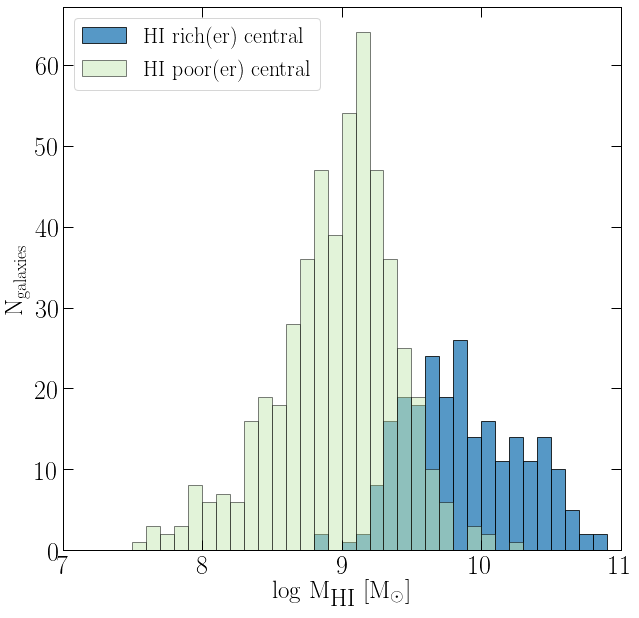

In [47]:
fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

binwidth=0.1
bins = np.arange(7.5, 11 + binwidth, binwidth)
    
#axHistx.hist(x_data, bins=bins, color=color,alpha=0.8, edgecolor='k', linewidth=1)
#axHisty.hist(y_data, bins=bins, orientation='horizontal', color=color, alpha=0.8, edgecolor='k', linewidth=1) 

plt.hist(richer_central_hi_m, bins=bins, color='#2c7fb8', edgecolor='k', linewidth=1, alpha=0.8, label='HI rich(er) central')
plt.hist(poorer_central_hi_m, bins=bins, color='#c7e9b4', edgecolor='k', linewidth=1, alpha=0.5, label='HI poor(er) central')

ax.set_ylabel(r'N$_{\mathrm{galaxies}}$', fontsize=25)
ax.set_xlabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

plt.xlim(7,11)
plt.legend(loc=2)
plt.show()

In [47]:
@jit
def two_sided_histogram_rich(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor):
    """
    Make a scatter plot with 2 datasets and then place histogram on both x and y axis for them. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset. Floats. Can be list/array. 
                  In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    color : Boolean. Chose color in case you want differen one. If not specified, will be the default one for satellites.
            Use different color in case there is only one dataset, for exaple:
            two_sided_histogram_groups(x, y, [], [], 'grey')
    
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_groups(x_cen, y_cen, x_sat, y_sat)``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
               
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                
               Indices:
               central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
               satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
               To this, condition is added which check the mass of the central vs. satellites.
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_cen_rich, y_cen_rich, color='#2c7fb8', label='HI rich(er) central')
    axScatter.scatter(x_cen_poor, y_cen_poor, color='#c7e9b4', label='HI poor(er) central', alpha=0.8)
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    axHistx.hist(x_cen_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_cen_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_cen_poor, bins=bins, color='#c7e9b4',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_cen_poor, bins=bins, orientation='horizontal', color='#c7e9b4', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3)


    return plt.show()
    

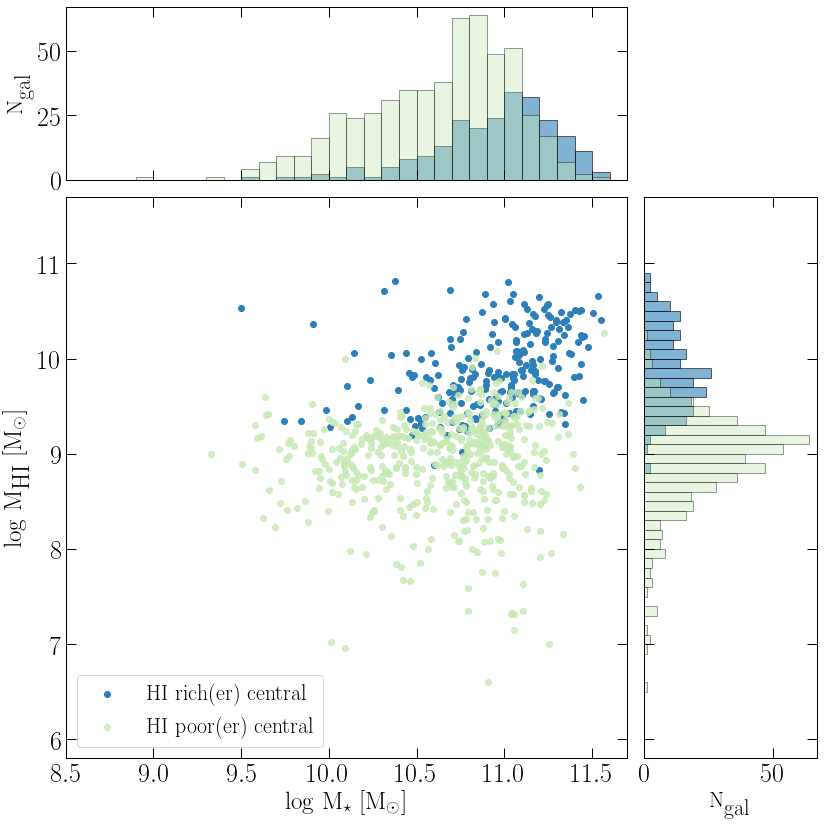

In [49]:
#Centrals more HI rich than the sum of their satellites
two_sided_histogram_rich(richer_central_s_m, richer_central_hi_m, poorer_central_s_m, poorer_central_hi_m) 

In [48]:
@jit
def two_sided_histogram_rich_groups(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor,
                                   x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor):
    """
    Make a scatter plot with 8 datasets and then place histogram on both x and y axis for them as rich/poor central groups. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset - here are centrals which are HI richer than their
                            satellites. Floats. Should be list/array; use .ravel() if needed
                            to reduce the dimensionality.  
                            In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset - here are centrals which are poorer than their
                            satellites. Should be list/array; use .ravel() if needed to reduce the dimensionality.
                            In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor:
                            Same as above; just uses satellites around their respective central galaxy.
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 
``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                Indices:
                central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
                satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
                To this, condition is added which check the mass of the central vs. satellites.
                
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
    axScatter.scatter(x_cen_rich, y_cen_rich, color='white', edgecolor='#2c7fb8', s=80, linewidth=2, label='HI rich(er) central')
    axScatter.scatter(x_sat_rich, y_sat_rich, color='#2c7fb8', edgecolor='#2c7fb8', s=80, linewidth=2, label='HI rich(er) central\'s satellite')

    axScatter.scatter(x_cen_poor, y_cen_poor, color='white', edgecolor='lightgrey', s=80, linewidth=2, label='HI poor(er) central', alpha=0.8)
    axScatter.scatter(x_sat_poor, y_sat_poor, color='lightgrey', edgecolor='lightgrey', s=80, linewidth=2, label='HI poor(er) central\'s satellite', alpha=0.8)
    
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    
    
    x_rich = sorted(list(set(x_cen_rich)) + list(set(x_sat_rich)))
    y_rich = sorted(list(set(y_cen_rich)) + list(set(y_sat_rich)))
    
    x_poor = sorted(list(set(x_cen_poor)) + list(set(x_sat_poor)))
    y_poor = sorted(list(set(y_cen_poor)) + list(set(y_sat_poor)))
    
    axHistx.hist(x_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_poor, bins=bins, color='lightgrey',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_poor, bins=bins, orientation='horizontal', color='lightgrey', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3, fontsize=13)


    return plt.show()
    

In [49]:
@jit
def two_sided_histogram_difference(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor,
                                   x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor):
    """
    Make a scatter plot with 8 datasets and then place histogram on both x and y axis for them
    Here plot groups with small difference in stellar mass but large in HI mass between cen/sat. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset - here are centrals with small Mstar diff and large
                            Mhi difference. Floats. Should be list/array; use .ravel() if needed
                            to reduce the dimensionality.  
                            In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset - other/normal groups. 
                            Should be list/array; use .ravel() if needed to reduce the dimensionality.
                            In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor:
                            Same as above; just uses satellites around their respective central galaxy.
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 
``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                Indices:
                central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
                satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
                To this, condition is added which check the mass of the central vs. satellites.
                
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:

    axScatter.scatter(x_cen_poor, y_cen_poor, color='white', edgecolor='lightgrey', s=80, linewidth=2, label='Other central', alpha=0.8)
    axScatter.scatter(x_sat_poor, y_sat_poor, color='lightgrey', edgecolor='lightgrey', s=80, linewidth=2, label='Other central\'s satellite', alpha=0.8)

    axScatter.scatter(x_cen_rich, y_cen_rich, color='white', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central')
    axScatter.scatter(x_sat_rich, y_sat_rich, color='#2c7fb8', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central\'s satellite')

    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    
    
    x_rich = sorted(list(set(x_cen_rich)) + list(set(x_sat_rich)))
    y_rich = sorted(list(set(y_cen_rich)) + list(set(y_sat_rich)))
    
    x_poor = sorted(list(set(x_cen_poor)) + list(set(x_sat_poor)))
    y_poor = sorted(list(set(y_cen_poor)) + list(set(y_sat_poor)))
    
    axHistx.hist(x_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_poor, bins=bins, color='lightgrey',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_poor, bins=bins, orientation='horizontal', color='lightgrey', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3, fontsize=13)


    return plt.show()
    

In [50]:
@jit
def two_sided_histogram_difference_groups(x_cen_rich, y_cen_rich, x_cen_poor, y_cen_poor,
                                   x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor,
                                  x_group, y_group):
    """
    Make a scatter plot with 8 datasets and then place histogram on both x and y axis for them
    Here plot groups with small difference in stellar mass but large in HI mass between cen/sat. 
    Here I use logMhi vesus logMstar -- other data will need readjustment of the min/max.
    
    Parameters
    ==========
    x_cen_rich, y_cen_rich: x and y values of the first dataset - here are centrals with small Mstar diff and large
                            Mhi difference. Floats. Should be list/array; use .ravel() if needed
                            to reduce the dimensionality.  
                            In this case, I am using logMHI and logMstar of central galaxies.
    
    x_cen_poor, y_cen_poor: x and y values of the second dataset - other/normal groups. 
                            Should be list/array; use .ravel() if needed to reduce the dimensionality.
                            In this case, I am using logMHI and logMstar of satellite galaxies.                        
        
    x_sat_rich, y_sat_rich, x_sat_poor, y_sat_poor:
                            Same as above; just uses satellites around their respective central galaxy.
    
    Returns
    =======
    A scatter plot with histogram on x and y axis for both datasets. 
    
    Usage
    =====
    To use type: ``two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 
``
               I extracted satellite and central gal from dictionary using ``updated_dict`` and 
               group_size=2 for pairs -- can be any group_size number
                Indices:
                central_idx = updated_dict[3]["Groups"][group_key]["Centrals"]
                satellite_inds = updated_dict[3]["Groups"][group_key]["Satellites"]
                
                To this, condition is added which check the mass of the central vs. satellites.
                
                
    """

    
    nullfmt = NullFormatter()         # no labels
    
    # definitions for the axes
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    bottom_h = left_h = left + width + 0.02
    
    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom_h, width, 0.2]
    rect_histy = [left_h, bottom, 0.2, height]
    
    # start with a rectangular Figure
    plt.figure(1, figsize=(12, 12))
    
    axScatter = plt.axes(rect_scatter)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    # no labels
    axHistx.xaxis.set_major_formatter(nullfmt)
    axHisty.yaxis.set_major_formatter(nullfmt)
    
    # the scatter plot:
        
    axScatter.scatter(x_cen_poor, y_cen_poor, color='white', edgecolor='lightgrey', s=80, linewidth=2, label='Other central', alpha=0.6)
    axScatter.scatter(x_sat_poor, y_sat_poor, color='lightgrey', edgecolor='lightgrey', s=80, linewidth=2, label='Other central\'s satellite', alpha=0.6)
   
    
    axScatter.scatter(x_cen_rich, y_cen_rich, color='white', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central')
    axScatter.scatter(x_sat_rich, y_sat_rich, color='#2c7fb8', edgecolor='#2c7fb8', s=80, linewidth=2, label='Large diff central\'s satellite')

    #MARK THE RICH ONES
    markers = itertools.cycle(('o', 'o', 'o', 's', 's', 's','D', 'D', 'D','p', 'p', 'p', 'd', 'd', 'd',
                             'P', 'P', 'P', '*', '*', '*','<', '<', '<','v', 'v', 'v', '^', '^', '^',
                              'x', 'x', 'x')) 
 
    #col = matplotlib.cm.viridis(np.linspace(0, 1, len(x_group)))
    #colors = itertools.cycle(col)
    
    for i in range(0,len(x_group),1):
        axScatter.scatter(x_group[i],y_group[i], marker = next(markers), color = '',edgecolor='k', s=400)
        
    #marker = itertools.cycle(('o', 's', 'p', 'P', '*', 'h', 'D', 'd'))
    #axScatter.scatter(x_group, y_group, color='#fa9fb5', marker=next(marker), s=250, label='Groups', alpha=0.8)
    #print(len(x_group)) == 15 
    #print(len(x_group[1]))
    
    axScatter.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    axScatter.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)

    # now determine nice limits by hand:
    binwidth = 0.1
    xymax = np.max([np.max(np.fabs(x)), np.max(np.fabs(x))])
    lim = (int(xymax/binwidth) + 1) * binwidth
    
    axScatter.set_xlim((8.5, 11.7))
    axScatter.set_ylim((5.8, 11.7))
    
    bins = np.arange(5.8, lim + binwidth, binwidth)
    
    
    x_rich = sorted(list(set(x_cen_rich)) + list(set(x_sat_rich)))
    y_rich = sorted(list(set(y_cen_rich)) + list(set(y_sat_rich)))
    
    x_poor = sorted(list(set(x_cen_poor)) + list(set(x_sat_poor)))
    y_poor = sorted(list(set(y_cen_poor)) + list(set(y_sat_poor)))
    
    axHistx.hist(x_rich, bins=bins, color='#2c7fb8', alpha=0.6, edgecolor='k', linewidth=1)
    axHisty.hist(y_rich, bins=bins, orientation='horizontal', alpha=0.6, color='#2c7fb8', edgecolor='k', linewidth=1)
    
    axHistx.hist(x_poor, bins=bins, color='lightgrey',alpha=0.4, edgecolor='k', linewidth=1)
    axHisty.hist(y_poor, bins=bins, orientation='horizontal', color='lightgrey', alpha=0.4, edgecolor='k', linewidth=1) 

    axHistx.set_ylabel(r'N$_{\textrm{gal}}$', fontsize=22)
    axHisty.set_xlabel(r'N$_{\textrm{gal}}$', fontsize=22)
    
    axHistx.set_xlim(axScatter.get_xlim())
    axHisty.set_ylim(axScatter.get_ylim())

    axScatter.legend(loc=3, fontsize=13)


    return plt.show()
    

## Groups Length-3

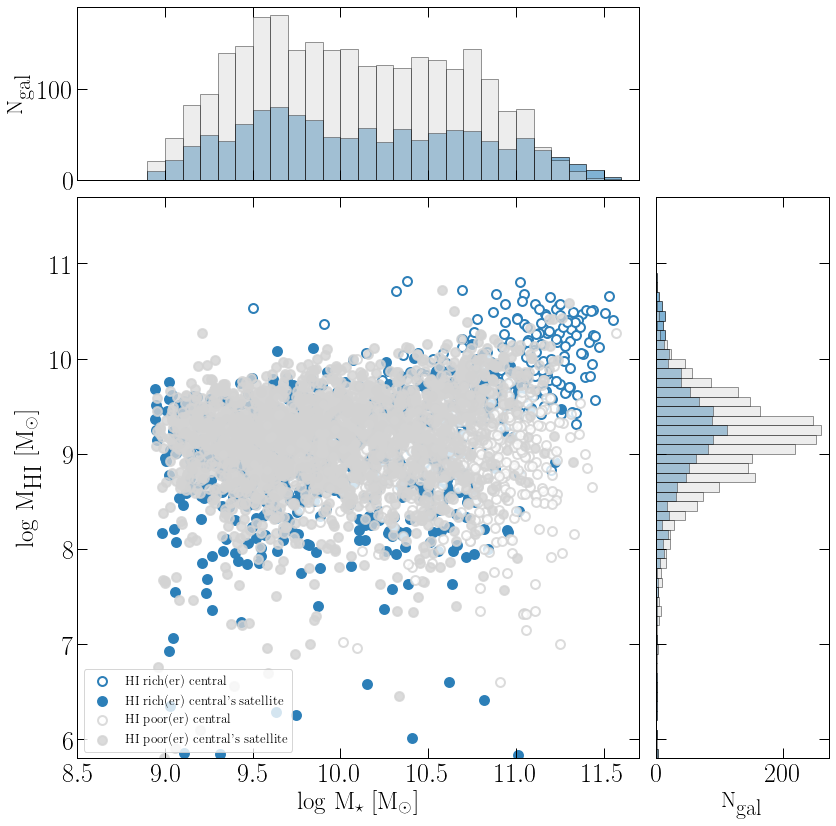

In [53]:
# Central gals which are more HI rich than the sum of their satellites --- also marks position of their satellites
# And vice versa
two_sided_histogram_rich_groups(richer_central_s_m.ravel(), richer_central_hi_m.ravel(), poorer_central_s_m.ravel(), poorer_central_hi_m.ravel(),
                                richer_sat_s_m.ravel(), richer_sat_hi_m.ravel(), poorer_sat_s_m.ravel(), poorer_sat_hi_m.ravel()) 


# Extract rich(er) and poor(er) from all size-d groups

In [48]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

all_richer_central_ind = []
all_poorer_central_ind = []

all_richer_sat_ind = [] #satellites that belong to richer central
all_poorer_sat_ind = [] #satellites that belong to poorer central

for i in trange(3,10,1): #starting grom galaxy pairs
    for group_key in updated_dict[i]["Groups"].keys():
        central_idx = updated_dict[i]["Groups"][group_key]["Centrals"] #give indices
        central_mass = np.sum(G['DiscHI'],axis=1)[central_idx] #give masses of these galaxies
    
        satellite_inds = updated_dict[i]["Groups"][group_key]["Satellites"]
        sat_mass = np.sum(G['DiscHI'],axis=1)[satellite_inds]
    
        if (central_mass > sat_mass).all(): #check conditions
            print("Central is the most HI massive")
            all_richer_central_ind.append(central_idx) 
            all_richer_sat_ind.extend(satellite_inds) #it complains and complicates when i want to do .append
        else:
            print("Satellite is more HI massive thatn central")
            all_poorer_central_ind.append(central_idx)
            all_poorer_sat_ind.extend(satellite_inds)
        #print(sat_mass > central_mass)
    
        print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
        print("")


  0%|          | 0/7 [00:00<?, ?it/s]

Central is the most HI massive
Central mass is [1.7153461] and sat masses are [0.06906993 0.09697242]

Satellite is more HI massive thatn central
Central mass is [0.15540755] and sat masses are [0.12781921 0.17335452]

Satellite is more HI massive thatn central
Central mass is [0.16649424] and sat masses are [0.18389466 0.05094769]

Satellite is more HI massive thatn central
Central mass is [0.01658152] and sat masses are [0.07774934 0.11448571]

Satellite is more HI massive thatn central
Central mass is [0.05982171] and sat masses are [0.07125283 0.2850502 ]

Satellite is more HI massive thatn central
Central mass is [0.06139318] and sat masses are [0.0499579  0.11261014]

Satellite is more HI massive thatn central
Central mass is [0.12575132] and sat masses are [0.29197252 0.14685738]

Central is the most HI massive
Central mass is [0.5539247] and sat masses are [0.06811111 0.        ]

Satellite is more HI massive thatn central
Central mass is [0.] and sat masses are [0.        0.02

KeyboardInterrupt: 

In [75]:
#HI Masses, obtained from the indices: 
all_richer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[all_richer_central_ind] *1e10/h )+1)
all_poorer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[all_poorer_central_ind] *1e10/h )+1)
all_richer_central_s_m = np.log10( G['StellarMass'][all_richer_central_ind] *1e10/h +1)
all_poorer_central_s_m = np.log10( G['StellarMass'][all_poorer_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
all_richer_sat_hi_m = []
all_richer_sat_s_m = []

for item in all_richer_sat_ind:
    a_richer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[item] *1e10/h )+1)
    a_richer_sat_s_m = np.log10( G['StellarMass'][item] *1e10/h +1)
    all_richer_sat_hi_m.append(a_richer_sat_hi_m)
    all_richer_sat_s_m.append(a_richer_sat_s_m)

all_poorer_sat_hi_m = []
all_poorer_sat_s_m = []
for item in all_poorer_sat_ind:    
    a_poorer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[item] *1e10/h )+1)
    a_poorer_sat_s_m = np.log10( G['StellarMass'][item] *1e10/h +1)
    all_poorer_sat_hi_m.append(a_poorer_sat_hi_m)
    all_poorer_sat_s_m.append(a_poorer_sat_s_m)


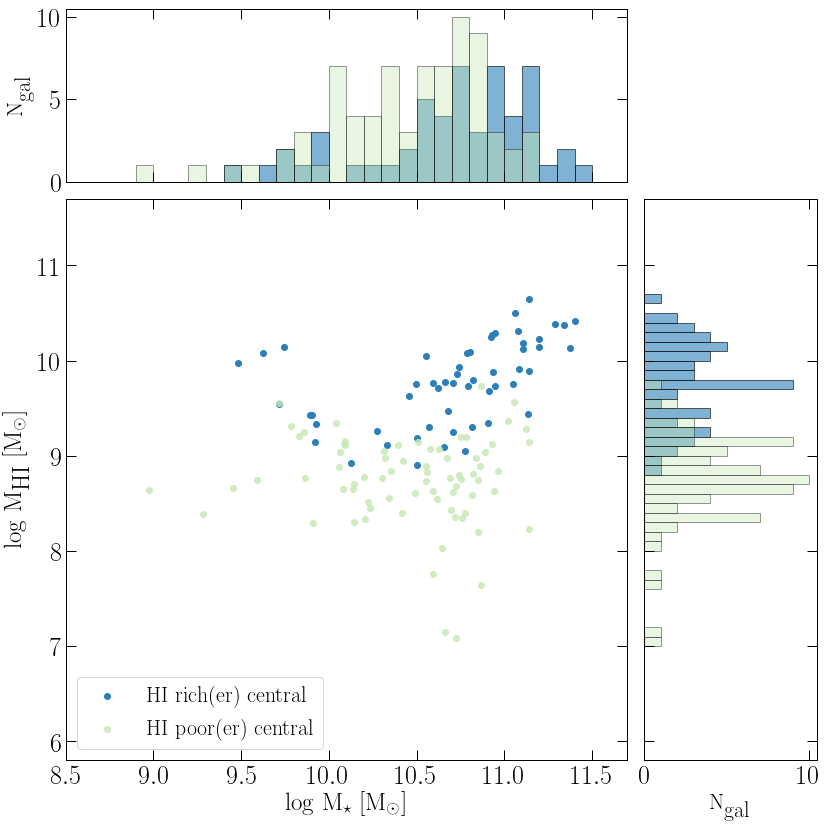

In [76]:
two_sided_histogram_rich(all_richer_central_s_m, all_richer_central_hi_m, 
                         all_poorer_central_s_m, all_poorer_central_hi_m) 

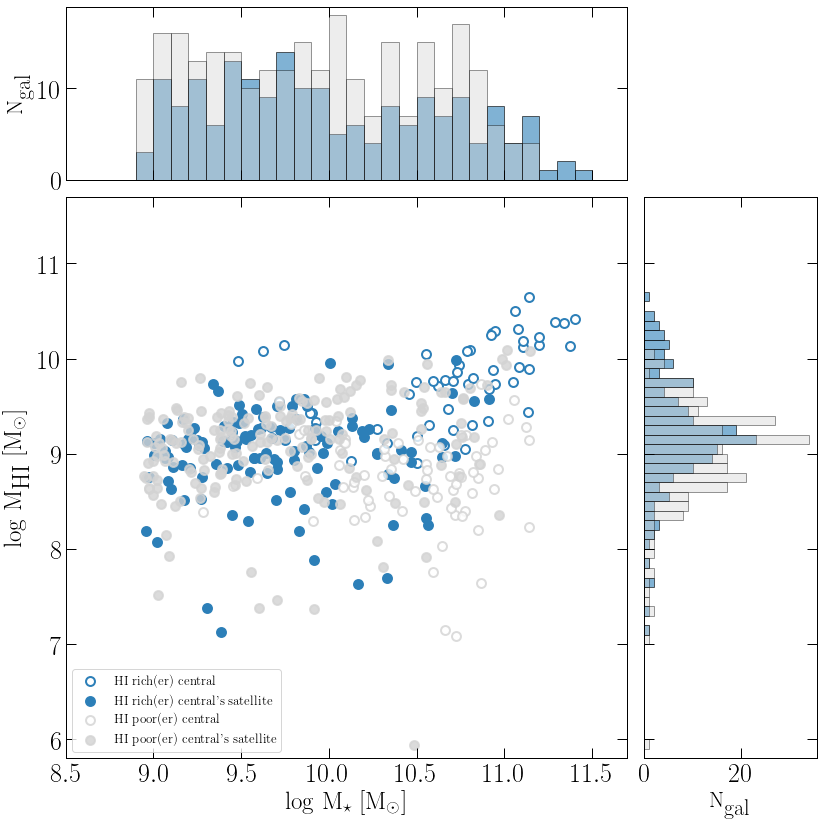

In [77]:
two_sided_histogram_rich_groups(all_richer_central_s_m.ravel(), all_richer_central_hi_m.ravel(), 
                                all_poorer_central_s_m.ravel(), all_poorer_central_hi_m.ravel(),
                                all_richer_sat_s_m, all_richer_sat_hi_m, 
                                all_poorer_sat_s_m, all_poorer_sat_hi_m) 


# See the distribution of groups where central galaxy is X% HI richer than the sum of the satellites around that central
### Percent = M_HI_central/ (Sum[ M_HI_satellites ])

In [51]:
per_cent_with_pairs =[]

In [52]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

perc_richer_central_ind = [] #storring where central/satellite is above/below some percentage
perc_poorer_central_ind = []

perc_richer_sat_ind = [] #satellites that belong to richer central
perc_poorer_sat_ind = [] #satellites that belong to poorer central

per_cent = [] # How much of HI mass is in central galaxy (in %)

central_hi_mass_per_cent = []
central_st_mass_per_cent = []
group_size_per_cent = []

BTT_central = []
BTT_satellite = []

group_HI_mass = []
group_St_mass = []

In [53]:
#BTT_central[0]

In [54]:
# STORE INDICES

c_ind = []
s_ind = []
g_ind = []

for i in trange(3,21,1): #starting grom galaxy pairs
    for group_key in updated_dict[i]["Groups"].keys():
        central_idx = updated_dict[i]["Groups"][group_key]["Centrals"] #give indices
        c_ind.append(central_idx)
               
        all_idx = updated_dict[i]["Groups"][group_key]["Centrals"]+updated_dict[i]["Groups"][group_key]["Satellites"]
        g_ind.append(all_idx)
        
        satellite_inds = updated_dict[i]["Groups"][group_key]["Satellites"]
        s_ind.append(satellite_inds)

100%|██████████| 18/18 [00:00<00:00, 1794.74it/s]


In [55]:
# Compute central galaxies
central_mass = np.sum(G['DiscHI'],axis=1)[c_ind]*1e10/h
central_st_mass = G['StellarMass'][c_ind]*1e10/h

In [102]:
g_mass = np.sum(G['DiscHI'],axis=1)[0]*1e10/h
type(g_mass)
#type(g_m)

numpy.float64

In [148]:
# Compute group properties 
g_m = []
g_st = []
@jit
def compute_group_properties():
    for i in tqdm(g_ind):
        g_mass = np.sum(G['DiscHI'],axis=1)[i]*1e10/h
        g_st_mass = G['StellarMass'][i]*1e10/h
        g_m.append(np.sum(g_mass, axis=0))
        g_st.append(np.sum(g_st_mass, axis=0))
    

In [144]:
print(g_ind[0:5])
#averages = G['StellarMass'][g_ind]*1e10/h for [g_ind] in zip(g_ind[:-1], g_ind[1:])]


[[981, 983, 982], [994, 995, 996], [1324, 1326, 1325], [1511, 1512, 1513], [2152, 2154, 2153]]


In [135]:
gmass = G['StellarMass'][g_ind[0]]*1e10/h
print(gmass)

[2.8462825e+11 2.6066696e+09 1.0562085e+09]


In [145]:
compute_group_properties()





  0%|          | 0/7546 [00:00<?, ?it/s]



  0%|          | 5/7546 [00:00<02:47, 44.99it/s]



  0%|          | 10/7546 [00:00<02:48, 44.77it/s]



  0%|          | 15/7546 [00:00<02:48, 44.57it/s]



  0%|          | 20/7546 [00:00<02:49, 44.48it/s]



  0%|          | 25/7546 [00:00<02:48, 44.51it/s]



  0%|          | 30/7546 [00:00<02:48, 44.51it/s]



  0%|          | 35/7546 [00:00<02:48, 44.52it/s]



  1%|          | 40/7546 [00:00<02:48, 44.54it/s]



  1%|          | 45/7546 [00:01<02:48, 44.56it/s]



  1%|          | 50/7546 [00:01<02:48, 44.53it/s]



  1%|          | 55/7546 [00:01<02:48, 44.54it/s]



  1%|          | 60/7546 [00:01<02:48, 44.50it/s]



  1%|          | 65/7546 [00:01<02:48, 44.52it/s]



  1%|          | 70/7546 [00:01<02:47, 44.52it/s]



  1%|          | 75/7546 [00:01<02:47, 44.52it/s]



  1%|          | 80/7546 [00:01<02:47, 44.52it/s]



  1%|          | 85/7546 [00:01<02:47, 44.52it/s]



  1%|          | 90/7546 [00:02<02:47, 44.53it/s]




  8%|▊         | 620/7546 [00:14<02:36, 44.26it/s]



  8%|▊         | 625/7546 [00:14<02:36, 44.26it/s]



  8%|▊         | 630/7546 [00:14<02:36, 44.26it/s]



  8%|▊         | 635/7546 [00:14<02:36, 44.25it/s]



  8%|▊         | 640/7546 [00:14<02:36, 44.25it/s]



  9%|▊         | 645/7546 [00:14<02:35, 44.24it/s]



  9%|▊         | 650/7546 [00:14<02:35, 44.24it/s]



  9%|▊         | 655/7546 [00:14<02:35, 44.24it/s]



  9%|▊         | 660/7546 [00:14<02:35, 44.24it/s]



  9%|▉         | 665/7546 [00:15<02:35, 44.23it/s]



  9%|▉         | 670/7546 [00:15<02:35, 44.23it/s]



  9%|▉         | 675/7546 [00:15<02:35, 44.23it/s]



  9%|▉         | 680/7546 [00:15<02:35, 44.23it/s]



  9%|▉         | 685/7546 [00:15<02:35, 44.24it/s]



  9%|▉         | 690/7546 [00:15<02:34, 44.24it/s]



  9%|▉         | 695/7546 [00:15<02:34, 44.24it/s]



  9%|▉         | 700/7546 [00:15<02:34, 44.24it/s]



  9%|▉         | 705/7546 [00:15<02:34, 44.24it/s]



  9%|▉         | 710/7546 [0

 16%|█▋        | 1235/7546 [00:28<02:23, 44.07it/s]



 16%|█▋        | 1240/7546 [00:28<02:23, 44.07it/s]



 16%|█▋        | 1245/7546 [00:28<02:22, 44.07it/s]



 17%|█▋        | 1250/7546 [00:28<02:22, 44.07it/s]



 17%|█▋        | 1255/7546 [00:28<02:22, 44.07it/s]



 17%|█▋        | 1260/7546 [00:28<02:22, 44.07it/s]



 17%|█▋        | 1265/7546 [00:28<02:22, 44.07it/s]



 17%|█▋        | 1270/7546 [00:28<02:22, 44.07it/s]



 17%|█▋        | 1275/7546 [00:28<02:22, 44.08it/s]



 17%|█▋        | 1280/7546 [00:29<02:22, 44.08it/s]



 17%|█▋        | 1285/7546 [00:29<02:22, 44.08it/s]



 17%|█▋        | 1290/7546 [00:29<02:21, 44.08it/s]



 17%|█▋        | 1295/7546 [00:29<02:21, 44.07it/s]



 17%|█▋        | 1300/7546 [00:29<02:21, 44.07it/s]



 17%|█▋        | 1305/7546 [00:29<02:21, 44.07it/s]



 17%|█▋        | 1310/7546 [00:29<02:21, 44.07it/s]



 17%|█▋        | 1315/7546 [00:29<02:21, 44.07it/s]



 17%|█▋        | 1320/7546 [00:29<02:21, 44.06it/s]



 18%|█▊   

 24%|██▍       | 1845/7546 [00:41<02:09, 44.10it/s]



 25%|██▍       | 1850/7546 [00:41<02:09, 44.10it/s]



 25%|██▍       | 1855/7546 [00:42<02:09, 44.10it/s]



 25%|██▍       | 1860/7546 [00:42<02:08, 44.10it/s]



 25%|██▍       | 1865/7546 [00:42<02:08, 44.10it/s]



 25%|██▍       | 1870/7546 [00:42<02:08, 44.10it/s]



 25%|██▍       | 1875/7546 [00:42<02:08, 44.10it/s]



 25%|██▍       | 1880/7546 [00:42<02:08, 44.10it/s]



 25%|██▍       | 1885/7546 [00:42<02:08, 44.11it/s]



 25%|██▌       | 1890/7546 [00:42<02:08, 44.11it/s]



 25%|██▌       | 1895/7546 [00:42<02:08, 44.11it/s]



 25%|██▌       | 1900/7546 [00:43<02:08, 44.11it/s]



 25%|██▌       | 1905/7546 [00:43<02:07, 44.11it/s]



 25%|██▌       | 1910/7546 [00:43<02:07, 44.11it/s]



 25%|██▌       | 1915/7546 [00:43<02:07, 44.11it/s]



 25%|██▌       | 1920/7546 [00:43<02:07, 44.11it/s]



 26%|██▌       | 1925/7546 [00:43<02:07, 44.11it/s]



 26%|██▌       | 1930/7546 [00:43<02:07, 44.11it/s]



 26%|██▌  

 33%|███▎      | 2455/7546 [00:55<01:55, 44.15it/s]



 33%|███▎      | 2460/7546 [00:55<01:55, 44.15it/s]



 33%|███▎      | 2465/7546 [00:55<01:55, 44.15it/s]



 33%|███▎      | 2470/7546 [00:55<01:54, 44.14it/s]



 33%|███▎      | 2475/7546 [00:56<01:54, 44.14it/s]



 33%|███▎      | 2480/7546 [00:56<01:54, 44.14it/s]



 33%|███▎      | 2485/7546 [00:56<01:54, 44.14it/s]



 33%|███▎      | 2490/7546 [00:56<01:54, 44.13it/s]



 33%|███▎      | 2495/7546 [00:56<01:54, 44.13it/s]



 33%|███▎      | 2500/7546 [00:56<01:54, 44.13it/s]



 33%|███▎      | 2505/7546 [00:56<01:54, 44.13it/s]



 33%|███▎      | 2510/7546 [00:56<01:54, 44.13it/s]



 33%|███▎      | 2515/7546 [00:56<01:54, 44.12it/s]



 33%|███▎      | 2520/7546 [00:57<01:53, 44.12it/s]



 33%|███▎      | 2525/7546 [00:57<01:53, 44.12it/s]



 34%|███▎      | 2530/7546 [00:57<01:53, 44.12it/s]



 34%|███▎      | 2535/7546 [00:57<01:53, 44.11it/s]



 34%|███▎      | 2540/7546 [00:57<01:53, 44.11it/s]



 34%|███▎ 

 41%|████      | 3065/7546 [01:09<01:41, 43.95it/s]



 41%|████      | 3070/7546 [01:09<01:41, 43.95it/s]



 41%|████      | 3075/7546 [01:09<01:41, 43.95it/s]



 41%|████      | 3080/7546 [01:10<01:41, 43.94it/s]



 41%|████      | 3085/7546 [01:10<01:41, 43.94it/s]



 41%|████      | 3090/7546 [01:10<01:41, 43.94it/s]



 41%|████      | 3095/7546 [01:10<01:41, 43.94it/s]



 41%|████      | 3100/7546 [01:10<01:41, 43.94it/s]



 41%|████      | 3105/7546 [01:10<01:41, 43.94it/s]



 41%|████      | 3110/7546 [01:10<01:40, 43.94it/s]



 41%|████▏     | 3115/7546 [01:10<01:40, 43.94it/s]



 41%|████▏     | 3120/7546 [01:11<01:40, 43.93it/s]



 41%|████▏     | 3125/7546 [01:11<01:40, 43.93it/s]



 41%|████▏     | 3130/7546 [01:11<01:40, 43.93it/s]



 42%|████▏     | 3135/7546 [01:11<01:40, 43.93it/s]



 42%|████▏     | 3140/7546 [01:11<01:40, 43.93it/s]



 42%|████▏     | 3145/7546 [01:11<01:40, 43.93it/s]



 42%|████▏     | 3150/7546 [01:11<01:40, 43.93it/s]



 42%|████▏

 49%|████▊     | 3675/7546 [01:23<01:28, 43.87it/s]



 49%|████▉     | 3680/7546 [01:23<01:28, 43.87it/s]



 49%|████▉     | 3685/7546 [01:23<01:28, 43.87it/s]



 49%|████▉     | 3690/7546 [01:24<01:27, 43.87it/s]



 49%|████▉     | 3695/7546 [01:24<01:27, 43.87it/s]



 49%|████▉     | 3700/7546 [01:24<01:27, 43.87it/s]



 49%|████▉     | 3705/7546 [01:24<01:27, 43.87it/s]



 49%|████▉     | 3710/7546 [01:24<01:27, 43.87it/s]



 49%|████▉     | 3715/7546 [01:24<01:27, 43.87it/s]



 49%|████▉     | 3720/7546 [01:24<01:27, 43.88it/s]



 49%|████▉     | 3725/7546 [01:24<01:27, 43.88it/s]



 49%|████▉     | 3730/7546 [01:25<01:26, 43.88it/s]



 49%|████▉     | 3735/7546 [01:25<01:26, 43.88it/s]



 50%|████▉     | 3740/7546 [01:25<01:26, 43.88it/s]



 50%|████▉     | 3745/7546 [01:25<01:26, 43.88it/s]



 50%|████▉     | 3750/7546 [01:25<01:26, 43.88it/s]



 50%|████▉     | 3755/7546 [01:25<01:26, 43.88it/s]



 50%|████▉     | 3760/7546 [01:25<01:26, 43.88it/s]



 50%|████▉

 57%|█████▋    | 4277/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4282/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4287/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4292/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4297/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4302/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4307/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4312/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4317/7546 [01:38<01:14, 43.62it/s]



 57%|█████▋    | 4322/7546 [01:39<01:13, 43.62it/s]



 57%|█████▋    | 4327/7546 [01:39<01:13, 43.62it/s]



 57%|█████▋    | 4332/7546 [01:39<01:13, 43.62it/s]



 57%|█████▋    | 4337/7546 [01:39<01:13, 43.62it/s]



 58%|█████▊    | 4342/7546 [01:39<01:13, 43.62it/s]



 58%|█████▊    | 4347/7546 [01:39<01:13, 43.62it/s]



 58%|█████▊    | 4352/7546 [01:39<01:13, 43.62it/s]



 58%|█████▊    | 4357/7546 [01:39<01:13, 43.63it/s]



 58%|█████▊    | 4362/7546 [01:39<01:12, 43.63it/s]



 58%|█████

 65%|██████▍   | 4887/7546 [01:51<01:00, 43.66it/s]



 65%|██████▍   | 4892/7546 [01:52<01:00, 43.66it/s]



 65%|██████▍   | 4897/7546 [01:52<01:00, 43.66it/s]



 65%|██████▍   | 4902/7546 [01:52<01:00, 43.66it/s]



 65%|██████▌   | 4907/7546 [01:52<01:00, 43.66it/s]



 65%|██████▌   | 4912/7546 [01:52<01:00, 43.66it/s]



 65%|██████▌   | 4917/7546 [01:52<01:00, 43.66it/s]



 65%|██████▌   | 4922/7546 [01:52<01:00, 43.66it/s]



 65%|██████▌   | 4927/7546 [01:52<00:59, 43.66it/s]



 65%|██████▌   | 4932/7546 [01:52<00:59, 43.66it/s]



 65%|██████▌   | 4937/7546 [01:53<00:59, 43.66it/s]



 65%|██████▌   | 4942/7546 [01:53<00:59, 43.67it/s]



 66%|██████▌   | 4947/7546 [01:53<00:59, 43.67it/s]



 66%|██████▌   | 4952/7546 [01:53<00:59, 43.67it/s]



 66%|██████▌   | 4957/7546 [01:53<00:59, 43.67it/s]



 66%|██████▌   | 4962/7546 [01:53<00:59, 43.67it/s]



 66%|██████▌   | 4967/7546 [01:53<00:59, 43.67it/s]



 66%|██████▌   | 4972/7546 [01:53<00:58, 43.67it/s]



 66%|█████

 73%|███████▎  | 5497/7546 [02:05<00:46, 43.67it/s]



 73%|███████▎  | 5502/7546 [02:05<00:46, 43.67it/s]



 73%|███████▎  | 5507/7546 [02:06<00:46, 43.67it/s]



 73%|███████▎  | 5512/7546 [02:06<00:46, 43.67it/s]



 73%|███████▎  | 5517/7546 [02:06<00:46, 43.67it/s]



 73%|███████▎  | 5522/7546 [02:06<00:46, 43.67it/s]



 73%|███████▎  | 5527/7546 [02:06<00:46, 43.67it/s]



 73%|███████▎  | 5532/7546 [02:06<00:46, 43.67it/s]



 73%|███████▎  | 5537/7546 [02:06<00:45, 43.67it/s]



 73%|███████▎  | 5542/7546 [02:06<00:45, 43.68it/s]



 74%|███████▎  | 5547/7546 [02:07<00:45, 43.68it/s]



 74%|███████▎  | 5552/7546 [02:07<00:45, 43.68it/s]



 74%|███████▎  | 5557/7546 [02:07<00:45, 43.68it/s]



 74%|███████▎  | 5562/7546 [02:07<00:45, 43.68it/s]



 74%|███████▍  | 5567/7546 [02:07<00:45, 43.68it/s]



 74%|███████▍  | 5572/7546 [02:07<00:45, 43.68it/s]



 74%|███████▍  | 5577/7546 [02:07<00:45, 43.68it/s]



 74%|███████▍  | 5582/7546 [02:07<00:44, 43.68it/s]



 74%|█████

 81%|████████  | 6107/7546 [02:19<00:32, 43.70it/s]



 81%|████████  | 6112/7546 [02:19<00:32, 43.71it/s]



 81%|████████  | 6117/7546 [02:19<00:32, 43.71it/s]



 81%|████████  | 6122/7546 [02:20<00:32, 43.71it/s]



 81%|████████  | 6127/7546 [02:20<00:32, 43.71it/s]



 81%|████████▏ | 6132/7546 [02:20<00:32, 43.71it/s]



 81%|████████▏ | 6137/7546 [02:20<00:32, 43.71it/s]



 81%|████████▏ | 6142/7546 [02:20<00:32, 43.71it/s]



 81%|████████▏ | 6147/7546 [02:20<00:32, 43.71it/s]



 82%|████████▏ | 6152/7546 [02:20<00:31, 43.71it/s]



 82%|████████▏ | 6157/7546 [02:20<00:31, 43.71it/s]



 82%|████████▏ | 6162/7546 [02:20<00:31, 43.71it/s]



 82%|████████▏ | 6167/7546 [02:21<00:31, 43.71it/s]



 82%|████████▏ | 6172/7546 [02:21<00:31, 43.71it/s]



 82%|████████▏ | 6177/7546 [02:21<00:31, 43.71it/s]



 82%|████████▏ | 6182/7546 [02:21<00:31, 43.71it/s]



 82%|████████▏ | 6187/7546 [02:21<00:31, 43.71it/s]



 82%|████████▏ | 6192/7546 [02:21<00:30, 43.71it/s]



 82%|█████

 89%|████████▉ | 6717/7546 [02:33<00:18, 43.72it/s]



 89%|████████▉ | 6722/7546 [02:33<00:18, 43.72it/s]



 89%|████████▉ | 6727/7546 [02:33<00:18, 43.72it/s]



 89%|████████▉ | 6732/7546 [02:33<00:18, 43.72it/s]



 89%|████████▉ | 6737/7546 [02:34<00:18, 43.72it/s]



 89%|████████▉ | 6742/7546 [02:34<00:18, 43.72it/s]



 89%|████████▉ | 6747/7546 [02:34<00:18, 43.72it/s]



 89%|████████▉ | 6752/7546 [02:34<00:18, 43.72it/s]



 90%|████████▉ | 6757/7546 [02:34<00:18, 43.72it/s]



 90%|████████▉ | 6762/7546 [02:34<00:17, 43.72it/s]



 90%|████████▉ | 6767/7546 [02:34<00:17, 43.72it/s]



 90%|████████▉ | 6772/7546 [02:34<00:17, 43.72it/s]



 90%|████████▉ | 6777/7546 [02:35<00:17, 43.72it/s]



 90%|████████▉ | 6782/7546 [02:35<00:17, 43.72it/s]



 90%|████████▉ | 6787/7546 [02:35<00:17, 43.72it/s]



 90%|█████████ | 6792/7546 [02:35<00:17, 43.72it/s]



 90%|█████████ | 6797/7546 [02:35<00:17, 43.72it/s]



 90%|█████████ | 6802/7546 [02:35<00:17, 43.72it/s]



 90%|█████

 97%|█████████▋| 7327/7546 [02:47<00:05, 43.73it/s]



 97%|█████████▋| 7332/7546 [02:47<00:04, 43.73it/s]



 97%|█████████▋| 7337/7546 [02:47<00:04, 43.73it/s]



 97%|█████████▋| 7342/7546 [02:47<00:04, 43.73it/s]



 97%|█████████▋| 7347/7546 [02:48<00:04, 43.73it/s]



 97%|█████████▋| 7352/7546 [02:48<00:04, 43.73it/s]



 97%|█████████▋| 7357/7546 [02:48<00:04, 43.73it/s]



 98%|█████████▊| 7362/7546 [02:48<00:04, 43.73it/s]



 98%|█████████▊| 7367/7546 [02:48<00:04, 43.73it/s]



 98%|█████████▊| 7372/7546 [02:48<00:03, 43.73it/s]



 98%|█████████▊| 7377/7546 [02:48<00:03, 43.73it/s]



 98%|█████████▊| 7382/7546 [02:48<00:03, 43.73it/s]



 98%|█████████▊| 7387/7546 [02:48<00:03, 43.73it/s]



 98%|█████████▊| 7392/7546 [02:49<00:03, 43.73it/s]



 98%|█████████▊| 7397/7546 [02:49<00:03, 43.73it/s]



 98%|█████████▊| 7402/7546 [02:49<00:03, 43.73it/s]



 98%|█████████▊| 7407/7546 [02:49<00:03, 43.73it/s]



 98%|█████████▊| 7412/7546 [02:49<00:03, 43.73it/s]



 98%|█████

In [146]:
# Compute percentage
#percentage = (central_mass.ravel()/g_m)*100
percentage_test = (central_mass.ravel()/g_m)*100

#check output
#print(central_mass[0:5].ravel())
#print(g_m[0:5])
#print(percentage)

In [147]:
print(percentage[0:10])
print(percentage_test[0:10])

[91.17447  83.17042  34.037216 41.48494   7.940711 51.918324 48.647156
 14.375909 12.093106 40.49193 ]
[159.78719776 137.32418348 130.07864781   8.79402128  14.72332431
 276.65880412          inf  14.66006241  19.77079487 436.85116147]


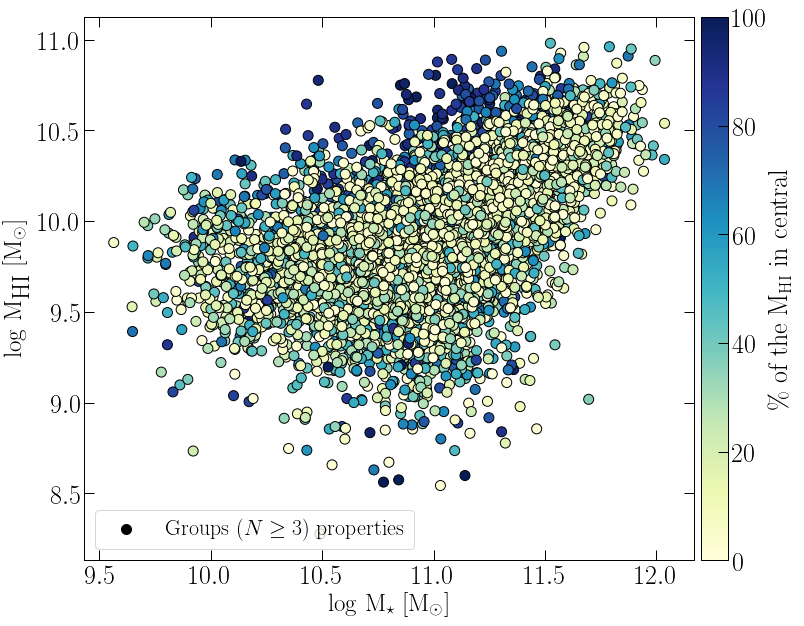

In [59]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')


im = plt.scatter(np.log10(g_st), np.log10(g_m), s=100,
                        c=percentage, edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')


#plt.savefig('Groups_HIinCentral.png')

In [60]:
        #Bulge-to-total ratio
#BTT_sat = (G['InstabilityBulgeMass'][s_ind] + G['MergerBulgeMass'][s_ind]) / ( G['StellarMass'][s_ind] )
BTT_cen = (G['InstabilityBulgeMass'][c_ind] + G['MergerBulgeMass'][c_ind]) / ( G['StellarMass'][c_ind] )
Lenght_cen = G['Len'][c_ind]
Mvir_cen = np.log10( (G['Mvir'][c_ind])*1e10/h)
Rvir_cen = G['Rvir'][c_ind]


## Distribution below is for groups N=+3

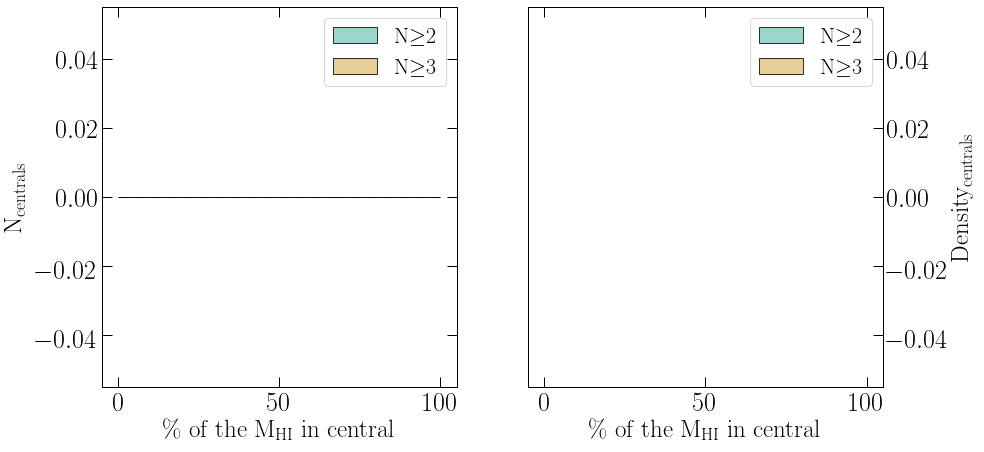

In [59]:
fig = plt.figure(figsize=(14,7))                                                               
ax = fig.add_subplot(1,2,1)

binwidth=5
bins = np.arange(0, 100 + binwidth, binwidth)
    

per_cent = np.nan_to_num(per_cent)
per_cent_with_pairs = np.nan_to_num(per_cent_with_pairs)

plt.hist(per_cent_with_pairs, bins=bins, color='#80cdc1', edgecolor='k', linewidth=1, alpha=0.8, label='N$\geq$2')
plt.hist(per_cent, bins=bins, color='#dfc27d', edgecolor='k', linewidth=1, alpha=0.8, label='N$\geq$3')

ax.set_ylabel(r'N$_{\mathrm{centrals}}$', fontsize=25)
ax.set_xlabel(r'\% of the M$_{\mathrm{HI}}$ in central',fontsize=25)

plt.xlim(-5,105)
plt.legend(loc=1)

ax2 = fig.add_subplot(1,2,2)

    
ax2.hist(per_cent_with_pairs, density=True, bins=bins, color='#80cdc1', edgecolor='k', linewidth=1, alpha=0.8, label='N$\geq$2')
ax2.hist(per_cent, density=True, bins=bins, color='#dfc27d', edgecolor='k', linewidth=1, alpha=0.8, label='N$\geq$3')

ax2.set_xlabel(r'\% of the M$_{\mathrm{HI}}$ in central',fontsize=25)
ax2.set_ylabel(r'Density$_{\mathrm{centrals}}$', fontsize=25)
ax2.yaxis.set_label_position("right")
ax2.yaxis.tick_right()

plt.xlim(-5,105)
plt.legend(loc=1)

plt.show()

In [61]:
grp_length = []
for i in g_ind:
    size = len(i)
    grp_length.append(size)

In [62]:
df_percent = pd.DataFrame({'GroupStellarMass'   : g_st,
                           'GroupHIMass'        : g_m,
                           'Percent'            : percentage,
                           'GroupSize'          : grp_length,
                           'BTT_central'        : BTT_cen.ravel().tolist(),# })
                           'Len_cen'            : Lenght_cen.ravel(),
                           'Mvir_cen'           : Mvir_cen.ravel(),
                           'Rvir_cen'           : Rvir_cen.ravel() })
#print(df_percent)

In [63]:
print(df_percent['BTT_central'][0:4])

0    0.162099
1    0.396030
2    1.000000
3    0.201571
Name: BTT_central, dtype: float64


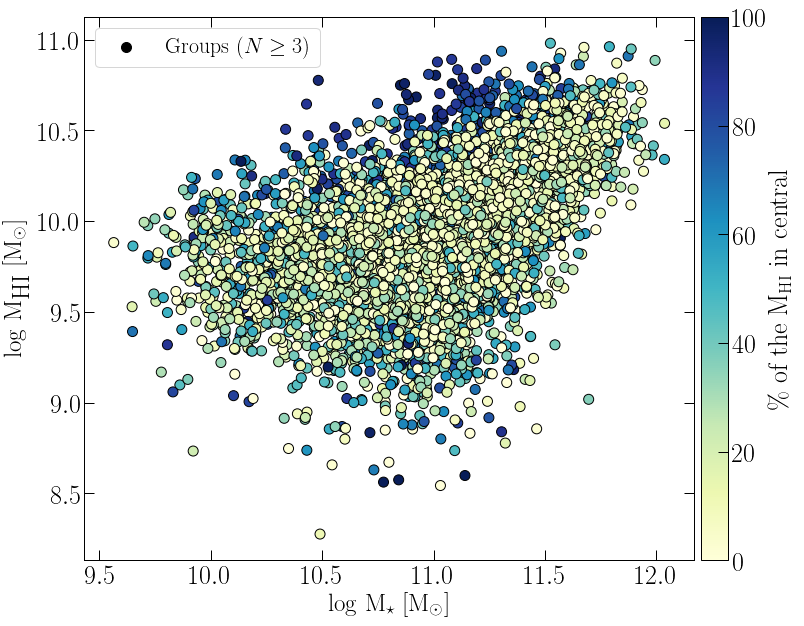

In [64]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), np.log10(df_percent['GroupHIMass']), s=100,
                        c=df_percent['Percent'], edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$)')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

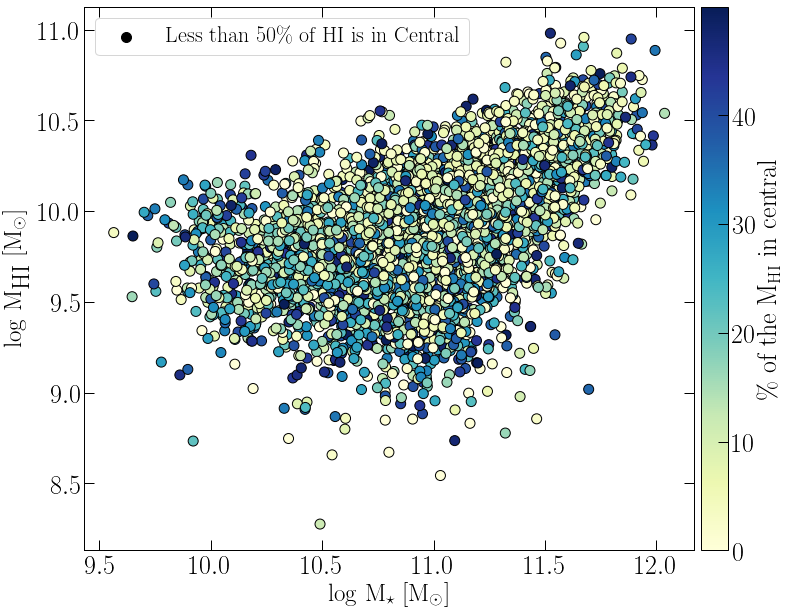

In [65]:
HI_per_cent = 50

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass'][df_percent['Percent']<HI_per_cent]), np.log10(df_percent['GroupHIMass'][df_percent['Percent']<HI_per_cent]), s=100,
                        c=df_percent['Percent'][df_percent['Percent']<HI_per_cent], edgecolor='k', cmap=cm, label=r'Less than {0}\% of HI is in Central'.format(HI_per_cent))

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

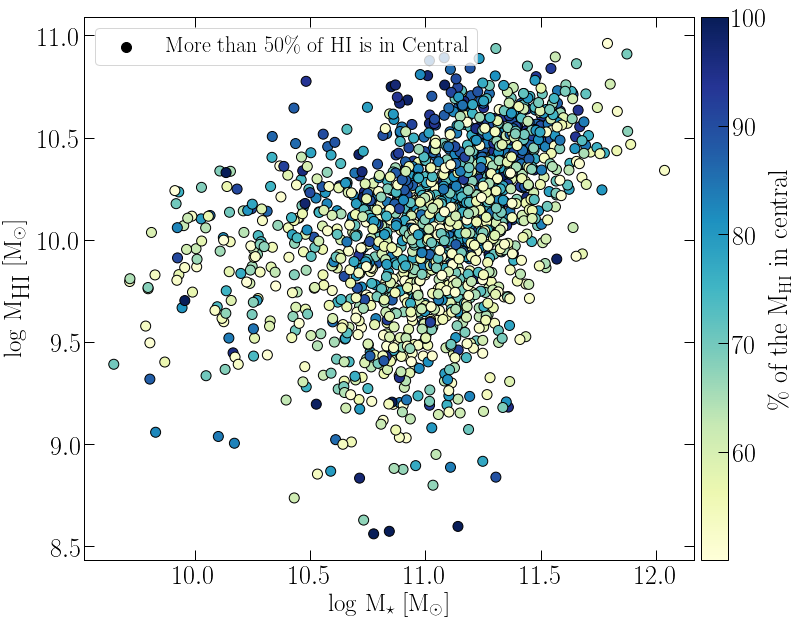

In [66]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass'][df_percent['Percent']>HI_per_cent]), np.log10(df_percent['GroupHIMass'][df_percent['Percent']>HI_per_cent]), s=100,
                        c=df_percent['Percent'][df_percent['Percent']>HI_per_cent], edgecolor='k', cmap=cm, label=r'More than {0}\% of HI is in Central'.format(HI_per_cent))

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

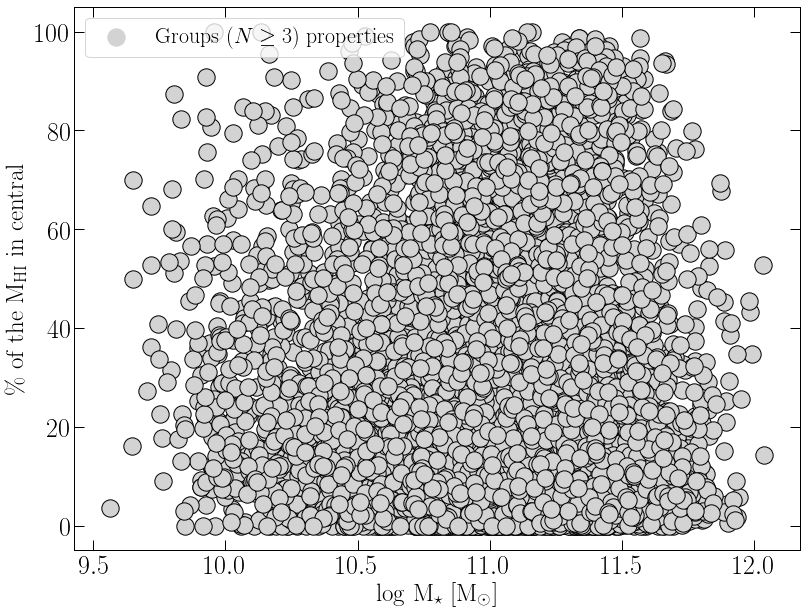

In [67]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), df_percent['Percent'], s=300,
                        color='lightgrey', edgecolor='k', label=r'Groups ($N\geq3$) properties')

#fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
#            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'\% of the M$_{\mathrm{HI}}$ in central',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('lightgrey')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
#plt.savefig('Groups_HIinCentral.png')

# Fixed N-sized groups

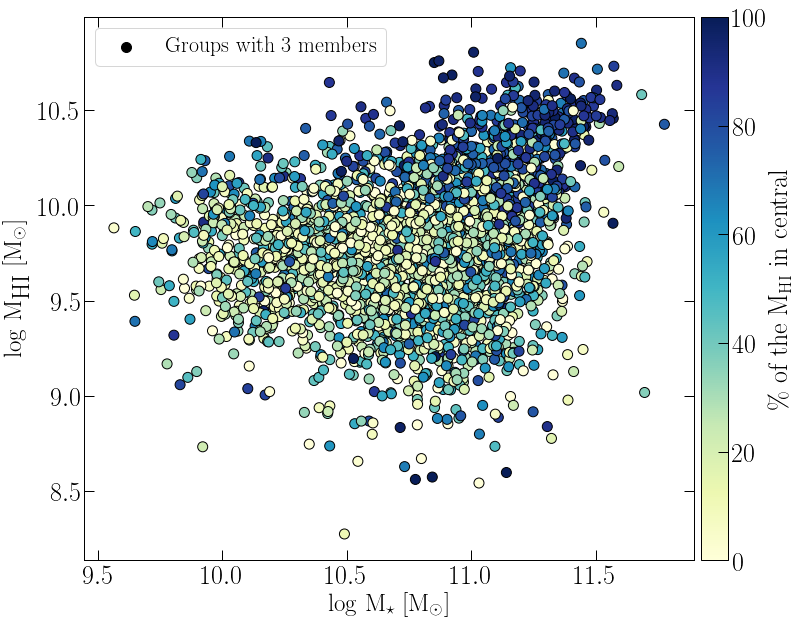

In [68]:
Nsize_group = 3

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
#df_percent['GroupStellarMass'] = df_percent['GroupStellarMass'].astype(np.float64) 
#df_percent['GroupHIMass'] = df_percent['GroupHIMass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass'][df_percent['GroupSize']==Nsize_group]), np.log10(df_percent['GroupHIMass'][df_percent['GroupSize']==Nsize_group]), s=100,
                        c=df_percent['Percent'][df_percent['GroupSize']==Nsize_group], edgecolor='k', cmap=cm, label=r'Groups with {0} members'.format(Nsize_group))

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=2)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

#l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
#l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
#l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
#l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
#l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')
#
#labels = ["3", "4", "5", "6", '7']
#
#leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
#leg.set_title('Group size')                   
                   
#plt.ylim(6,11)
plt.savefig('Groups_HIinCentral.png')

In [69]:
import seaborn as sns

In [70]:

#import matplotlib.font_manager
#matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')

#matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})


/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


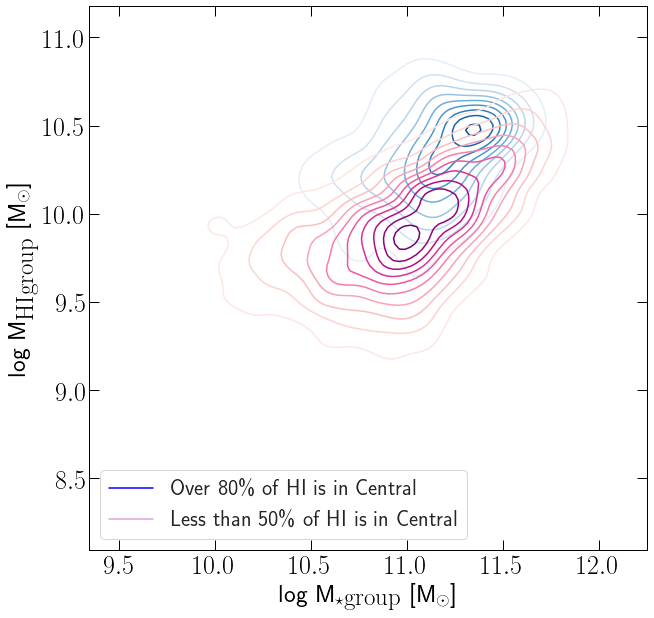

In [71]:
High_percentage = 80
Low_percentage = 50



fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

#sns.set_style("white")
#sns.set(font_scale=2)
sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
						"xtick.minor.size":6,"ytick.minor.size":6})
sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
#matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})


#sns.set_style("white")
sns.kdeplot(np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] >= High_percentage]), 
            np.log10(df_percent['GroupHIMass'][df_percent['Percent'] >= High_percentage]), cmap='Blues', label= 'Over {0}\% of HI is in Central'.format(High_percentage)) #shade=True, shade_lowest=False, 


#sns.kdeplot(np.log10(df_percent['GroupStellarMass'][(df_percent['Percent'] >= 50) & ((df_percent['Percent'] < 80)) ]), 
#            np.log10(df_percent['GroupHIMass'][(df_percent['Percent'] >= 50) & ((df_percent['Percent'] < 80))]), cmap='Greens', label='Rich')

sns.kdeplot(np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] < Low_percentage]), 
            np.log10(df_percent['GroupHIMass'][df_percent['Percent'] < Low_percentage]), cmap='RdPu', label= 'Less than {0}\% of HI is in Central'.format(Low_percentage))


#sns.kdeplot(np.log10(df_percent['StellarM'][df_percent['GroupSize']==Nsize_group]), 
#            np.log10(df_percent['HImass'][df_percent['GroupSize']==Nsize_group]), 
#            cmap="Blues", shade=True, shade_lowest=True, )

ax.set_xlabel(r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',fontsize=25)
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')

plt.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('blue')
leg.legendHandles[1].set_color('plum')
#leg.legendHandles[2].set_color('plum')
#plt.ylim(9.1,11)
plt.show()


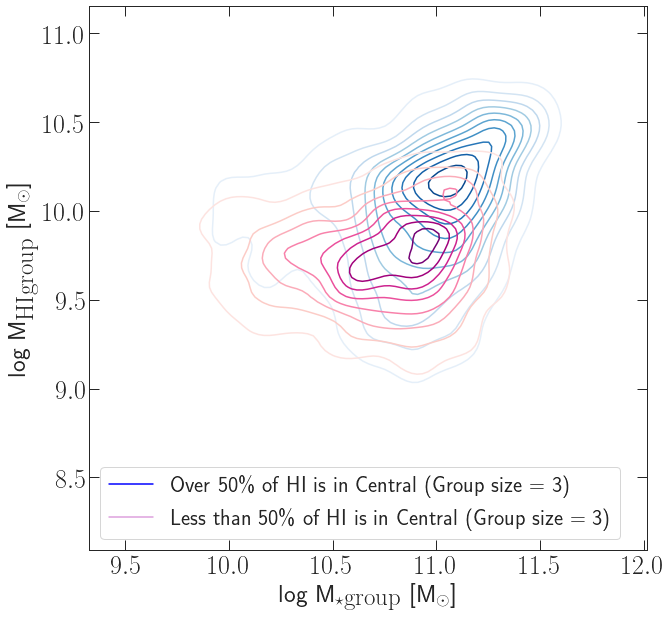

In [72]:
High_percentage = 50
Low_percentage = 50
Nsize_group = 3


fig = plt.figure(figsize=(10,10))                                                               
ax = fig.add_subplot(1,1,1)

#sns.set_style("white")
#sns.set(font_scale=2)
sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
						"xtick.minor.size":6,"ytick.minor.size":6})
sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
#matplotlib.rcParams.update({'font.size': fsize, 'xtick.major.size': 10, 'ytick.major.size': 10, 'xtick.major.width': 1, 'ytick.major.width': 1, 'ytick.minor.size': 5, 'xtick.minor.size': 5, 'xtick.direction': 'in', 'ytick.direction': 'in', 'axes.linewidth': 1, 'text.usetex': True, 'font.family': 'serif', 'font.serif': 'Times New Roman', 'legend.numpoints': 1, 'legend.columnspacing': 1, 'legend.fontsize': fsize-4, 'xtick.top': True, 'ytick.right': True})


#sns.set_style("white")
#sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ]), 
#            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ]), cmap='Purples', 
#            label= 'Over {0}\% of HI is in Central (Group size = {1})'.format(High_percentage, Nsize_group)) #shade=True, shade_lowest=False, 

#sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ]), 
#            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ]), cmap='Blues', 
#            label= 'Over {0}\% of HI is in Central (Group size = {1})'.format(High_percentage, Nsize_group)) #shade=True, shade_lowest=False, 

sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==Nsize_group) ]), 
            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==Nsize_group) ]), cmap='Blues', 
            label= 'Over {0}\% of HI is in Central (Group size = {1})'.format(High_percentage, Nsize_group)) #shade=True, shade_lowest=False, 


sns.kdeplot(np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] < Low_percentage) & (df_percent['GroupSize']==Nsize_group) ]), 
            np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] < Low_percentage) & (df_percent['GroupSize']==Nsize_group) ]), cmap='RdPu', 
            label= 'Less than {0}\% of HI is in Central (Group size = {1})'.format(Low_percentage, Nsize_group))



ax.set_xlabel(r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',fontsize=25)
ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')

plt.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('blue')
leg.legendHandles[1].set_color('plum')
#leg.legendHandles[2].set_color('plum')
#plt.ylim(9.1,11)
plt.show()


In [73]:
matplotlib.__version__ #has to be 3.0.3; For sure is not working with 2.2.2
#import numpy as np
import pylab
from scipy.stats import skewnorm
from numpy.random import normal, multivariate_normal
from chainconsumer import ChainConsumer

#%matplotlib inline

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


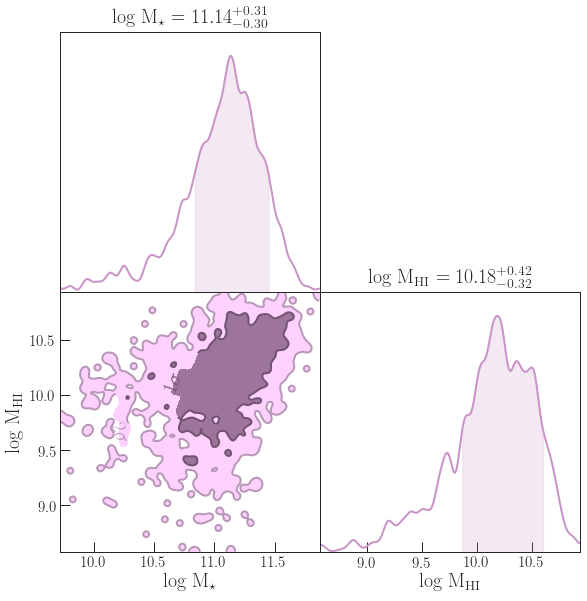

In [74]:
High_percentage = 60
Low_percentage = 50
Nsize_group = 3

x, y = np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] >= High_percentage]), np.log10(df_percent['GroupHIMass'][df_percent['Percent'] >= High_percentage])

parameters = ["$\mathrm{log}$ $\mathrm{M}_{\star}$", "$\mathrm{log}$ $\mathrm{M}_{\mathrm{HI}}$"]
c = ChainConsumer().add_chain([x, y], parameters=parameters, name='Over {0}\% of HI is in Central'.format(High_percentage))

#properties at: https://samreay.github.io/ChainConsumer/chain_api.html
# The default case, so you don't need to specify: sigma2d gives  levels for 1D Gaussians - ie confidence levels of 68% and 95%.
#if sigma2d True : onfidence levels for 2D Gaussians, where 1 and 2 σ represents 39% and 86% confidence levels respectively

c.configure(statistics='max', flip=False, sigma2d=False, diagonal_tick_labels=False,  linewidths=2, linestyles=['-'],
            label_font_size=20, tick_font_size=15, contour_labels='sigma', contour_label_font_size=20, shade_alpha=1, colors='#c994c7', spacing=0)   # max_ticks=4 ; smooth=0

fig = c.plotter.plot()
fig.set_size_inches(5.5 + fig.get_size_inches())  # Resize fig for doco. You don't need this.
plt.show()

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


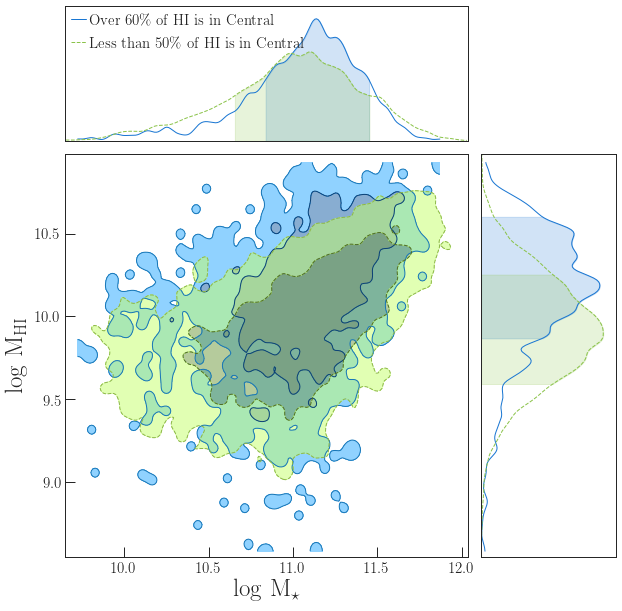

In [75]:
High_percentage = 60
Low_percentage = 50
Nsize_group = 10

x1, y1 = np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] >= High_percentage]), np.log10(df_percent['GroupHIMass'][df_percent['Percent'] >= High_percentage])
x2, y2 = np.log10(df_percent['GroupStellarMass'][df_percent['Percent'] < Low_percentage]), np.log10(df_percent['GroupHIMass'][df_percent['Percent'] < Low_percentage])

parameters = ["$\mathrm{log}$ $\mathrm{M}_{\star}$", "$\mathrm{log}$ $\mathrm{M}_{\mathrm{HI}}$"]

c = ChainConsumer()
c.add_chain([x1, y1], parameters=parameters, name='Over {0}\% of HI is in Central'.format(High_percentage))
c.add_chain([x2, y2], parameters=parameters, name='Less than {0}\% of HI is in Central'.format(Low_percentage))


#Change sigmas to only 1 and it will show only 95%
c.configure(statistics='max', linestyles=["-", "--"], linewidths=[1.0, 1.0],  sigma2d=False, sigmas=[1,2], diagonal_tick_labels=False,
            legend_kwargs={"loc": "upper left", "fontsize": 15},
            legend_color_text=False, legend_location=(0, 0),
           label_font_size=25, tick_font_size=15, contour_label_font_size=20) #colors=['#2b8cbe', '#f4a582'],

fig = c.plotter.plot(figsize=1.5)
fig.set_size_inches(4.5 + fig.get_size_inches())  # Resize fig for doco. You don't need this.

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


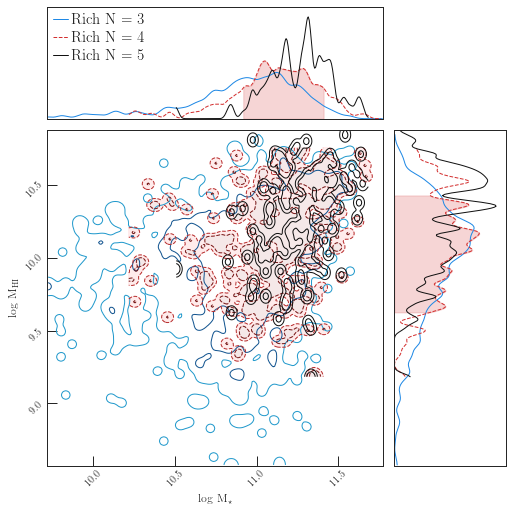

In [76]:
High_percentage = 50
Low_percentage = 50
Nsize_group = 4

x1, y1 = np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ]), np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==3) ])
    
x2, y2 = np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==4) ]), np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==4) ])

x3, y3 = np.log10(df_percent['GroupStellarMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ]), np.log10(df_percent['GroupHIMass'][ (df_percent['Percent'] >= High_percentage) & (df_percent['GroupSize']==5) ])

parameters = ["$\mathrm{log}$ $\mathrm{M}_{\star}$", "$\mathrm{log}$ $\mathrm{M}_{\mathrm{HI}}$"]

c = ChainConsumer()
c.add_chain([x1, y1], parameters=parameters, name="Rich N = 3")
c.add_chain([x2, y2], parameters=parameters, name="Rich N = 4")
c.add_chain([x3, y3], parameters=parameters, name="Rich N = 5")

c.configure(linestyles=["-", "--", "-"], linewidths=[1.0, 1.0, 1.0],
            legend_kwargs={"loc": "upper left", "fontsize": 15},
            legend_color_text=False, legend_location=(0, 0),
            colors=["#1E88E5", "#D32F2F", "#111111"],
            shade=[False, True, True],
            shade_alpha=[0.2, 0.1, 0.0], bar_shade=[False, True, True])
fig = c.plotter.plot()

fig.set_size_inches(4.5 + fig.get_size_inches())  # Resize fig for doco. You don't need this.


# Pair plot

In [77]:
import math

def roundup(x):
    return int(math.ceil(x / 10.0)) * 10 # Add whether it will be by increment of 5 or 10 or something third

rounded_per = []
for i in df_percent['Percent']:
    A = roundup(i)#_test = (central_mass.ravel()/g_m)*100
    rounded_per.append(A)
print(rounded_per[0:10])

[100, 90, 40, 50, 10, 60, 50, 20, 20, 50]


In [78]:
df_pair = pd.DataFrame({'GroupStellarMass'      : np.log10(g_st),
                           'GroupHIMass'        : np.log10(g_m),
                           'Percent'            : percentage,
                           'GroupSize'          : grp_length,
                           'BTTcentral'         : BTT_cen.ravel() ,
                            'Mvircen'           : Mvir_cen.ravel(),
                           'Rvircen'            : Rvir_cen.ravel(),# })
                           'RoundedPercent'     : rounded_per})

In [79]:
@jit
def make_pair_plot(dataframe):
    sns.set(font_scale=1)
    sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
                            "xtick.minor.size":6,"ytick.minor.size":6})
    sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
    
    
    g = sns.PairGrid(dataframe, diag_sharey=False)
    g.map_lower(sns.kdeplot)
    g.map_upper(sns.scatterplot)
    g.map_diag(sns.kdeplot, lw=3)

# To hide upper scatter plot axies: axis
#for i, j in zip(*np.triu_indices_from(g.axes, 1)):
#    g.axes[i, j].set_visible(False)


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


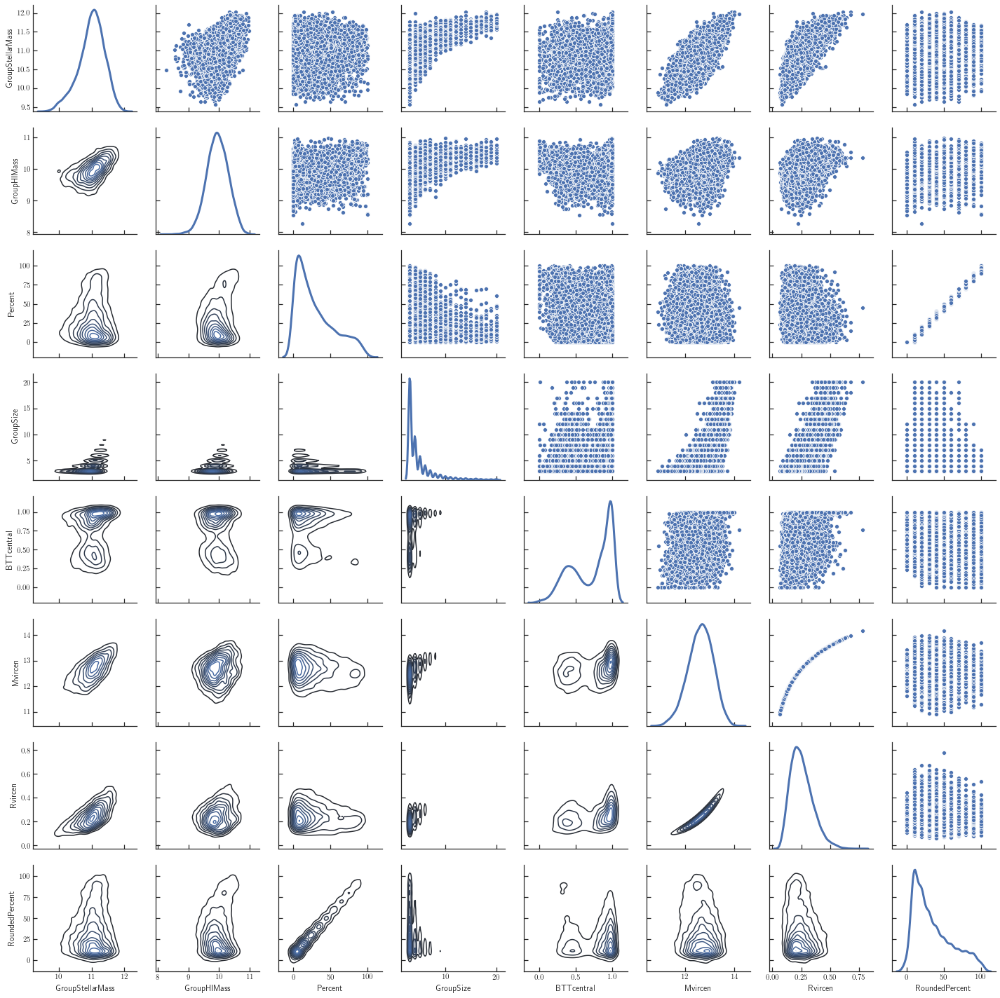

In [80]:
make_pair_plot(df_pair)

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


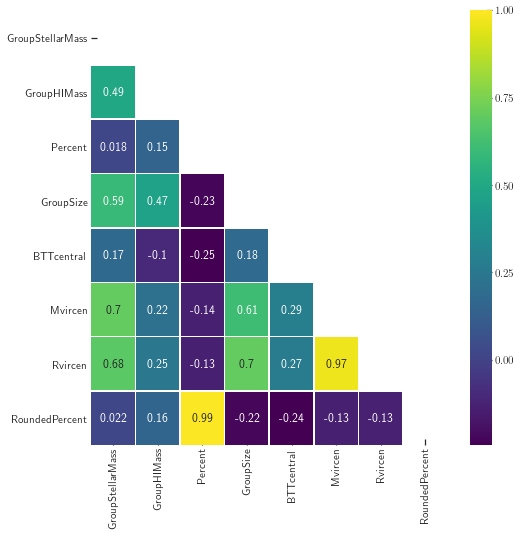

In [81]:
fig = plt.figure(figsize=(8,8))                                                               
ax = fig.add_subplot(1,1,1)

corr = df_pair.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr, annot=True, cmap='viridis',  linewidths=.5, mask=mask, vmax=1,
        xticklabels=corr.columns,
        yticklabels=corr.columns)

In [82]:
from __future__ import unicode_literals
import joypy
from matplotlib import cm


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


<Figure size 1280x800 with 0 Axes>

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


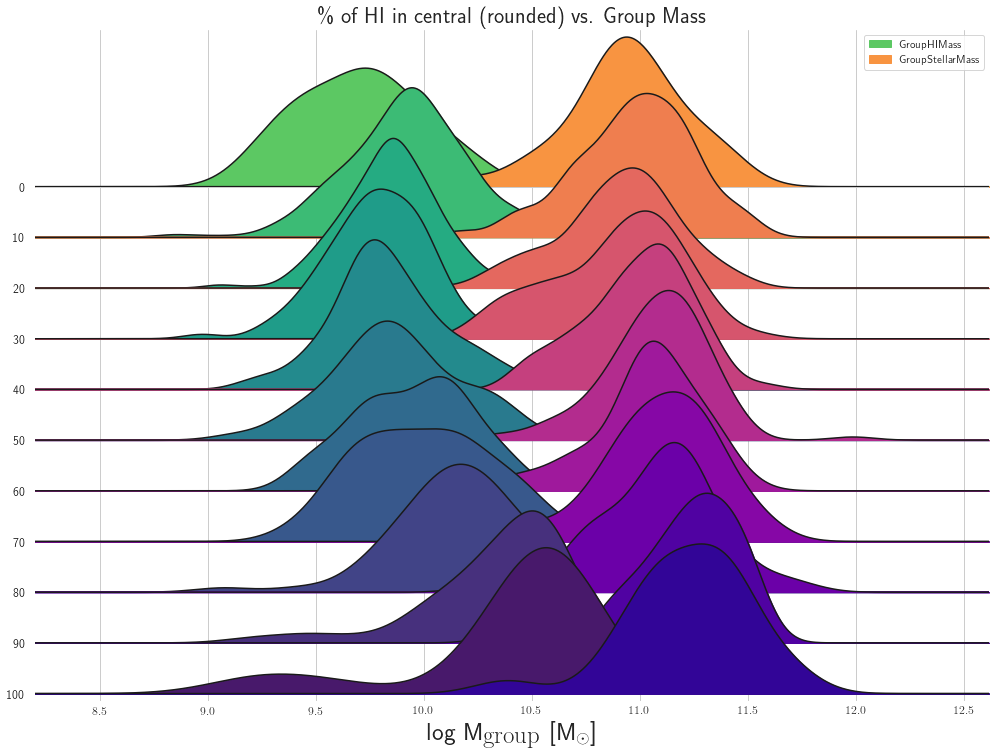

In [83]:
# Import Data
#mpg = pd.read_csv("https://github.com/selva86/datasets/raw/master/mpg_ggplot2.csv")
from matplotlib.colors import LinearSegmentedColormap
# Remove from 0 to 0.15 in the colorbar
interval = np.hstack([np.linspace(0.25, 1)])
colors1 = plt.cm.plasma_r(interval)
cmap = LinearSegmentedColormap.from_list('name', colors1)
cmap.set_under(color='white')
interval = np.hstack([np.linspace(0.25, 1)])
colors2 = plt.cm.viridis_r(interval)
cmap2 = LinearSegmentedColormap.from_list('name', colors2)

# Draw Plot
plt.figure(figsize=(16,10), dpi= 80)
fig, axes = joypy.joyplot(df_pair[df_pair['GroupSize']==4], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=30, overlap=2, 
                          colormap=[cmap2, cmap], grid=True, legend=True)
#axes = joypy.joyplot(df_pair[df_pair['GroupSize']==3], column=['GroupHIMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=2, colormap=[cm.cividis_r])

# Decoration
plt.title(r'\% of HI in central (rounded) vs. Group Mass', fontsize=22)

axes[-1].set_xlabel(r' log M$_{\textrm{group}}$ [M$_{\odot}$]', fontsize=25)

#plt.xaxis('A')
plt.show()

/home/rdzudzar/.local/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes
  
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
/home/rdzudzar/.local/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes
  # Remove the CWD from sys.path while we load stuff.
/home/rdzudzar/.local/lib/python3.6/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed

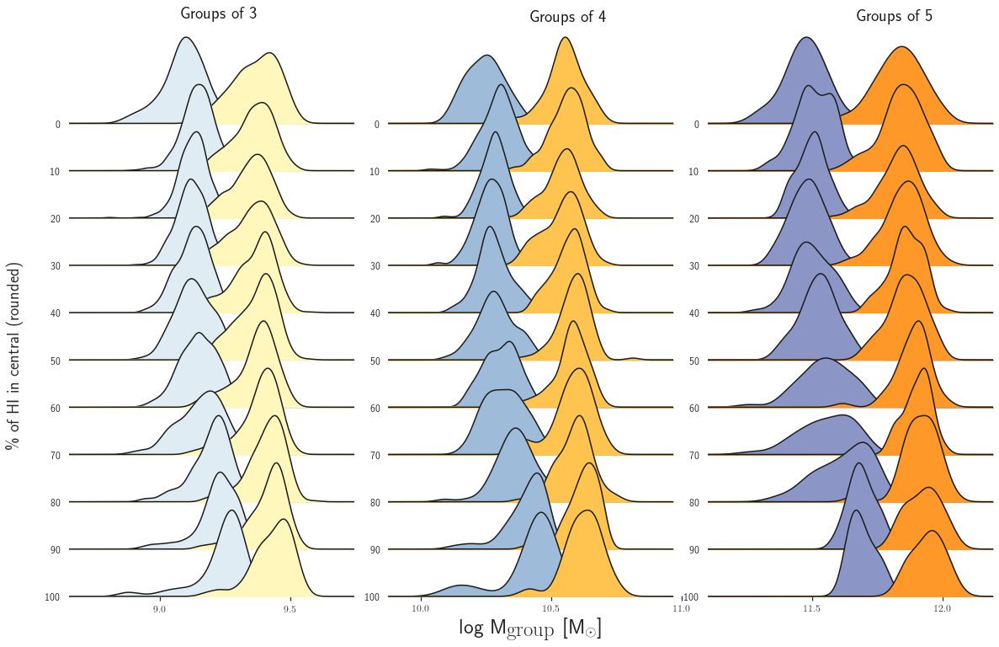

In [84]:
f, axes = plt.subplots(11,3, figsize=(16,10))
first_column = [axes[i][0] for i in range(11)]
second_column = [axes[i][1] for i in range(11)]
third_column = [axes[i][2] for i in range(11)]


joypy.joyplot(df_pair[df_pair['GroupSize']==3], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                          color=['#e0ecf4', '#fff7bc'], ax=first_column)
joypy.joyplot(df_pair[df_pair['GroupSize']==4], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                          color=['#9ebcda', '#fec44f'], ax=second_column)
joypy.joyplot(df_pair[df_pair['GroupSize']==5], column=['GroupHIMass', 'GroupStellarMass'], by="RoundedPercent", ylim='own', figsize=(14,10),hist=False, bins=50, overlap=1, 
                          color=['#8c96c6', '#fe9929'], ax=third_column)

axes[0][0].text(9.5, 1.4, "Groups of 3", color="k", fontsize=20)
axes[0][1].text(10.4, 1.8, "Groups of 4", color="k", fontsize=20)
axes[0][2].text(10.5, 1.7, "Groups of 5", color="k", fontsize=20)

axes[0][0].text(6.5, -2, r'\% of HI in central (rounded)', rotation = 90, fontsize=20)

#plt.title(r'\% of HI in central (rounded) vs. Group Mass', fontsize=22)

plt.xlabel(r' log M$_{\textrm{group}}$ [M$_{\odot}$]', fontsize=25)

plt.show()

# Also 'joy' plot in seaborn... 
### Messes up with the legend colors ...

In [111]:
#
#sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
#
#pal = sns.cubehelix_palette(21, rot=.15, light=.5)
#g = sns.FacetGrid(df_pair[df_pair['GroupSize']==3], row="RoundedPercent", hue='RoundedPercent', aspect=15, height=.7, palette=pal, legend_out=True) #hue='GroupSize'
##g = sns.FacetGrid(df_pair[df_pair['GroupSize']==4], row="RoundedPercent", hue='RoundedPercent', aspect=15, height=.7, palette=pal, legend_out=True) #hue='GroupSize'
#
## Draw the densities in a few steps
#g.map(sns.kdeplot, "GroupHIMass", clip_on=True, shade=True, alpha=0.8, lw=1.5, bw=.1)
#g.map(sns.kdeplot, "GroupStellarMass", clip_on=True, shade=True, lw=2, bw=.1)
#g.map(plt.axhline, y=0, lw=2, clip_on=False)
#
##Define and use a simple function to label the plot in axes coordinates
#def label(x, color, label):
#    ax = plt.gca()
#    ax.text(0, .2, label, fontweight="bold", color=color,
#            ha="left", va="center", transform=ax.transAxes)
#
#g.map(label, 'RoundedPercent')
#
#g.fig.subplots_adjust(hspace=-.25)
#
## Remove axes details that don't play well with overlap
#g.set_titles("")
#g.set(yticks=[])
#g.despine(bottom=True, left=True)
#

# Pair plot for specific parameters

In [462]:
#sns.set(font_scale=1)
#sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
#						"xtick.minor.size":6,"ytick.minor.size":6})
#sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
#
#
## Adding size, hue, palette and specify variables in vars
#variables = ["Percent", "GroupHIMass", "Rvircen"]
#g = sns.pairplot(df_pair, height=5, hue="GroupSize", palette="Purples", vars=variables,
#                plot_kws = {'s': 80, 'edgecolor': 'k'})
##g.map_diag(plt.hist, density=True)
#g._legend.get_title().set_fontsize(20) 
#
#
## Axis Labels
#replacements = {"GroupStellarMass": r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', 
#                "GroupHIMass"     : r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',
#                "Percent"         : r'\% of HI in Central',
#                "GroupSize"       : r'Group Size'}
#
#for i in range(len(variables)):
#    for j in range(len(variables)):
#        xlabel = g.axes[i][j].get_xlabel()
#        ylabel = g.axes[i][j].get_ylabel()
#        if xlabel in replacements.keys():
#            g.axes[i][j].set_xlabel(replacements[xlabel], fontsize=17)
#        if ylabel in replacements.keys():
#            g.axes[i][j].set_ylabel(replacements[ylabel], fontsize=17)
#            
##Legend
#for i in range(len(g.fig.get_children()[-1].texts)):
#    label = g.fig.get_children()[-1].texts[i].get_text()
#    if label in replacements.keys():
#        g.fig.get_children()[-1].texts[i].set_text(replacements[label])
#g.fig.get_children()[-1].set_bbox_to_anchor((1.05, 0.5, 0, 0))
#
#


In [467]:
#sns.set(font_scale=1)
#sns.set_style("ticks", {"xtick.major.size":10, "ytick.major.size":10,
#						"xtick.minor.size":6,"ytick.minor.size":6})
#sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
#
#
## Adding size, hue, palette and specify variables in vars
#variables = ["Percent", "GroupHIMass", "Rvircen"]
#g = sns.pairplot(df_pair, height=5, hue="GroupSize", palette="Purples", vars=variables,
#                plot_kws = {'s': 80, 'edgecolor': 'k'})
##g.map_diag(plt.hist, density=True)
#g._legend.get_title().set_fontsize(20) 
#
#
## Axis Labels
#replacements = {"GroupStellarMass": r'log M$_{\star\textrm{group}}$ [M$_{\odot}$]', 
#                "GroupHIMass"     : r'log M$_{\textrm{HI}\textrm{group}}$ [M$_{\odot}$]',
#                "Percent"         : r'\% of HI in Central',
#                "GroupSize"       : r'Group Size'}
#
#for i in range(len(variables)):
#    for j in range(len(variables)):
#        xlabel = g.axes[i][j].get_xlabel()
#        ylabel = g.axes[i][j].get_ylabel()
#        if xlabel in replacements.keys():
#            g.axes[i][j].set_xlabel(replacements[xlabel], fontsize=17)
#        if ylabel in replacements.keys():
#            g.axes[i][j].set_ylabel(replacements[ylabel], fontsize=17)
#            
##Legend
#for i in range(len(g.fig.get_children()[-1].texts)):
#    label = g.fig.get_children()[-1].texts[i].get_text()
#    if label in replacements.keys():
#        g.fig.get_children()[-1].texts[i].set_text(replacements[label])
#g.fig.get_children()[-1].set_bbox_to_anchor((1.05, 0.5, 0, 0))
#
#



INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


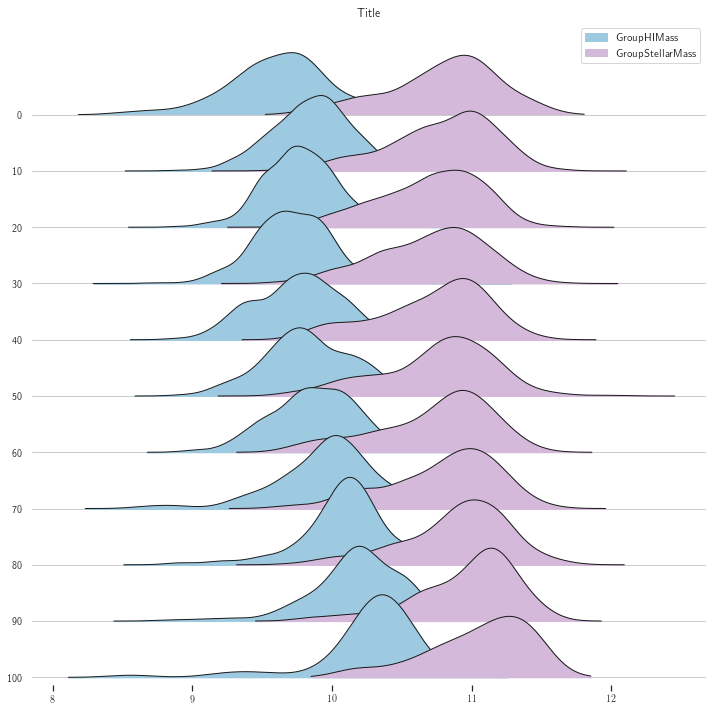

In [85]:
%matplotlib inline
try:
    #labels=[y if y%1==0 else None for y in list(df_pair.GroupHIMass.unique())]
    fig, axes = joypy.joyplot(df_pair, by="RoundedPercent", column=["GroupHIMass","GroupStellarMass"], range_style='own',
                          grid="y", linewidth=1, legend=True, loc="best", figsize=(10,10), overlap=1,
                          title="Title", color=['#9ecae1', '#d4b9da']
                          )        
except ValueError:
    pass  # do nothing!

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


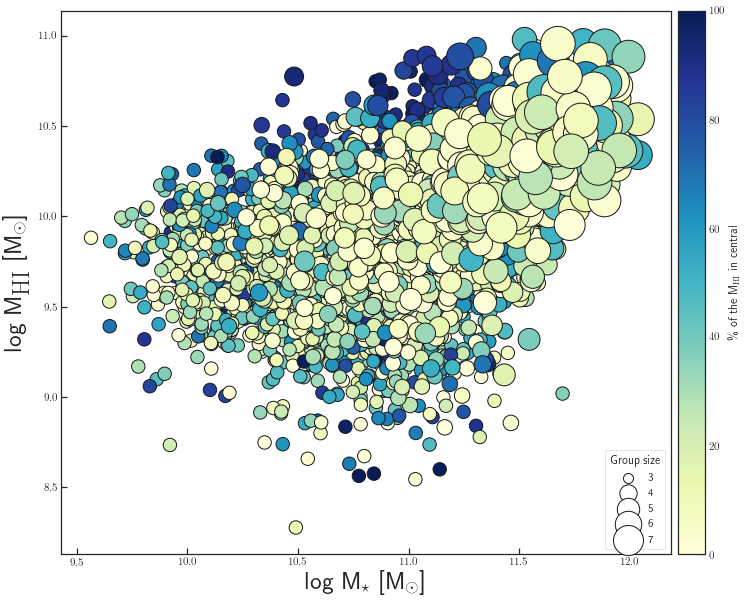

In [85]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
#df_percent['StellarM'] = df_percent['StellarM'].astype(np.float64) 
#df_percent['HImass'] = df_percent['HImass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']

sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), np.log10(df_percent['GroupHIMass']), s=60*df_percent['GroupSize'],
                        c=df_percent['Percent'], edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'\% of the M$_{\mathrm{HI}}$ in central',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=4)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')

labels = ["3", "4", "5", "6", '7']

leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=4, framealpha=0.5)
leg.set_title('Group size')                   
                   
#plt.ylim(6,11)

In [86]:
# Initiate figure and how large it will be
@jit
def HI_group_distribution(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(nrows=4, ncols=4, sharex='col', sharey='row', figsize=(18, 15))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    sat_g = []
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    row_count = 0
    for size in trange(1, 16, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
            
        if size % 4 == 0:
            row_count += 1
        this_ax = ax[row_count, size%4] #Axis. Created for plotting 3x3 plots
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.

        sat_mass = np.sum(G['DiscHI'],axis=1)[sat_gals]
        sat_g.append(sat_gals)
        
        sum_of_all_satellites = np.sum(sat_mass)
        print(sum_of_all_satellites)
        
        sum_satellite_stellar = np.sum(G['StellarMass'][sat_gals])
        
        percentage = (np.sum(G['DiscHI'],axis=1)[central_gals]/(np.sum(G['DiscHI'],axis=1)[central_gals]+sum_of_all_satellites))*100
        #per_cent.append(percentage[0])
        groupHI = (np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h+1) + sum_of_all_satellites*1e10/h
        groupSt = (G['StellarMass'][central_gals]*1e10/h+1) + sum_satellite_stellar*1e10/h
        
        # Do plotting of groups of N-length; it will be placed on each subplot + +.
        # Centrals

        im = this_ax.scatter(np.log10(groupSt), np.log10(groupHI), s=300,
                        c=percentage, edgecolor='k', cmap=cm)

        # Add label for each sub-plot to know the group size and what is central/satellite
        this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %group_size)
        this_ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
        this_ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
        this_ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
        #Add legend    
        leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
        
    # Add x and y axis labels only on the plot edges since there will be no space between panels
    for row in range(3):
        this_ax = ax[row,0]
        this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    for col in range(3):
        this_ax = ax[2,col]
        this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    # Tight layout and remove spacing between subplots
    plt.tight_layout()
    # My first plot is only single galaxies so I add legend separately
    ax[0][0].legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    plt.show()
    print(sat_g)
    #return fig


# Bulge to total ratio (BTT)

In [87]:
#BTT_cen.ravel().tolist()

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


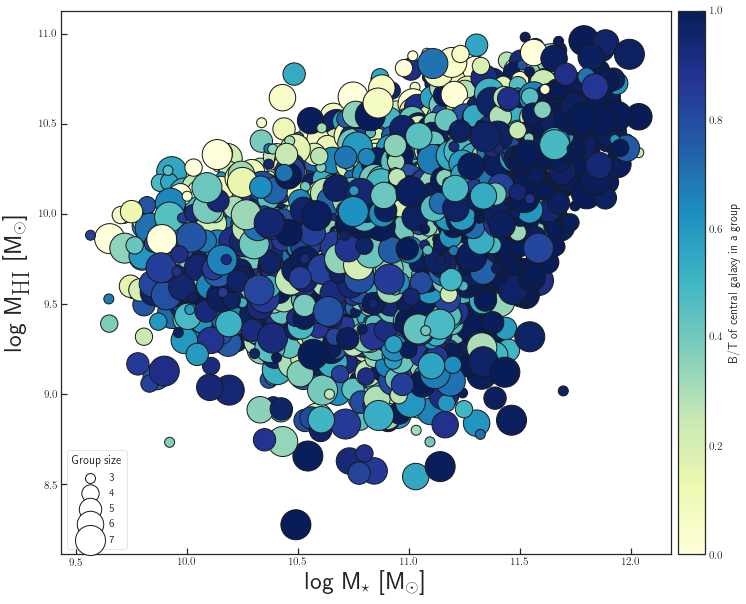

In [88]:

fig = plt.figure(figsize=(13,10))                                                               
ax = fig.add_subplot(1,1,1)

cm = plt.cm.get_cmap('YlGnBu')
#Numpy doesn't know what you might have stored in a object array, 
BTT_cen = BTT_cen.astype(np.float64) 
#df_percent['HImass'] = df_percent['HImass'].astype(np.float64)

#BE CAREFUL HERE! Constructed sizes are OK for current groups; will need change
#s = 80*df_percent['Group_size']
sizes = [100,300,500,700,900]
im = plt.scatter(np.log10(df_percent['GroupStellarMass']), np.log10(df_percent['GroupHIMass']), s=sizes,
                        c=BTT_cen.ravel().tolist(), edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')

fig.colorbar(im, ax=ax, orientation='vertical', label=r'B/T of central galaxy in a group',
            pad=0.01)

ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
ax.legend(loc=3)
leg = ax.get_legend()
leg.legendHandles[0].set_color('k')

l1 = plt.scatter([],[], s=100, color='white',edgecolors='k')
l2 = plt.scatter([],[], s=300, color='white',edgecolors='k')
l3 = plt.scatter([],[], s=500, color='white',edgecolors='k')
l4 = plt.scatter([],[], s=700, color='white',edgecolors='k')
l5 = plt.scatter([],[], s=900, color='white',edgecolors='k')

labels = ["3", "4", "5", "6", '7']

leg = plt.legend([l1, l2, l3, l4, l5], labels, ncol=1, loc=3, framealpha=0.5)
leg.set_title('Group size')                   
                   
#plt.ylim(6,11)

## N times N with B/T

In [89]:
# Initiate figure and how large it will be
@jit
def mhi_vs_ms_3x3_colorbar(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(nrows=4, ncols=5, sharex='col', sharey='row', figsize=(18, 15))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    cm = plt.cm.get_cmap('YlGnBu')
    ax[0][0].scatter(np.log10(Mstellar_single_gal), 
                     np.log10(Mcoldgas_single_gal), 
                     c = BTT_single, s=80, edgecolor='k', cmap=cm)
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    row_count = 0
    for size in trange(1, 20, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
            
        if size % 5 == 0:
            row_count += 1
        this_ax = ax[row_count, size%5] #Axis. Created for plotting 3x3 plots
        
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
        
        BTT_central = groups_dict[group_size]["Centrals"]
        BTT_satellite = groups_dict[group_size]["Satellites"]
        
        # Plot single galaxies           
        #this_ax.plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8)
        
            
        # Do plotting of groups of N-length; it will be placed on each subplot + +.
        # Centrals
        
        #im = plt.scatter(np.log10(df_percent['StellarM']+1), np.log10(df_percent['HImass']*1e10/h+1), s=80*df_percent['GroupSize'],
        #                c=df_percent['BTT_central'], edgecolor='k', cmap=cm, label=r'Groups ($N\geq3$) properties')
        
        cm = plt.cm.get_cmap('YlGnBu')
        this_ax.scatter(np.log10(G['StellarMass'][central_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h), 
                     c = BTT[BTT_central], s=80, edgecolor='k', cmap=cm)    
                     
        # Satellites
        im = this_ax.scatter(np.log10(G['StellarMass'][sat_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h), 
                         c = BTT[BTT_satellite], s=80, cmap=cm)
    
        # Add label for each sub-plot to know the group size and what is central/satellite
        this_ax.plot([], [], 'o', color='white', label='Groups of %.f' %group_size)
        this_ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
        this_ax.plot([], [], 'o', color='#1f78b4', markersize=8, label='Satellite')
        this_ax.plot([], [], 'o', color='white', markeredgecolor='#1f78b4', markersize=8, markeredgewidth=2, label='Central')
        #Add legend    
        leg = this_ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
        
    # Add x and y axis labels only on the plot edges since there will be no space between panels
    for row in range(4):
        this_ax = ax[row,0]
        this_ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    for col in range(5):
        this_ax = ax[2,col]
        this_ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    # Tight layout and remove spacing between subplots
    plt.tight_layout()
    # My first plot is only single galaxies so I add legend separately
    
    # COLORBAR INSIDE SUBPLOT
    #from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    #cbaxes = inset_axes(ax[0][0], width="5%", height="50%", loc='center right') #loc=l, bbox_to_anchor=(0.6,0.5)
    #plt.colorbar(im, cax=cbaxes, ticks=[0.,0.5,1], orientation='vertical')
    #cbaxes.yaxis.set_ticks_position('left')
    
    ax[0][0].legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=20)

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)

    # COLORBAR for the entire plot
    plt.colorbar(im, ax=ax[:, 4], pad=0.01, label=r'B/T ratio')
    plt.show()
    #return fig


100%|██████████| 19/19 [00:03<00:00,  4.79it/s]
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


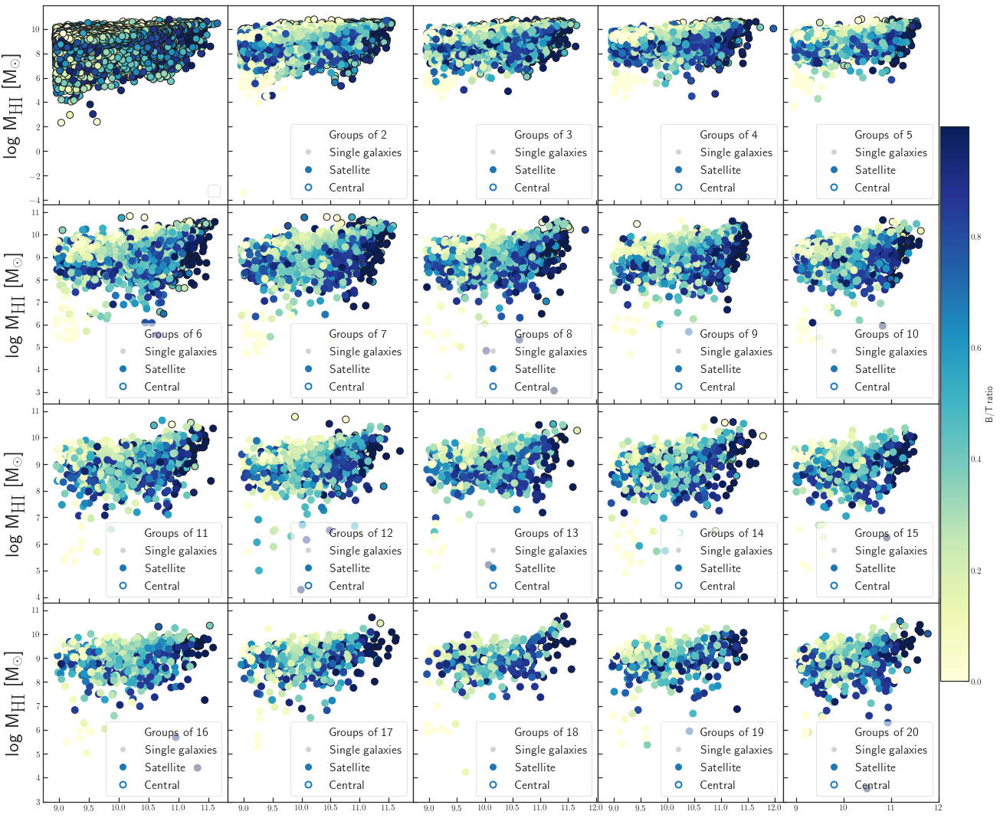

In [90]:
mhi_vs_ms_3x3_colorbar(updated_dict)

In [91]:
# Initiate figure and how large it will be
@jit
def BT_distribution(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(figsize=(8,8))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    
    BTT_c = []
    BTT_s = []
    
    for size in trange(1, 20, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
    
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
        
        BTT_central = groups_dict[group_size]["Centrals"]
        BTT_satellite = groups_dict[group_size]["Satellites"]
        
        BTT_c.extend(BTT[BTT_central])
        BTT_s.extend(BTT[BTT_satellite])
    
    binwidth=0.1
    bins = np.arange(0, 1.1, binwidth)
    plt.hist(BTT_s, bins=bins, color='#2c7fb8', edgecolor='k', linewidth=1, alpha=0.8, label='Satellite')
    plt.hist(BTT_c, bins=bins, color='white', edgecolor='#2c7fb8', linewidth=4, alpha=0.6, label='Central')

    
    leg = ax.legend(loc=1,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)
    
    ax.set_xlabel(r'B/T ratio',fontsize=25)
    ax.set_ylabel(r'N$_{\textrm{galaxies}}$',fontsize=25)
    
    plt.tight_layout()

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    plt.xlim(-0.05,1.05)
    plt.show()
    #return fig


100%|██████████| 19/19 [00:00<00:00, 2290.59it/s]
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


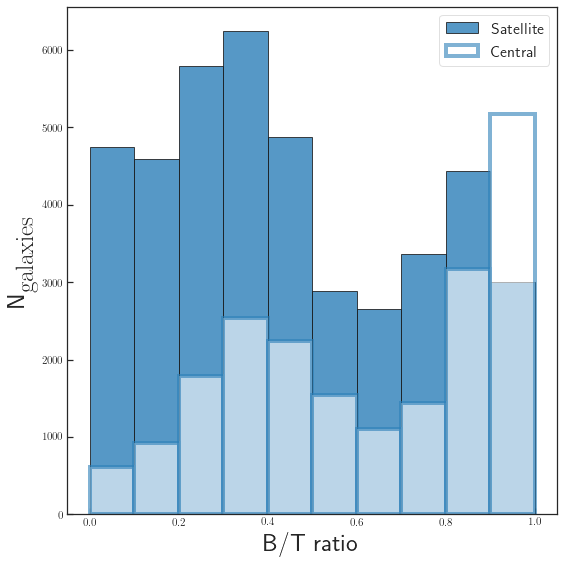

In [92]:
BT_distribution(updated_dict)

In [93]:
# Initiate figure and how large it will be
@jit
def mhi_vs_ms_colorbar(groups_dict):
    
    """
    Make 3x3 plot (HI mass vs Stellar mass) with galaxy groups based on the number of galaxies in a group and separate in each group central
    and satellite galaxy.
    
    Parameters
    ==========
    groups_dict: Dictionary. Keyed by the group size. Use: ``groups_dict[group_size]["Centrals"]``
                 Extracts groups with size N and the satellite & central galaxies
                 Created dictionary from (def create_cen_sat_from_groups_dict)
  
    Returns
    =======
    3x3 Figure with M_HI versus M_*
    
    Usage
    =====
    To use type: ``mhi_vs_ms_3x3(updated_dict) ``
                 Where updated_dict is the dictionary that is parsed to plotting function
                 ``updated_dict = create_cen_sat_from_groups_dict(groups, store_cen_indices)``
    
    """
    
    
    fig, ax = plt.subplots(figsize=(15, 12))
    
    #ax[0][0].plot(np.log10(Mstellar_single_gal), np.log10(Mcoldgas_single_gal), 'o', color='lightgrey',markersize=8, label='Single galaxies')
    
    # Put plot in row and columns:3by3 are 00, 01, 02, 10, 11, 12, 20, 21, 22 
    for size in trange(1, 9, 1): #I'm planning to have 1-9 sized groups. Made to form trange(1, 9, 1) as 3x3 pannels 
    
        group_size = size+1 # Select number of galaxies per group --- adding +1 because it is counting from 0.
    
        central_gals = groups_dict[group_size]["Centrals"]  #List of integers. Contains indices of central galaxies.  List is obtained through the dictionary. 
        sat_gals = groups_dict[group_size]["Satellites"] #List of integers. Contains indices of satellite galaxies. List is obtained through the dictionary.
        
        BTT_central = groups_dict[group_size]["Centrals"]
        BTT_satellite = groups_dict[group_size]["Satellites"]
        

        cm = plt.cm.get_cmap('YlGnBu')
        ax.scatter(np.log10(G['StellarMass'][central_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[central_gals]*1e10/h), 
                     c = BTT[BTT_central], s=150, edgecolor='k', linewidth=1, cmap=cm)    
                     
        # Satellites
        ax.scatter(np.log10(G['StellarMass'][sat_gals]*1e10/h), 
                         np.log10(np.sum(G['DiscHI'],axis=1)[sat_gals]*1e10/h), 
                         c = BTT[BTT_satellite], s=150, cmap=cm)
    
        # Add label for each sub-plot to know the group size and what is central/satellite
        #ax.plot([], [], 'o', color='lightgrey', label='Single galaxies')
    ax.plot([], [], 'o', color='#1f78b4', markersize=10, label='Satellite')
    ax.plot([], [], 'o', color='white', markeredgecolor='k', markersize=10, markeredgewidth=3, label='Central')
        #Add legend  
        
    ax.set_xlabel(r'log M$_{\star}$ [M$_{\odot}$]', fontsize=25)
    ax.set_ylabel(r'log M$_{\textrm{HI}}$ [M$_{\odot}$]',fontsize=25)
    
    leg = ax.legend(loc=4,frameon=True,fancybox=True, framealpha=0.6, fontsize=16)

    plt.tight_layout()

    plt.subplots_adjust(wspace = 0.0, hspace = 0.0)
    
    # COLORBAR for the entire plot
    plt.colorbar(im, ax=ax, pad=0.01, label=r'B/T ratio')
    plt.ylim(2,11.5)
    plt.show()
    #return fig


100%|██████████| 8/8 [00:01<00:00,  5.91it/s]
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


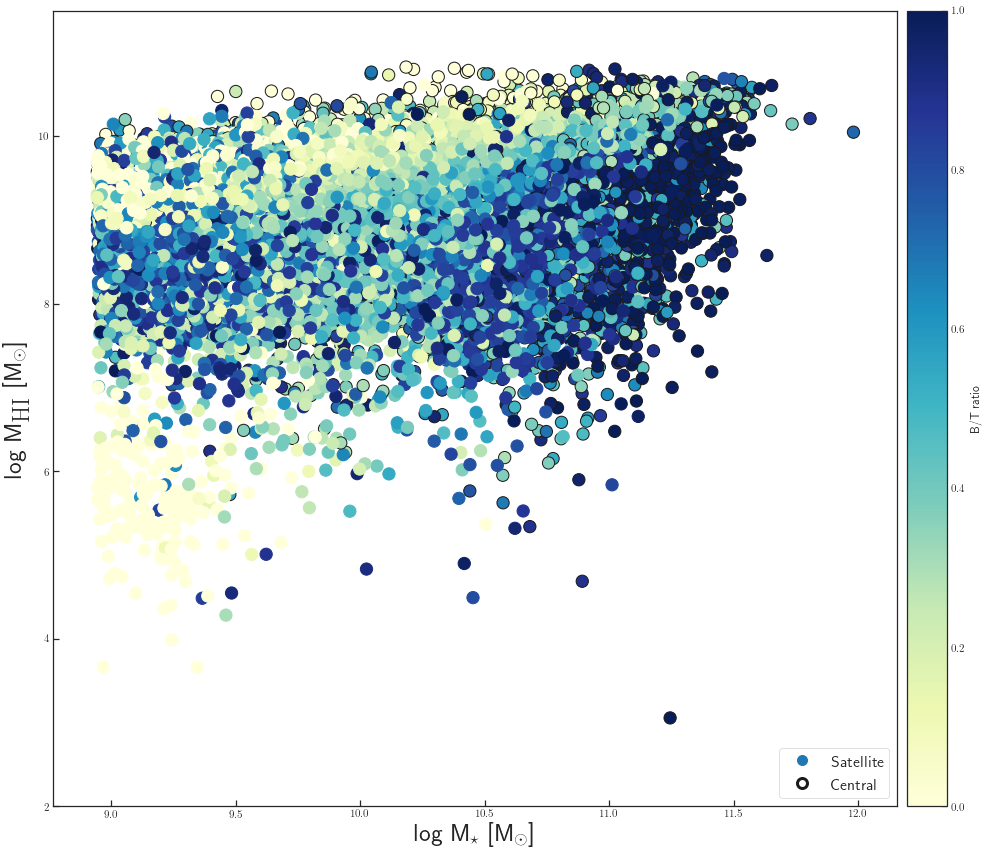

In [94]:
mhi_vs_ms_colorbar(updated_dict)

# How the group look like (Mvir/Rvir/Pos)
#### Make a function to extract parameters

In [95]:
for i in c_ind[0:5]:
    print(i, G['Rvir'][i][0:])


[981] [0.27567366]
[994] [0.18490659]
[1324] [0.18081096]
[1511] [0.08291441]
[2152] [0.14341983]


In [96]:
for i in g_ind[0:5]:
    print(G['Pos'][i][0:])

[[ 14.069526 497.66397   43.96974 ]
 [ 13.939832 497.74933   44.09529 ]
 [ 14.123639 497.45767   44.098263]]
[[ 15.879589 498.96158   43.661137]
 [ 15.938244 499.02756   43.62672 ]
 [ 15.747075 498.91888   43.879242]]
[[  4.3075085  13.855656  499.77805  ]
 [  4.235369   13.813037  499.95203  ]
 [  4.4794354  13.564551  499.93375  ]]
[[ 54.3965    60.635124 499.44687 ]
 [ 54.26466   60.97239  499.54718 ]
 [ 54.440594  60.796658 499.41495 ]]
[[44.460167 51.243183 39.577137]
 [44.319397 51.269867 39.564552]
 [44.5661   51.073048 39.552715]]


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


14.069526
13.939832
14.123639


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


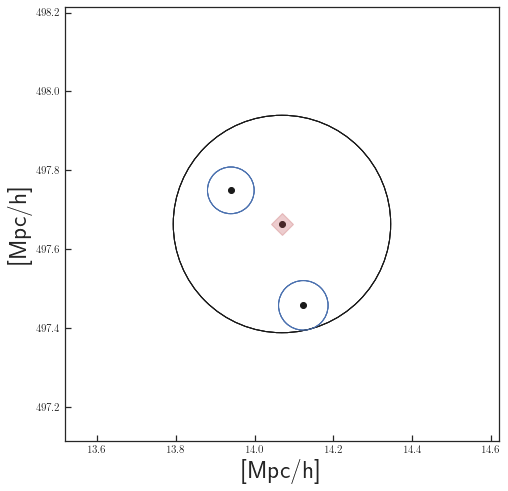

In [97]:
fig, ax = plt.subplots(figsize=(8,8))
for i in g_ind[0]:
    print(G['Pos'][i][0])
    
    
    plt.plot( (G['Pos'][i])[0], (G['Pos'][i])[1], 'ko')
    plt.plot( 14.069526, 497.66397, 'rD', markersize=15, alpha=0.1)
    
    circle1 = plt.Circle((14.069526, 497.66397), 0.27567366, color='k', fill=False, clip_on=False)
    
    circle2 = plt.Circle((13.939832, 497.74933), 0.05918148, color='b', fill=False, clip_on=False)
    circle3 = plt.Circle((14.123639, 497.45767), 0.06282725, color='b', fill=False, clip_on=False)
    
    ax.add_artist(circle1)
    ax.add_artist(circle2)
    ax.add_artist(circle3)
    
    #plt.tight_layout()
    ax.set_aspect('equal')
    plt.xlim(14.069526-2*0.27567366,14.069526+2*0.27567366)
    plt.ylim(497.66397-2*0.27567366, 497.66397+2*0.27567366)
    
    ax.set_xlabel(r'[Mpc/h]', fontsize=25)
    ax.set_ylabel(r'[Mpc/h]',fontsize=25)

In [162]:
#HI Masses, obtained from the indices: 
perc_richer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[perc_richer_central_ind] *1e10/h )+1)
perc_poorer_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[perc_poorer_central_ind] *1e10/h )+1)
perc_richer_central_s_m = np.log10( G['StellarMass'][perc_richer_central_ind] *1e10/h +1)
perc_poorer_central_s_m = np.log10( G['StellarMass'][perc_poorer_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
perc_richer_sat_hi_m = []
perc_richer_sat_s_m = []

for item in perc_richer_sat_ind:
    p_richer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[item] *1e10/h )+1)
    p_richer_sat_s_m = np.log10( G['StellarMass'][item] *1e10/h +1)
    perc_richer_sat_hi_m.append(p_richer_sat_hi_m)
    perc_richer_sat_s_m.append(p_richer_sat_s_m)

perc_poorer_sat_hi_m = []
perc_poorer_sat_s_m = []
for item in perc_poorer_sat_ind:    
    p_poorer_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[item] *1e10/h )+1)
    p_poorer_sat_s_m = np.log10( G['StellarMass'][item] *1e10/h +1)
    perc_poorer_sat_hi_m.append(p_poorer_sat_hi_m)
    perc_poorer_sat_s_m.append(p_poorer_sat_s_m)


INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


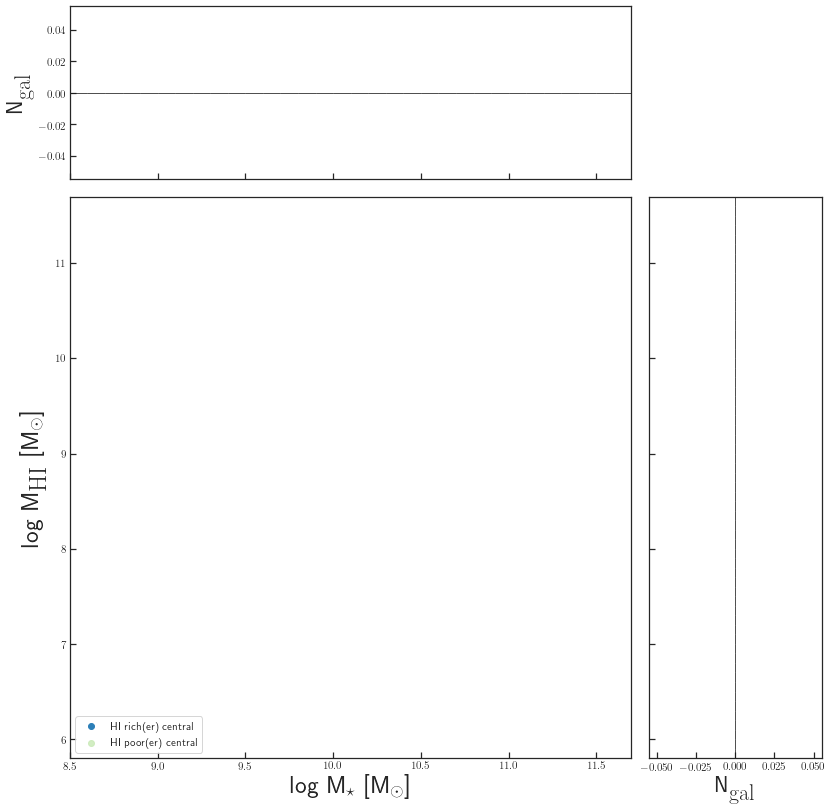

In [163]:
two_sided_histogram_rich(perc_richer_central_s_m, perc_richer_central_hi_m, 
                         perc_poorer_central_s_m, perc_poorer_central_hi_m) 

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


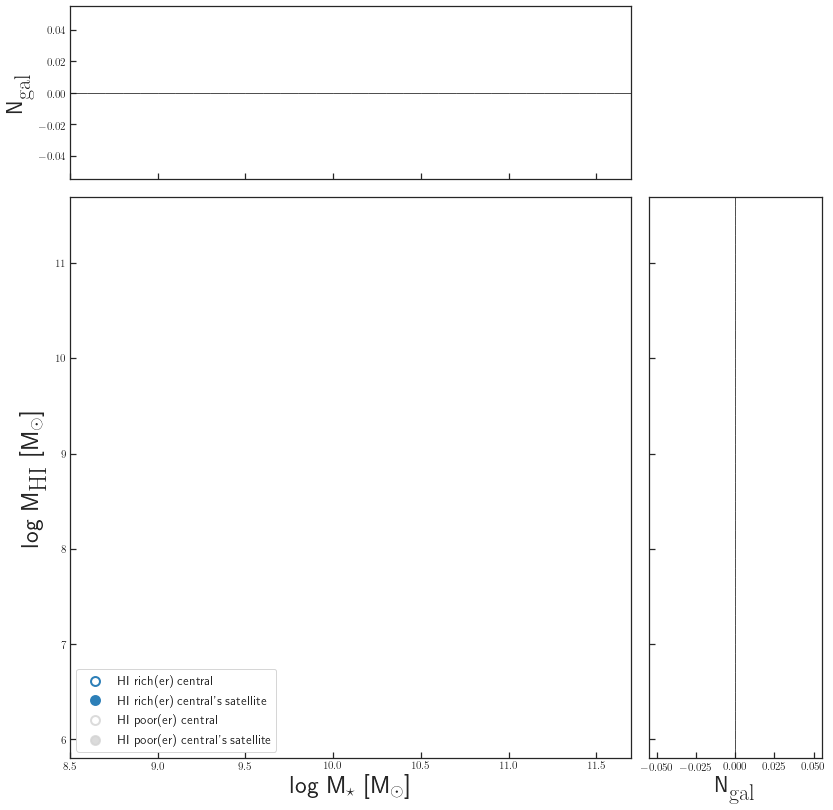

In [164]:
two_sided_histogram_rich_groups(perc_richer_central_s_m.ravel(), perc_richer_central_hi_m.ravel(), 
                                perc_poorer_central_s_m.ravel(), perc_poorer_central_hi_m.ravel(),
                                perc_richer_sat_s_m, perc_richer_sat_hi_m, 
                                perc_poorer_sat_s_m, perc_poorer_sat_hi_m) 


# Central and satellite (similar Mstar; large MHI difference)
##### Takes too long to run

In [167]:
#Use dictionary and for each galaxy in "Groups" of 3 show central/satellite index

diff_central_ind = [] #storring where central/satellite is above/below some percentage
norm_diff_central_ind = []

norm_diff_sat_ind = [] #satellites that belong to richer central
diff_sat_ind = [] #satellites that belong to poorer central

diff_groups = []
gr_key = []
#per_cent = [] # How much of HI mass is in central galaxy (in %)
@jit
def find_j1250_like_distribution():
    for i in trange(3,4,1): #starting grom galaxy pairs
        for group_key in updated_dict[i]["Groups"].keys():
            #print(group_key) #group_1 etc
            central_idx = updated_dict[i]["Groups"][group_key]["Centrals"] #give indices
            central_mass = np.log10(np.sum(G['DiscHI'],axis=1)[central_idx]*1e10/h +1) #give masses of these galaxies
            central_star_mass = np.log10(G['StellarMass'][central_idx]*1e10/h +1)
            
            satellite_inds = updated_dict[i]["Groups"][group_key]["Satellites"]
            sat_mass = np.log10(np.sum(G['DiscHI'],axis=1)[satellite_inds]*1e10/h +1)
            sat_star_mass = np.log10(G['StellarMass'][satellite_inds]*1e10/h +1)
            
            sum_of_all_satellites = np.sum(sat_mass)
            percentage = (central_mass/(central_mass+sum_of_all_satellites))*100
            per_cent.append(percentage[0])
            
            diff_in_star_mass = abs(central_star_mass - sat_star_mass) #abs difference in stellar masses
            #print(central_star_mass)
            #print(sat_star_mass)
            #print('diff star', diff_in_star_mass)
            diff_in_hi_mass = abs(central_mass - sat_mass) #abs difference in HI mass
            #print('hi cent mass', central_mass)
            #print('hi sat mass', sat_mass)
            
            if ((diff_in_star_mass < 0.4).all() & (diff_in_hi_mass > 0.8 ).all()):
                print('diff_st', diff_in_star_mass)
                print('diff_hi', diff_in_hi_mass)
                
                #print('yes')#check conditions
    #            print("Central has more HI than the sum of satellites")
                diff_central_ind.append(central_idx[0]) #[0] so its creates a list
                diff_sat_ind.extend(satellite_inds) #it complains and complicates when i want to do .append
                diff_groups.append(updated_dict[i]["Groups"][group_key]['Centrals'][0])
                diff_groups.extend(satellite_inds)
                gr_key.append(group_key)
            else:
    #            print("Sum of the satellites are more massive than central")
                norm_diff_central_ind.append(central_idx[0])
                norm_diff_sat_ind.extend(satellite_inds)
    #        #print(sat_mass > central_mass)
    #    
    #        print("Central mass is {0} and sat masses are {1}".format(central_mass, sat_mass))
    #        print("")


In [168]:
find_j1250_like_distribution()


  0%|          | 0/1 [00:00<?, ?it/s]

diff_st [0.08206463 0.31248093]
diff_hi [10.229951  9.061352]
diff_st [0.34529114 0.06172562]
diff_hi [1.3861694 0.980216 ]
diff_st [0.35604858 0.39379597]
diff_hi [1.725626  1.0154037]
diff_st [0.34536648 0.01626396]
diff_hi [1.0833902 1.001976 ]
diff_st [0.14407635 0.04946327]
diff_hi [8.8755865 8.8334875]
diff_st [0.17250347 0.2853527 ]
diff_hi [1.9135108 1.5999713]
diff_st [0.1995287 0.335433 ]
diff_hi [1.2247534 0.9045162]
diff_st [0.31858158 0.31555367]
diff_hi [0.89769363 1.2623177 ]
diff_st [0.297534  0.2145052]
diff_hi [9.381781 9.664302]
diff_st [0.2896881  0.26909924]
diff_hi [1.7990522 1.2221317]
diff_st [0.14000034 0.3312893 ]
diff_hi [1.1634445 0.9467926]
diff_st [0.3360319  0.11148071]
diff_hi [2.439475 2.79008 ]
diff_st [0.01389599 0.2728405 ]
diff_hi [1.2952671 0.9390173]
diff_st [0.08139992 0.10401535]
diff_hi [1.1512203 0.8087168]
diff_st [0.34866905 0.261405  ]
diff_hi [2.129826  1.7329202]
diff_st [0.28477383 0.0391016 ]
diff_hi [1.0993767 1.1102705]
diff_st [0.372


100%|██████████| 1/1 [02:21<00:00, 141.02s/it]


In [169]:
print(diff_groups)
print(gr_key)


[3036, 3037, 3038, 3700, 3701, 3702, 13572, 13573, 13574, 14246, 14247, 14248, 23186, 23187, 23188, 35950, 35951, 35952, 37010, 37011, 37012, 37992, 37994, 37993, 47652, 47653, 47654, 58775, 58776, 58777, 59550, 59551, 59552, 65021, 65022, 65023, 68948, 68949, 68950, 69436, 69437, 69438, 70130, 70132, 70131, 74507, 74508, 74509, 74810, 74811, 74812, 85549, 85550, 85551, 110534, 110536, 110535, 110838, 110839, 110840, 121095, 121096, 121097, 126704, 126705, 126706, 137629, 137630, 137631, 158213, 158214, 158215, 163380, 163382, 163381, 167505, 167507, 167506, 188964, 188965, 188966, 189262, 189263, 189264, 198901, 198903, 198902, 199072, 199074, 199073, 208020, 208021, 208022, 209583, 209584, 209585, 212101, 212103, 212102, 219167, 219168, 219169, 220686, 220687, 220688, 229337, 229338, 229339, 229598, 229600, 229599, 230309, 230310, 230311, 230338, 230339, 230340, 240397, 240398, 240399, 257001, 257002, 257003, 257123, 257124, 257125, 260202, 260203, 260204, 260396, 260397, 260398, 260

In [170]:
#HI Masses, obtained from the indices: 
diff_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[diff_central_ind] *1e10/h )+1)
diff_central_s_m = np.log10( G['StellarMass'][diff_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
diff_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[diff_sat_ind] *1e10/h )+1)
diff_sat_s_m = np.log10( G['StellarMass'][diff_sat_ind] *1e10/h +1)

#HI Masses, obtained from the indices: 
norm_diff_central_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[norm_diff_central_ind] *1e10/h )+1)
norm_diff_central_s_m = np.log10( G['StellarMass'][norm_diff_central_ind] *1e10/h +1)

#have to store satellites like this; otherwise it complains
norm_diff_sat_hi_m = np.log10( (np.sum(G['DiscHI'],axis=1)[norm_diff_sat_ind] *1e10/h )+1)
norm_diff_sat_s_m = np.log10( G['StellarMass'][norm_diff_sat_ind] *1e10/h +1)

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


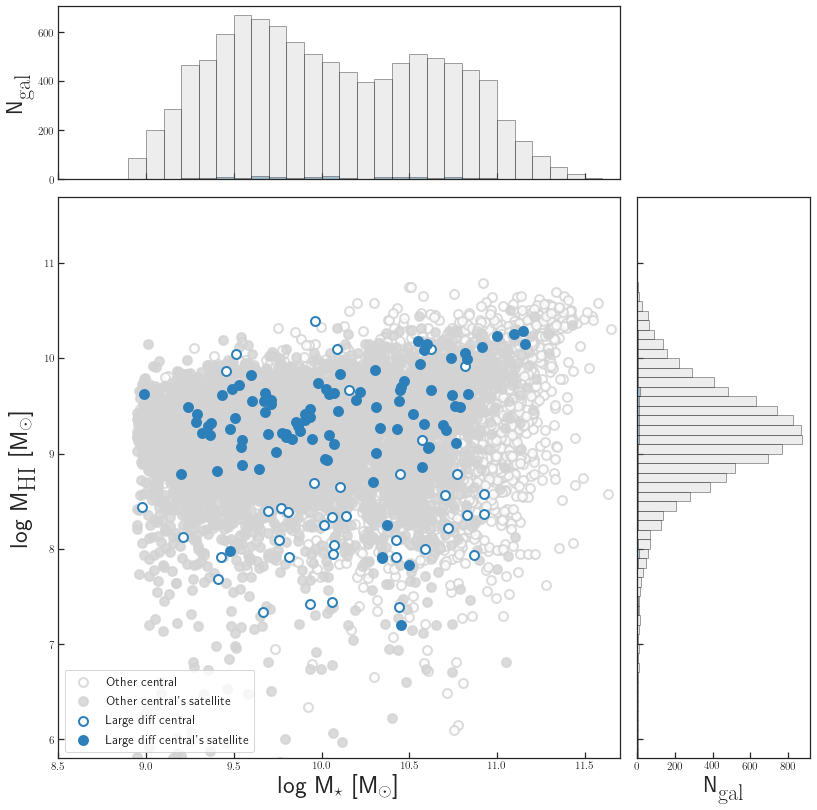

In [171]:
two_sided_histogram_difference(diff_central_s_m.ravel(), diff_central_hi_m.ravel(), 
                                norm_diff_central_s_m.ravel(), norm_diff_central_hi_m.ravel(),
                                diff_sat_s_m, diff_sat_hi_m, 
                                norm_diff_sat_s_m, norm_diff_sat_hi_m) 


In [88]:
item1 = 9
item2 = 12
diff_groups_sm = np.log10( G['StellarMass'][diff_groups] *1e10/h +1)
diff_groups_him = np.log10( (np.sum(G['DiscHI'],axis=1)[diff_groups] *1e10/h) +1)

INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.
INFO:matplotlib.texmanager:No LaTeX-compatible font found for the serif font family in rcParams. Using default.


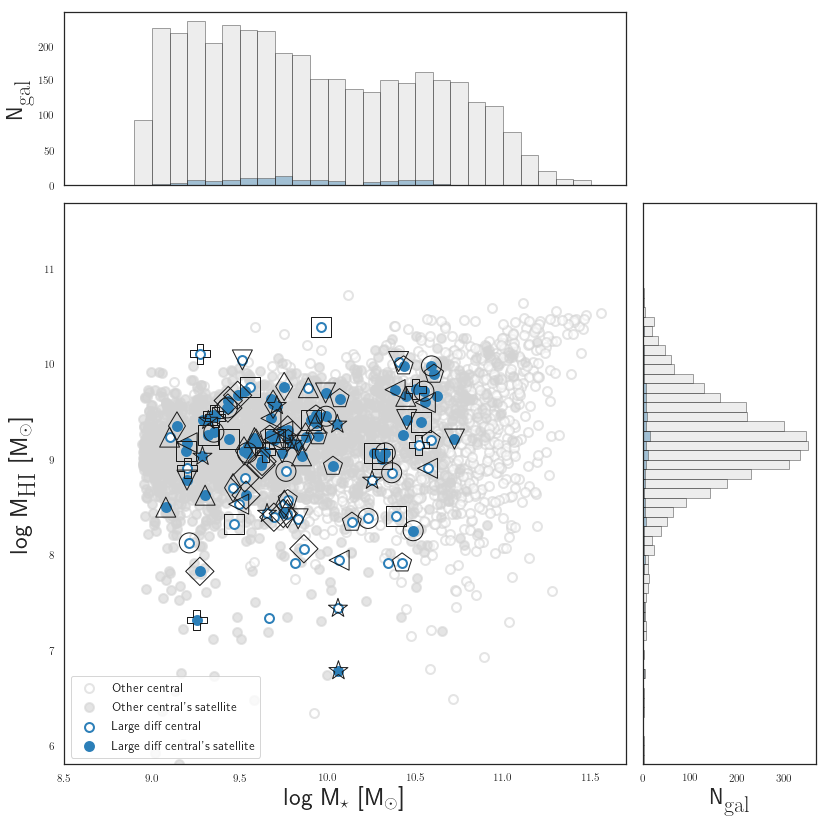

In [89]:

two_sided_histogram_difference_groups(diff_central_s_m.ravel(), diff_central_hi_m.ravel(), 
                                norm_diff_central_s_m.ravel(), norm_diff_central_hi_m.ravel(),
                                diff_sat_s_m, diff_sat_hi_m, 
                                norm_diff_sat_s_m, norm_diff_sat_hi_m,
                              diff_groups_sm, diff_groups_him) 

In [100]:
print(diff_groups)
print(diff_central_ind)
print(gr_key)

[426, 427, 428, 8443, 8444, 8445, 8485, 8486, 8487, 15042, 15043, 15044, 15087, 15088, 15089]
[426, 8443, 8485, 15042, 15087]
['Group_3', 'Group_20', 'Group_23', 'Group_52', 'Group_55']


In [101]:
for i in gr_key:
    print(updated_dict[3]["Groups"][i]) #shows indices of Nth group in groups of 3

{'Centrals': [426], 'Satellites': [427, 428]}
{'Centrals': [8443], 'Satellites': [8444, 8445]}
{'Centrals': [8485], 'Satellites': [8486, 8487]}
{'Centrals': [15042], 'Satellites': [15043, 15044]}
{'Centrals': [15087], 'Satellites': [15088, 15089]}


In [102]:
#Divide array into n-arrays
#f = lambda diff_groups, n=3: [diff_groups[i:i+n] for i in range(0, len(diff_groups), n)]
#New_groups = f(diff_groups)
#print(New_groups)

## Place colormap for centrals

In [103]:
import matplotlib.cm as cm
